# Searching for QPOs in Comet data.

We have some comet data, and we're looking for a period. 
Let's first load some packages.

In [ ]:
%matplotlib notebook
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_context('talk')
sns.set_style("whitegrid")
sns.set_palette('colorblind')

cdata = "black"
cmodel = "red"

import numpy as np
import pandas as pd
import scipy.stats
import scipy.optimize as op

from stingray import Lightcurve
from stingray import Powerspectrum

from stingray.pulse import z2_n_probability, z2_n_detection_level, z_n

import emcee
import george
from george import kernels
import corner



We have to load the data. It's in ASCII files, but I need to do some data wrangling, so let's load them in pandas DataFrames instead:

Combined APO and DCT Data set:

In [2]:
apo_dct = pd.read_csv("APO_DCT_A2017U1_2017_10_30_date_mjd_mag_r_mag_unc_obs_code.txt", sep=" ", 
                  names=["time", "mag", "mag_err", "ObsID"])

<IPython.core.display.Javascript object>


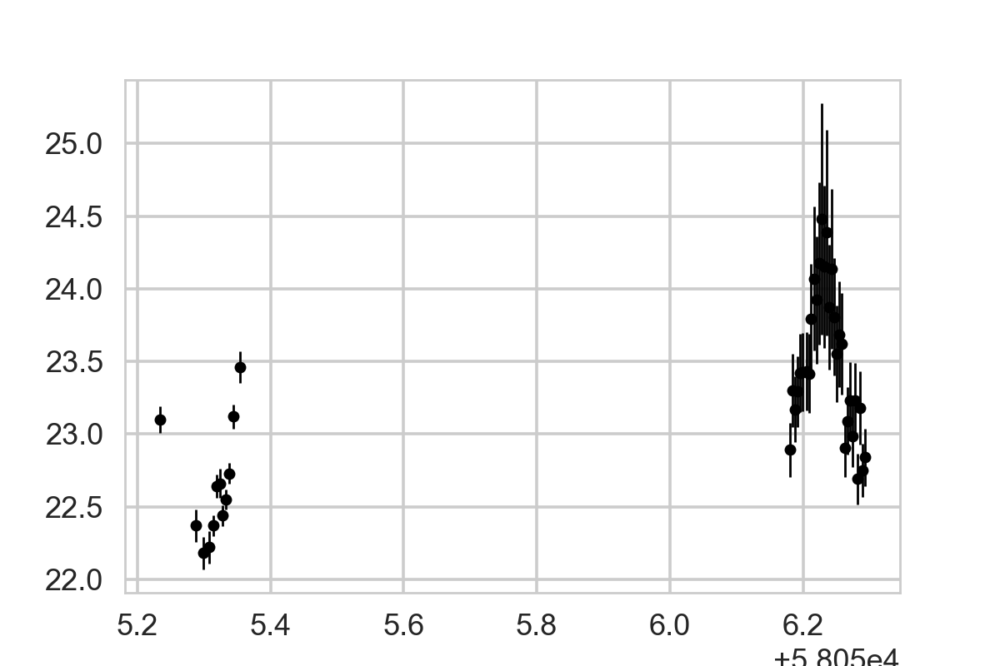

<Container object of 3 artists>

In [3]:
fig, ax = plt.subplots(1, 1, figsize=(6,4))

ax.errorbar(apo_dct.time, apo_dct.mag, yerr=apo_dct.mag_err, color="black", fmt="o", 
            markersize=5, linewidth=1)

In [4]:
data = apo_dct

## Fitting a Pure Sinusoid

Let's start with the simplest model: a pure sinusoidal model.

We'll define a Gaussian likelihood for the signal:

In [5]:
class GaussLikelihood(object):
    
    def __init__(self, x, y, yerr, model):
        self.x = x
        self.y = y
        self.yerr = yerr
        self.model = model
        
    def evaluate(self, pars, neg=False):

        mean_model = self.model(self.x, *pars)

        loglike = np.sum(-0.5*np.log(2.*np.pi) - np.log(self.yerr) -
                         (self.y-mean_model)**2/(2.*self.yerr**2))

        if not np.isfinite(loglike):
            loglike = -np.inf

        if neg:
            return -loglike
        else:
            return loglike
        
    def __call__(self, parameters, neg=False):
        return self.evaluate(parameters, neg)
        

Now we can set up the sinusoidal model:

In [42]:
def sinusoid(t, logamp, period, bkg):
    """
    A sinusoidal model.
    
    Parameters
    ----------
    t : iterable
        The dependent coordinate
        
    logamp : float
        The logarithm of the sinusoidal amplitude
        
    period : float
        The period of the sinusoid
        
    phase : float [0, 2*pi]
        The phase of the sinusoidal signal
        
    bkg : float
        The mean magnitude
    
    Returns
    -------
    res : numpy.ndarray
        The result
    """
    res = np.exp(logamp) * np.sin(2.*np.pi*t/period) + bkg
    return res

Does this work?

In [43]:
time = np.array(data["time"])
time -= 0.0
mag = np.array(data["mag"])
mag_err = np.array(data["mag_err"])

In [46]:
period = 4.0/24
amp = 1
bkg = 23.0
phase = 0.5

test_m = sinusoid(time, amp, period, bkg)
test_m2 = sinusoid(time, amp, period+0.01, bkg)



<IPython.core.display.Javascript object>


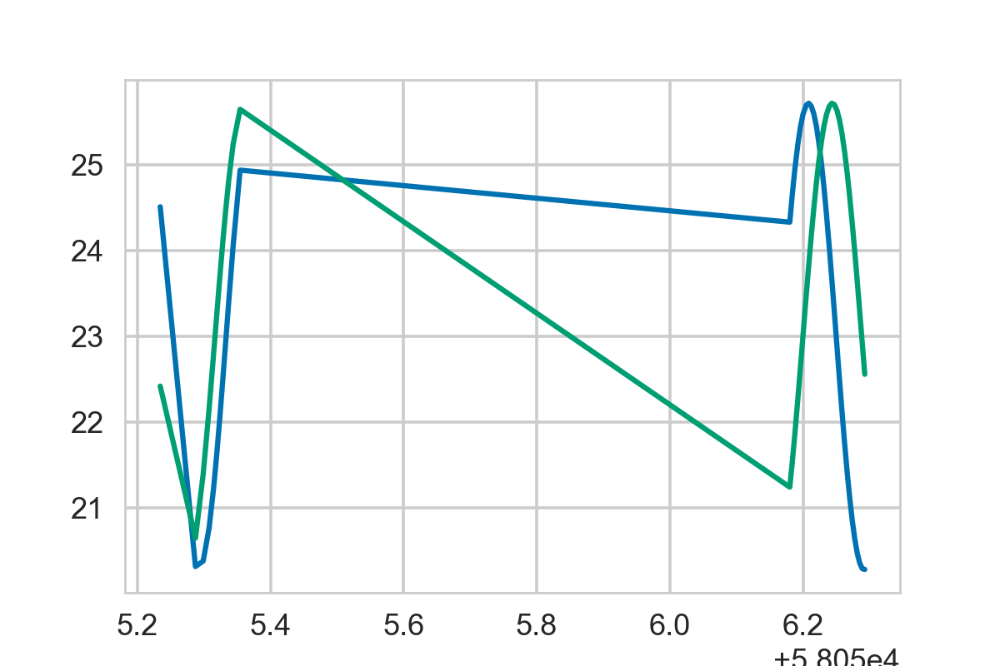

In [47]:
plt.figure(figsize=(6,4))
plt.plot(time, test_m)
plt.plot(time, test_m2)

Okay, that looks about right. Let's compute the log-likelihood:

In [48]:
loglike = GaussLikelihood(time, mag, mag_err, sinusoid)

In [49]:
test_pars = [np.log(amp), period, bkg]

In [50]:
loglike(test_pars, neg=False)

-148.47868217415461

In [51]:
test_pars = [np.log(amp), period+0.01, bkg]

In [52]:
loglike(test_pars, neg=False)

-430.58568966704934

In [53]:
test_pars = [np.log(amp), period,bkg+0.5]
loglike(test_pars, neg=False)

-491.55558119246058

In [54]:
test_pars = [np.log(amp), period,  bkg-0.5]
loglike(test_pars, neg=False)

-313.82146875172668

In [55]:
test_pars = [np.log(amp), period+0.2, bkg]
loglike(test_pars, neg=False)

-413.47977660768606

In [56]:
test_pars = [np.log(amp), period-0.5, bkg]
loglike(test_pars, neg=False)

-567.00287728433682

In [57]:
test_pars = [np.log(amp)-15.0, period-0.5, bkg]
loglike(test_pars, neg=False)

-199.94342086961245

Awesome, now let's define a Posterior so we can actually do MCMC:

In [20]:
vm = scipy.stats.vonmises(kappa=0.2)

In [58]:
class GaussPosterior(object):
    
    def __init__(self, x, y, yerr, model):
        self.x = x
        self.y = y
        self.yerr = yerr
        self.model = model
        
        self.loglikelihood = GaussLikelihood(x, y, yerr, model)
        #self.vm = scipy.stats.vonmises(kappa=0.2, loc=0.0)
        self.flat_prior = np.log(1/20.0) + np.log(1/(1 - 1/24.0)) + \
                          np.log(1/5.0) #+ np.log(1.0)
        
    def logprior(self, pars):
        logamp = pars[0]
        period = pars[1]
        #phase = pars[2]
        bkg = pars[2]
        
        if logamp < -20 or logamp > 20:
            return -np.inf
        elif period < 1/24.0 or period > 1.0:
            return -np.inf
        elif bkg < 20 or bkg > 25:
            return -np.inf 
        #elif phase < 0 or phase > 1.0:
        #    return -np.inf
        else:
            return self.flat_prior
        
    def logposterior(self, pars, neg=False):
        lpost = self.logprior(pars) + self.loglikelihood(pars, neg=False)
        
        if not np.isfinite(lpost):
            lpost = -np.inf
            
        if neg:
            return -lpost
        else:
            return lpost
        
    def __call__(self, pars, neg=False):
        return self.logposterior(pars, neg)

Okay, cool, we've assumed some reasonable priors for the problem, now let's see whether that works:

In [59]:
lpost = GaussPosterior(time, mag, mag_err, sinusoid)

In [60]:
test_pars = [np.log(amp), period, bkg]

In [61]:
lpost(test_pars)

-153.04129274572392

Let's make sure the priors all work correctly:

In [63]:
# should not pass, amplitude out of range:
test_pars = [-21, period, bkg]
print(lpost(test_pars))

# should not pass, amplitude out of range:
test_pars = [30, period, bkg]
print(lpost(test_pars))

-inf
-inf


In [64]:
##### should not pass, period out of range:
test_pars = [np.log(amp), 0.5/24, bkg]
print(lpost(test_pars))
##### should not pass, period out of range:
test_pars = [np.log(amp), 25/24, bkg]
print(lpost(test_pars))

-inf
-inf


In [65]:
##### should not pass, phase out of range:
#test_pars = [np.log(amp), period, -0.1, bkg]
#print(lpost(test_pars))
##### should not pass, phase out of range:
#test_pars = [np.log(amp), period, 1.1, bkg]
#print(lpost(test_pars))

In [67]:
##### should not pass, bkg out of range:
test_pars = [np.log(amp), period, 19]
print(lpost(test_pars))
##### should not pass, bkg out of range:
test_pars = [np.log(amp), period, 25.2]
print(lpost(test_pars))

-inf
-inf


Okay, that seems to work correctly, I think. I'm going to test the above on some simulated data, just to be sure I do the right thing:

In [68]:
logamp = 0.0
period = 4/24.0
phase = 0.5
bkg = 23.0

fake_pars = [logamp, period, bkg]

mag_model = sinusoid(time, logamp, period, bkg)
fake_mag = mag_model + np.random.normal(loc=0.0, scale=mag_err/2)

<IPython.core.display.Javascript object>


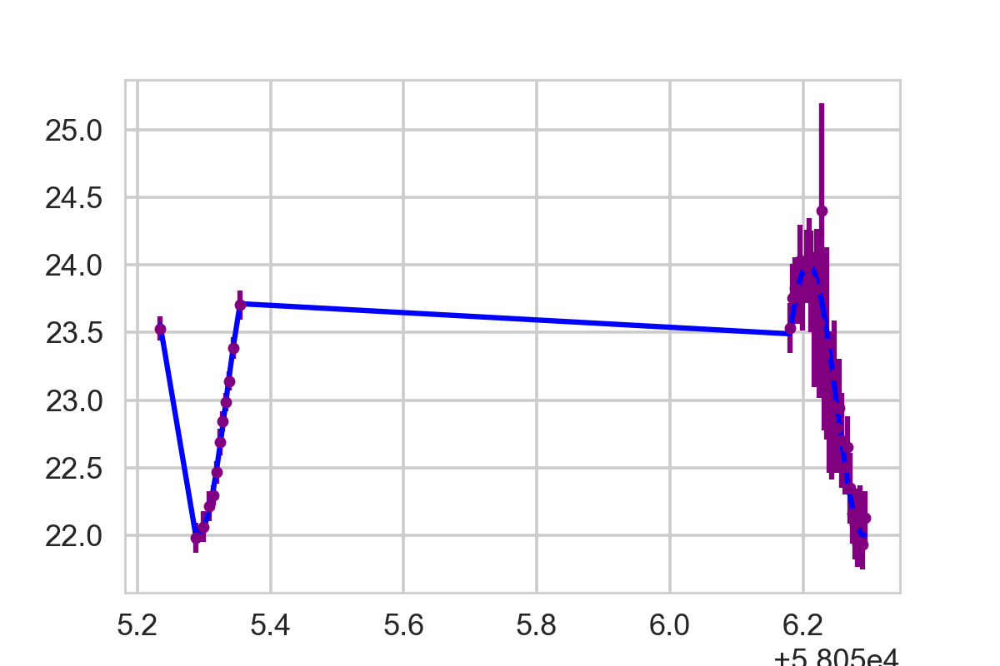

In [69]:
plt.figure(figsize=(6,4))

plt.errorbar(time, fake_mag, yerr=mag_err, fmt="o", markersize=5, color="purple")
plt.plot(time, mag_model, color="blue")

Okay, let's do some optimization on that:

In [70]:
fake_lpost = GaussPosterior(time, fake_mag, mag_err, sinusoid)

In [71]:
true_pars = [logamp, period, bkg]

In [72]:
fake_lpost(true_pars, neg=False)

16.152021890457604

In [73]:
test_pars = [logamp, period+0.4, bkg]
fake_lpost(test_pars, neg=False)

-673.39633653882026

In [74]:
start_pars = [-0.1, 4/24.0, 23.5]

res = op.minimize(fake_lpost, start_pars, args=(True), method="powell")

/opt/local/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/scipy/optimize/optimize.py:1927: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


In [75]:
res.x

array([ -2.47157707e-03,   1.66651834e-01,   2.29861771e+01])

<IPython.core.display.Javascript object>


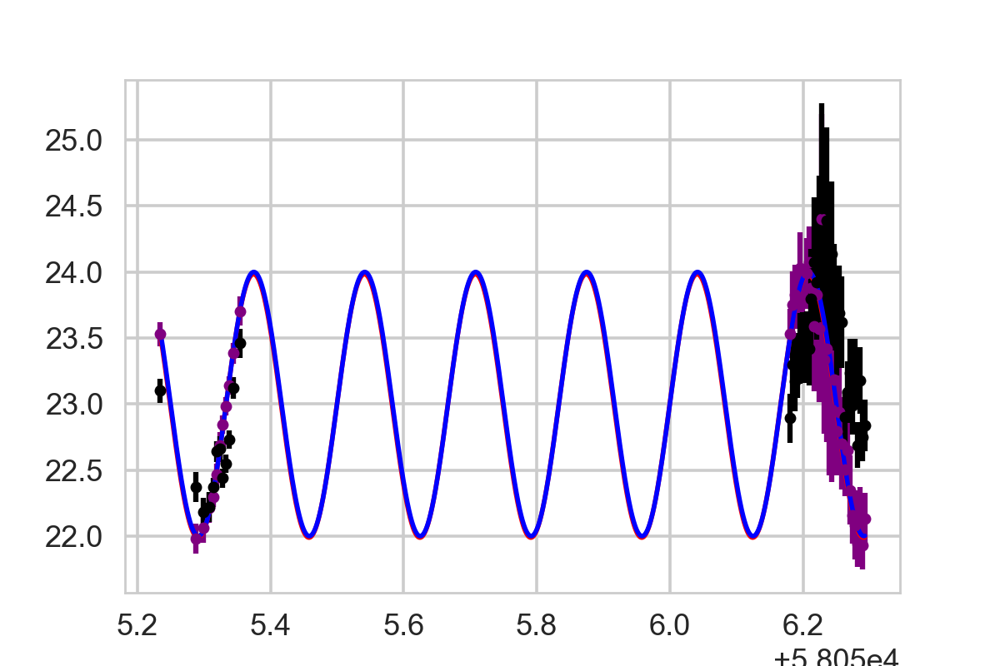

In [76]:
model_time = np.linspace(time[0], time[-1], 2000)
m = sinusoid(model_time, *res.x)
input_m = sinusoid(model_time, logamp, period, bkg)

fig, ax = plt.subplots(1, 1, figsize=(6,4))
ax.errorbar(time, fake_mag, yerr=mag_err, fmt="o", markersize=5, color="purple", label="data")
ax.errorbar(time, mag, yerr=mag_err, fmt="o", markersize=5, color="black", label="data")

ax.plot(model_time, m, color="red", lw=2, label="best-fit model")
ax.plot(model_time, input_m, color="blue", lw=2, label="original model")

Okay, let's see how MCMC works on my simulated data:

In [77]:
# Set up the sampler.
nwalkers, ndim = 200, len(res.x)
sampler = emcee.EnsembleSampler(nwalkers, ndim, fake_lpost, threads=4)

# Initialize the walkers.
p0 = res.x + 0.001 * np.random.randn(nwalkers, ndim)

for p in p0:
    print(fake_lpost(p))

-41.5984831601
-1327.50435647
-185.214874741
-1128.56408534
-623.756624134
-99.5355604384
-1182.71466215
-1354.4461758
-1383.96939305
14.4935306181
-612.214703534
-318.198259951
8.16565793779
-969.604802422
-236.450456653
-309.504234669
11.9569708363
-1106.75935873
-1075.00531886
-1056.8714247
-1302.74176798
-1020.23945182
-271.02901434
-428.11357337
-895.105323069
-1264.26758555
-903.39096974
-30.4774806883
-557.959720117
-1471.90726942
-30.3556517041
-1341.47958364
-1221.66045485
-792.821548487
-797.230376981
-1387.72530013
-793.524043405
-1068.04875396
-1405.14005112
3.19274087613
-812.11385323
-1327.28082487
-834.814922463
7.8773532511
-1356.62039063
-1.53950815037
-25.6087099737
-1420.27081343
-1120.34451205
-1111.03509001
-0.53516154959
-130.988031352
-180.218630243
-1297.3758924
-1047.48142249
-1.2591659479
-10.6453938585
-63.3681924983
-179.898858937
-1083.21254659
-890.221609185
-977.481944406
-788.77221146
-651.906187775
-1408.10386297
-1057.41701687
-1416.88483231
-1129.4080

In [78]:
print("Running burn-in")
p0, _, _ = sampler.run_mcmc(p0, 5000)

Running burn-in


<IPython.core.display.Javascript object>


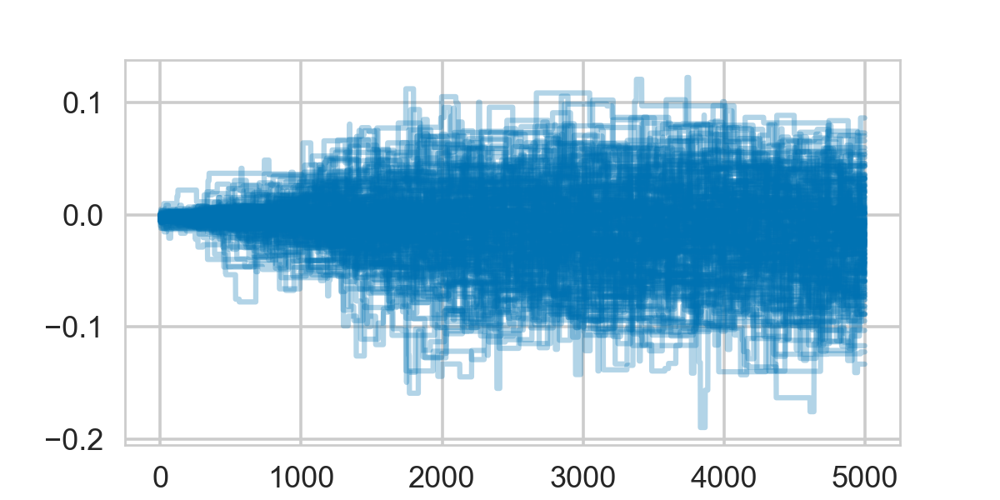

<IPython.core.display.Javascript object>


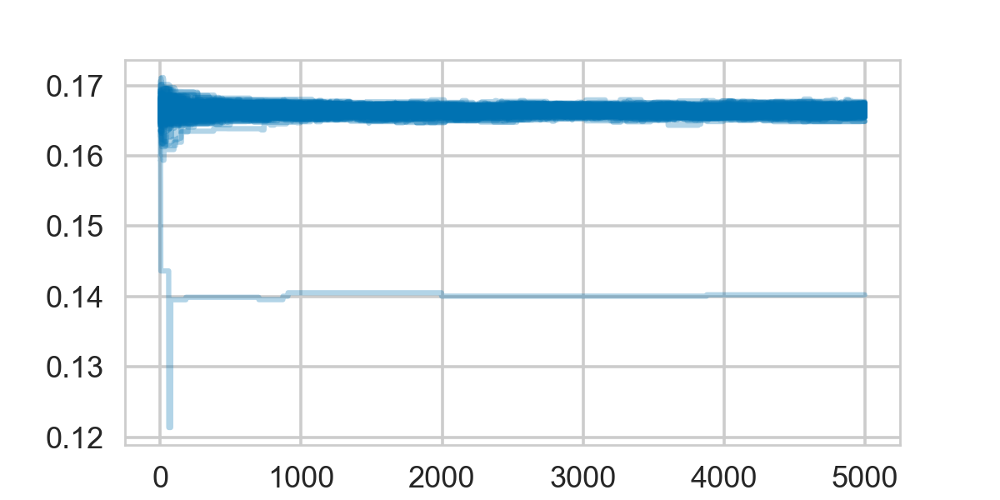

<IPython.core.display.Javascript object>


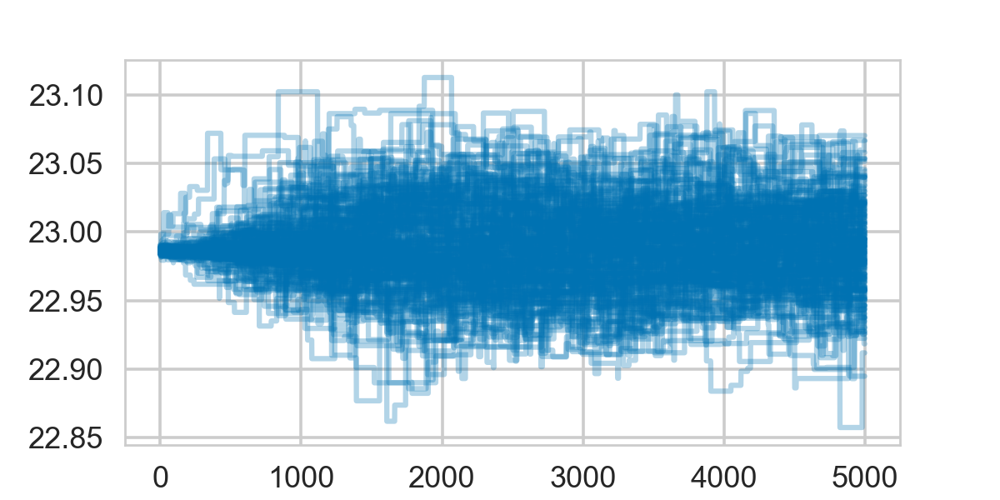

In [79]:
for i in range(ndim):
    fig, ax = plt.subplots(1, 1, figsize=(6,3))
    ax.plot(sampler.chain[:,:,i].T, color=sns.color_palette()[0], alpha=0.3)

Corner plot time!

In [80]:
names = ["log-amplitude", "period in days", "bkg"]

In [81]:
flatchain = np.concatenate(sampler.chain[:,-1000:, :], axis=0)

<IPython.core.display.Javascript object>


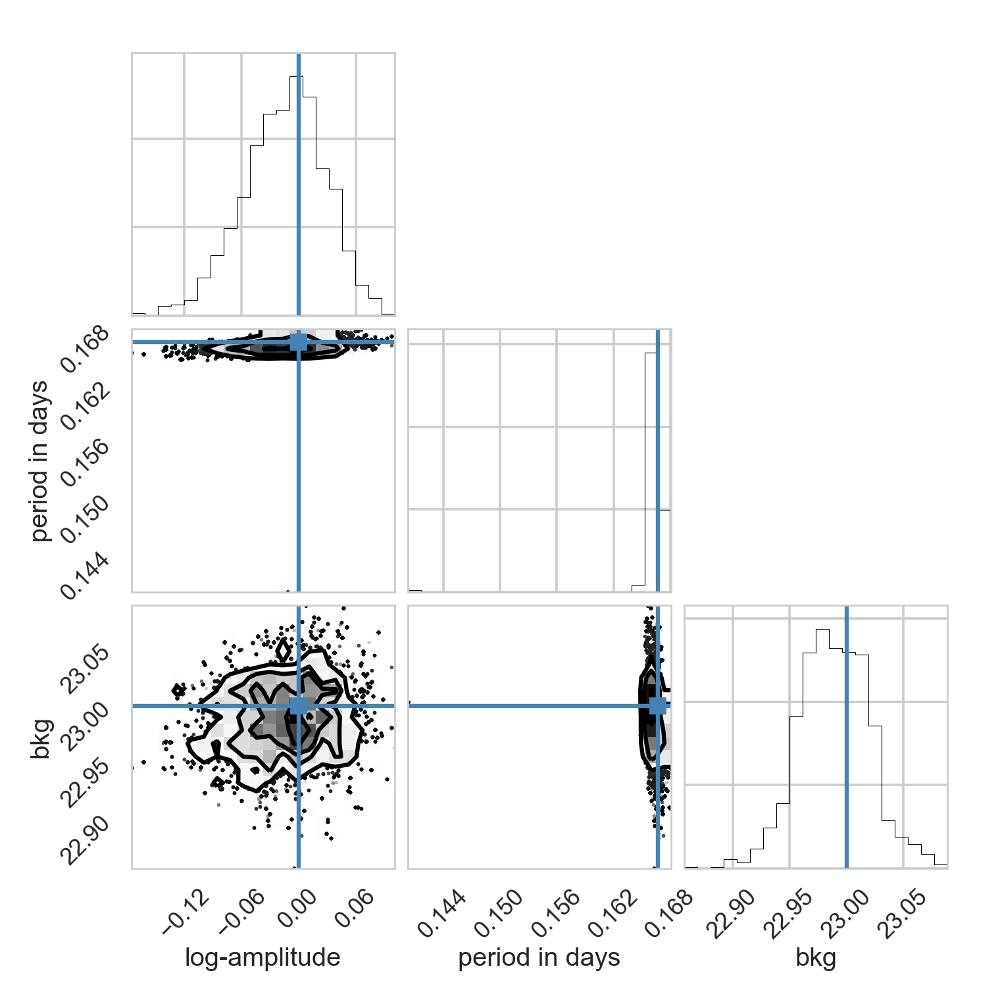

<IPython.core.display.Javascript object>


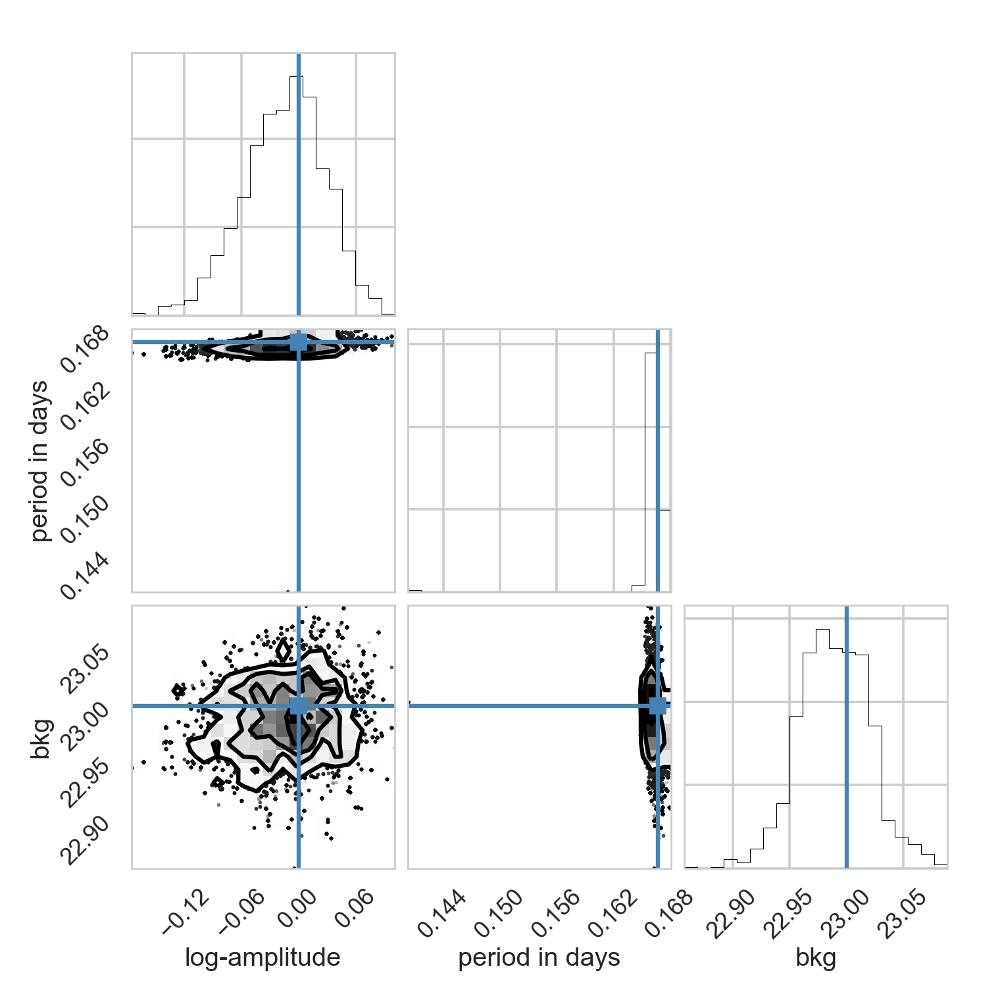

In [82]:
corner.corner(flatchain, labels=names, truths=true_pars)

Let's make a plot of some posterior samples:

<IPython.core.display.Javascript object>


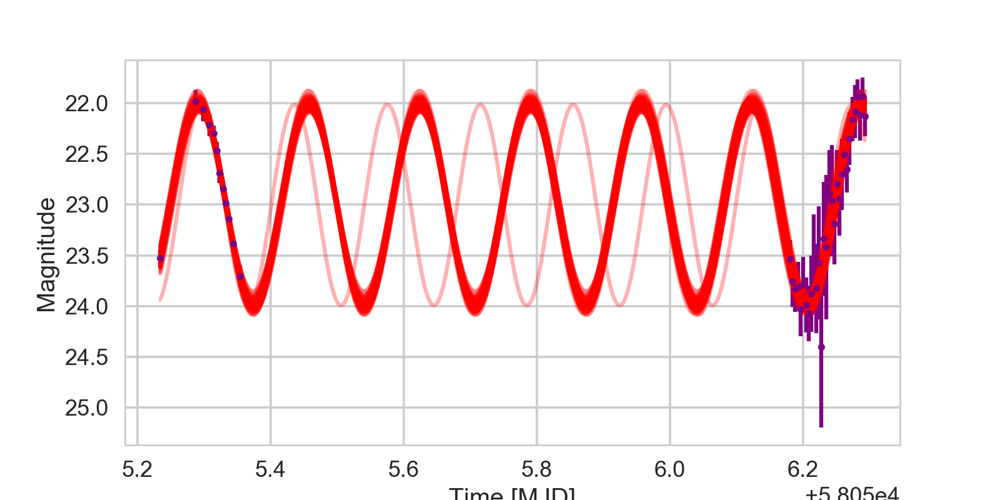

In [85]:
plt.figure(figsize=(8,4))

plt.errorbar(time, fake_mag, yerr=mag_err,
             color="purple", fmt="o", markersize=4)


for i in range(100):
    # Choose a random walker and step.
    w = np.random.randint(sampler.chain.shape[0])
    n = np.random.randint(sampler.chain.shape[1]-100)+100
    p = sampler.chain[w, n]
    m = sinusoid(model_time, *p)
    # Plot a single sample.
    plt.plot(model_time, m, alpha=0.3, color="red")

#plt.xlim(58055.2, 58057)
plt.xlabel("Time [MJD]")
plt.ylabel("Magnitude");
plt.gca().invert_yaxis()

Ok, that looks like it's doing the right thing. Let's do this on the real data:

In [87]:
start_pars = [0.0, 4/24., 23.3]

res = op.minimize(lpost, start_pars, args=(True), method="powell")

/opt/local/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/scipy/optimize/optimize.py:1927: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


In [88]:
res.x

array([ -0.50479982,   0.16667867,  22.99172175])

What does the model look like compared to the data?

In [89]:
model_time = np.linspace(time[0], time[-1], 2000)

In [90]:
m = sinusoid(model_time, *res.x)

<IPython.core.display.Javascript object>


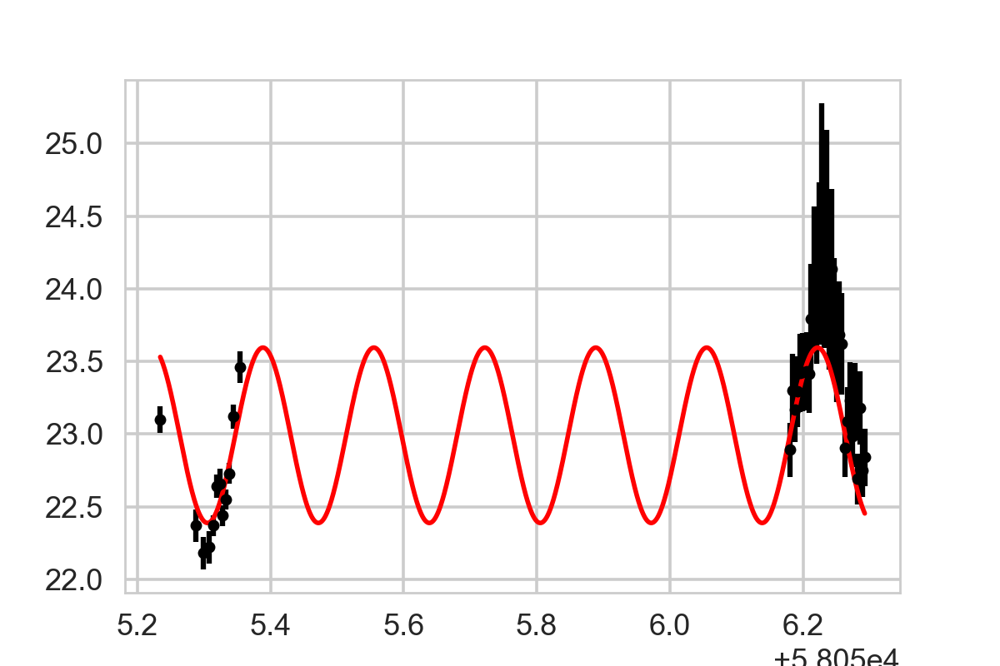

In [91]:
fig, ax = plt.subplots(1, 1, figsize=(6,4))
ax.errorbar(time, mag, yerr=mag_err, fmt="o", markersize=5, color="black", label="data")
ax.plot(model_time, m, color="red", lw=2, label="best-fit model")

The pure sinusoidal fit looks ok, but not great. Let's take a look at some MCMC inference, which should hopefully be quick:

In [93]:
# Set up the sampler.
nwalkers, ndim = 200, 3
sampler = emcee.EnsembleSampler(nwalkers, ndim, lpost, threads=4)

# Initialize the walkers.
p0 = res.x + 0.001 * np.random.randn(nwalkers, ndim)

for p in p0:
    print(lpost(p))

-525.564710488
-747.656340216
-163.099057282
-783.644228125
-290.050321678
-626.94808644
-93.8382131155
-673.017520885
-289.990561969
-752.430977938
-55.4418771465
-316.631518028
-46.1381436088
-404.955791165
-544.780469468
-567.453154183
-50.0570196765
-547.714383622
-105.604329155
-510.3700556
-241.375266485
-781.256980208
-247.109398513
-265.022108441
-128.467702188
-202.202695473
-717.056846342
-645.223602387
-753.713888919
-421.443828017
-85.931406804
-178.804554091
-437.299302967
-619.136865472
-127.010232967
-216.48296113
-786.059004771
-665.691392752
-299.951621448
-767.945486395
-212.335711851
-439.157622336
-327.020391968
-597.862647694
-401.117689898
-277.941681855
-127.712563473
-701.306975034
-580.173204763
-724.436098582
-788.032393172
-450.292483008
-49.7770037467
-428.12725632
-101.58087183
-732.684032939
-129.463276513
-121.219529858
-272.680771855
-164.025970226
-356.791119677
-350.535031923
-89.8856312044
-254.726592863
-23.4829376643
-318.022343798
-317.940221146
-2

In [94]:
print("Running burn-in")
p0, _, _ = sampler.run_mcmc(p0, 10000)

Running burn-in


<IPython.core.display.Javascript object>


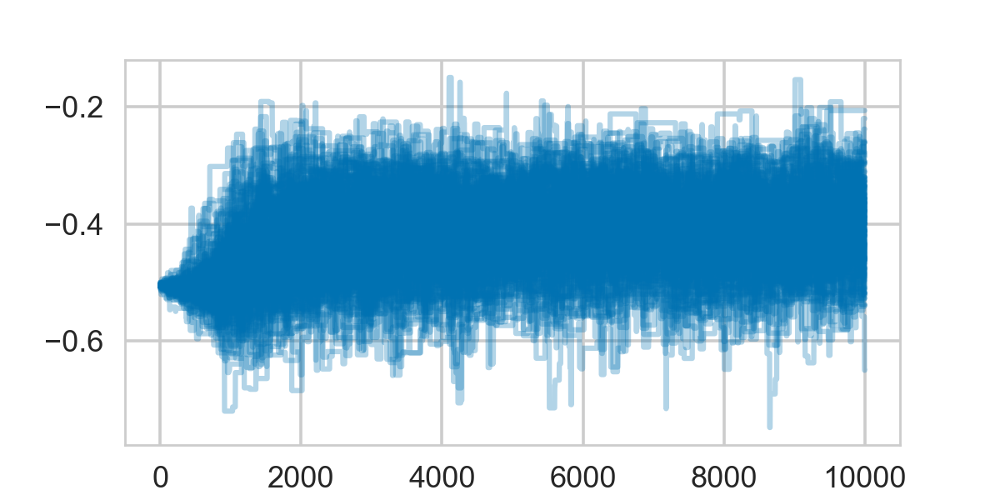

<IPython.core.display.Javascript object>


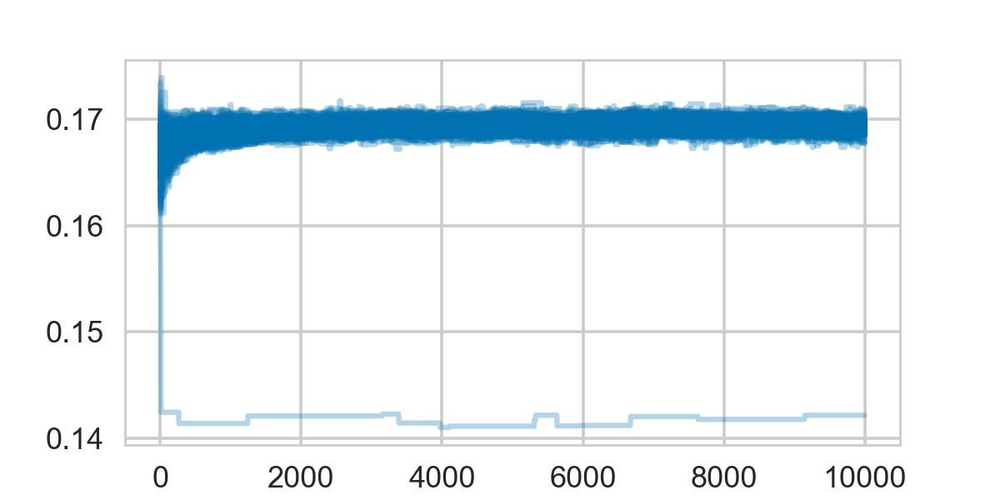

<IPython.core.display.Javascript object>


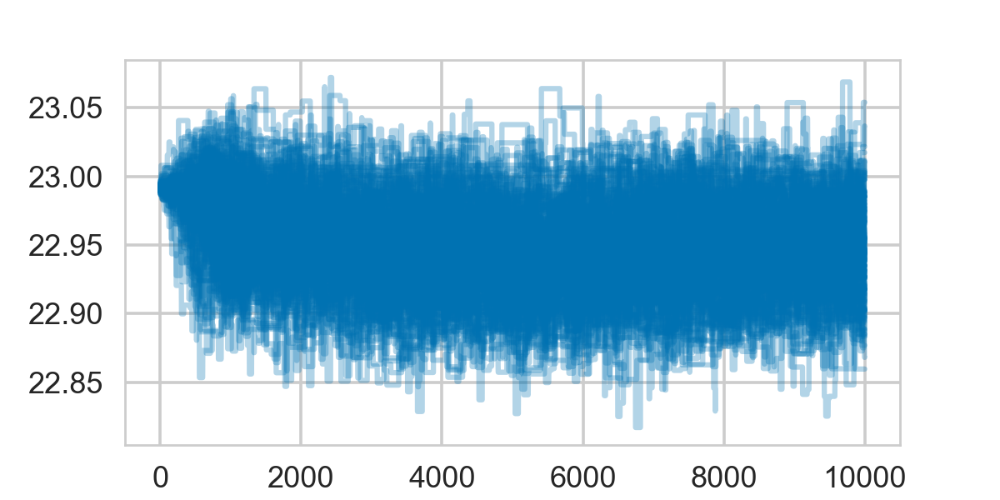

In [95]:
for i in range(ndim):
    fig, ax = plt.subplots(1, 1, figsize=(6,3))
    ax.plot(sampler.chain[:,:,i].T, color=sns.color_palette()[0], alpha=0.3)

Hmm, that looks ok, except for the phase, but I'm not super worried about the phase at the moment. Let's make a corner plot:

In [96]:
flatchain = np.concatenate(sampler.chain[:,-1000:, :], axis=0)

In [97]:
names = ["amplitude", "period in days", "phase", "bkg"]

In [98]:
flatchain[:,0] = np.exp(flatchain[:,0])

/opt/local/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


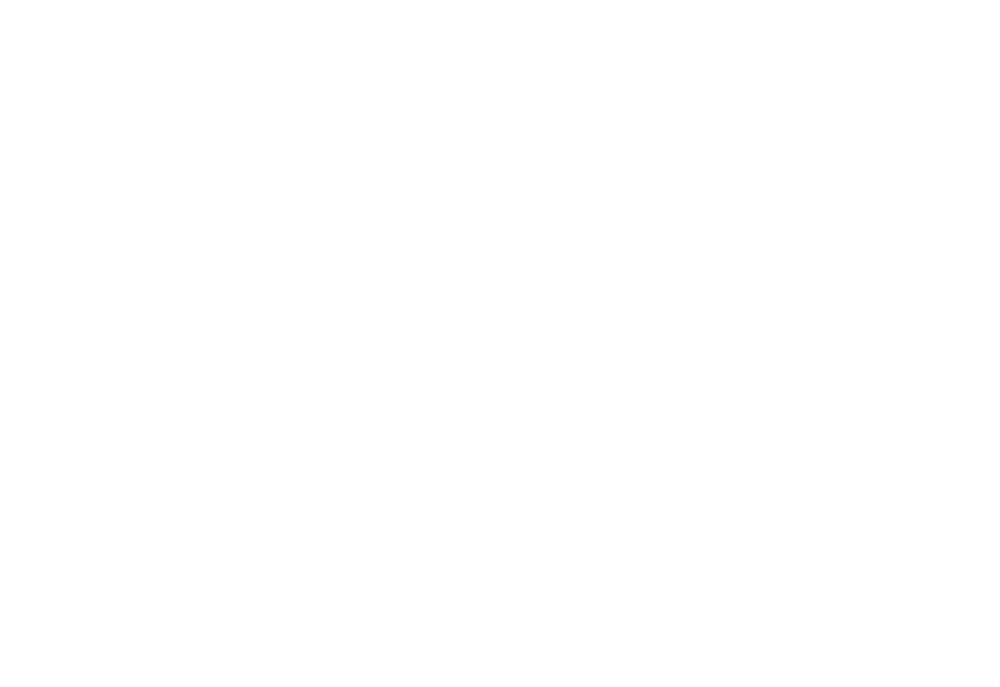

ValueError: Provided figure has 0 axes, but data has dimensions K=4

In [191]:
fig = plt.figure()
corner.corner(flatchain, labels=names, fig=fig);

Let's look at the posterior means and percentiles:

First, the amplitude:

In [100]:
np.mean(flatchain[:,0], axis=0)

0.67050282986901188

In [101]:
np.percentile(flatchain[:,0], [50-68.27/2.0, 50, 50+68.27/2.], axis=0)

array([ 0.6256484 ,  0.66933681,  0.71201502])

In [102]:
0.63828670337044935 - 0.59034186

0.04794484337044935

In [103]:
0.68694518 - 0.63828670337044935

0.048658476629550695

Then the period:

In [104]:
flatchain[:, 1] = np.log(flatchain[:,1])

In [193]:
np.mean(flatchain[:,1], axis=0)*24.

-14.497548980424924

In [192]:
np.percentile(flatchain[:,1], [50-(68.27/2.0), 50, 50+(68.27/2.)], axis=0)*24.

array([-25.91447538, -16.29212121,  -6.09488144])

In [107]:
4.0659269767275319 - 4.05313703

0.012789946727531643

In [108]:
4.07848433 - 4.0659269767275319

0.012557353272468319

And finally for the background parameter

In [109]:
np.mean(flatchain[:,-1], axis=0)

22.948383497300771

In [110]:
np.percentile(flatchain[:,-1], [50-68.27/2.0, 50, 50+68.27/2.], axis=0)

array([ 22.91626536,  22.95007845,  22.9802642 ])

In [111]:
50+68.27/2.0

84.13499999999999

Okay, so those are my numbers for the percentiles, and they're all pretty well-constrained. Let's plot some example light curves and the phase-folded light curve:

In [112]:
phase = time/0.16946752939309517 % 1
phase *= (2.*np.pi)

In [113]:
max_ind = time.searchsorted(58055.5)

In [114]:
sns.set_style("white")

In [115]:
labels = ["0", r"$\frac{1}{2}\pi$", r"$\pi$", r"$\frac{3}{2}\pi$", r"$2\pi$"]
ticks = [0, 0.5*np.pi, np.pi, 1.5*np.pi, 2*np.pi]

In [116]:
0.16946752939309517*24

4.067220705434284

<IPython.core.display.Javascript object>


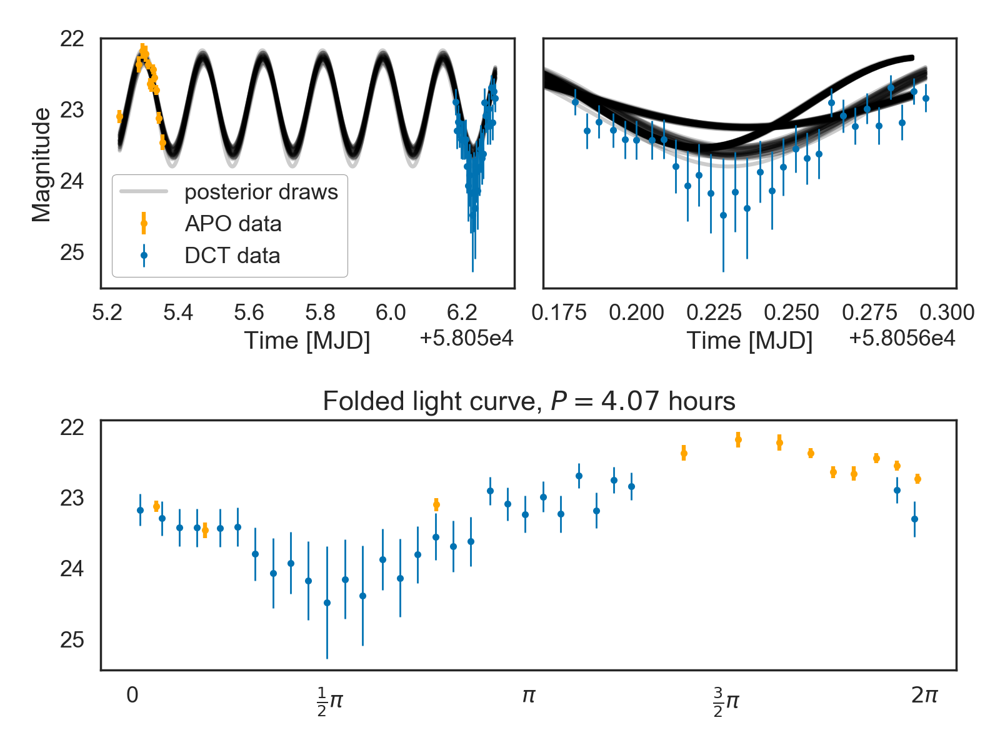

In [118]:
#fig, (ax1, ax2) = plt.subplots(,2, figsize=(8,4))

fig = plt.figure(figsize=(8,6))
ax1 = plt.subplot2grid((2, 2), (0, 0))
ax2 = plt.subplot2grid((2, 2), (0, 1))
ax3 = plt.subplot2grid((2, 2), (1, 0), colspan=2)


ax1.errorbar(time[:max_ind], mag[:max_ind], yerr=mag_err[:max_ind],
             color="orange", fmt="o", markersize=4, label="APO data")

ax1.errorbar(time[max_ind:], mag[max_ind:], yerr=mag_err[max_ind:],
             color=sns.color_palette("colorblind")[0], fmt="o", markersize=4, 
             lw=1, label="DCT data")


ax2.errorbar(time, mag, yerr=mag_err,
             color=sns.color_palette("colorblind")[0], fmt="o", lw=1, markersize=4, 
             label="DCT data")

flatchain = np.concatenate(sampler.chain[:,-1000:, :], axis=0)
for i in range(30):
    # Choose a random walker and step.
    w = np.random.randint(flatchain.shape[0])
    p = flatchain[w]
    #ph = (p[2]/(2.0*np.pi) - int(p[2]/(2.0*np.pi))) * 2 * np.pi
    m = sinusoid(model_time, p[0], p[1], p[2])
#    # Plot a single sample.
    if i == 0:
        ax1.plot(model_time, m, alpha=0.2, color="black", 
                 label="posterior draws", zorder=0)
        ax2.plot(model_time, m, alpha=0.2, color="black", 
                 label="posterior draws", zorder=0)
    else:
        ax1.plot(model_time, m, alpha=0.2, color="black", zorder=0)
        ax2.plot(model_time, m, alpha=0.2, color="black", zorder=0)


#ax1.set_xlim(58055.2, 58056.32)
ax1.set_xlabel("Time [MJD]")
ax1.set_ylabel("Magnitude");
leg = ax1.legend(frameon=True)
leg.get_frame().set_edgecolor('grey')

ax1.set_ylim(22, 25.5)
ax1.set_ylim(ax1.get_ylim()[::-1])

ax2.set_xlim(58056.17, max(time)+0.01)
ax2.set_xlabel("Time [MJD]")
ax2.set_yticklabels([])
ax2.set_ylim(22, 25.5)
ax2.set_ylim(ax2.get_ylim()[::-1])

ax3.errorbar(phase[:max_ind], mag[:max_ind], yerr=mag_err[:max_ind],
             color="orange", fmt="o", markersize=4, label="APO data")

ax3.errorbar(phase[max_ind:], mag[max_ind:], yerr=mag_err[max_ind:],
             color=sns.color_palette("colorblind")[0], fmt="o", markersize=4, 
             lw=1, label="DCT data")


ax3.set_xticks(ticks)
ax3.set_xticklabels(labels)
ax3.set_title(r"Folded light curve, $P = 4.07$ hours")
ax3.set_ylim(ax3.get_ylim()[::-1])
plt.tight_layout()

plt.savefig("comet_sine_lcs.eps", format="eps")

I made some shiny code to make this easier. Let's see if it works!

In [208]:
from period_search import model_sine_curve

/opt/local/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/scipy/optimize/optimize.py:1927: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)
/opt/local/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


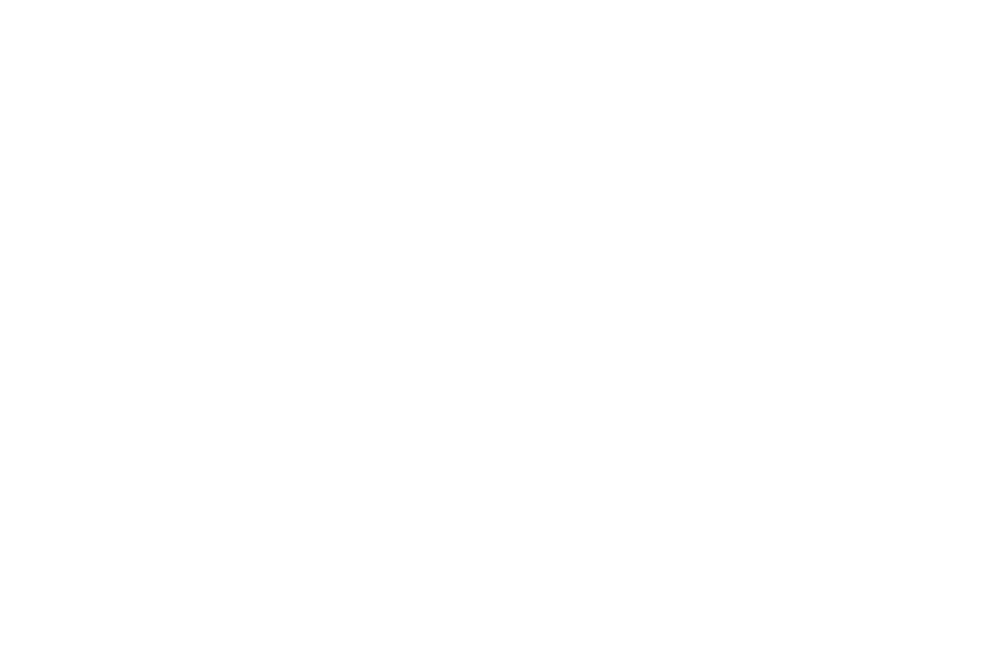

Running burn-in


<IPython.core.display.Javascript object>


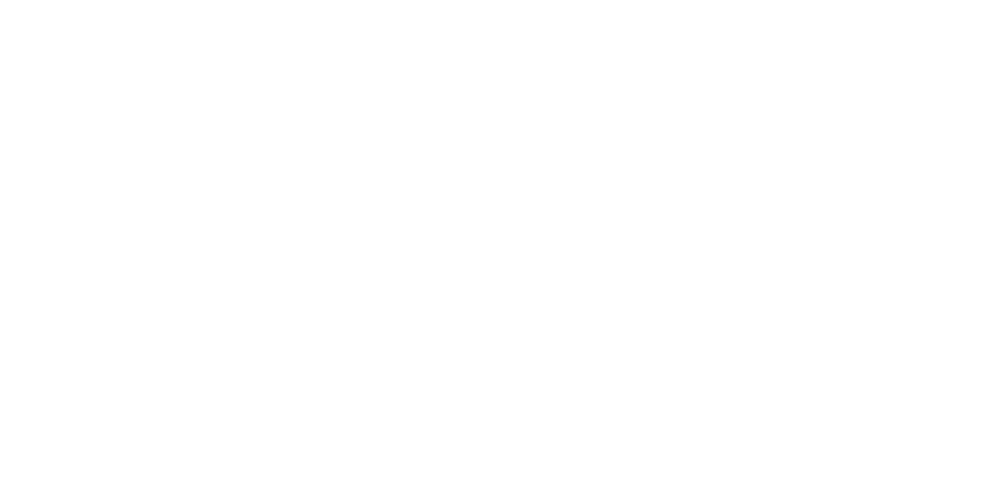

<IPython.core.display.Javascript object>


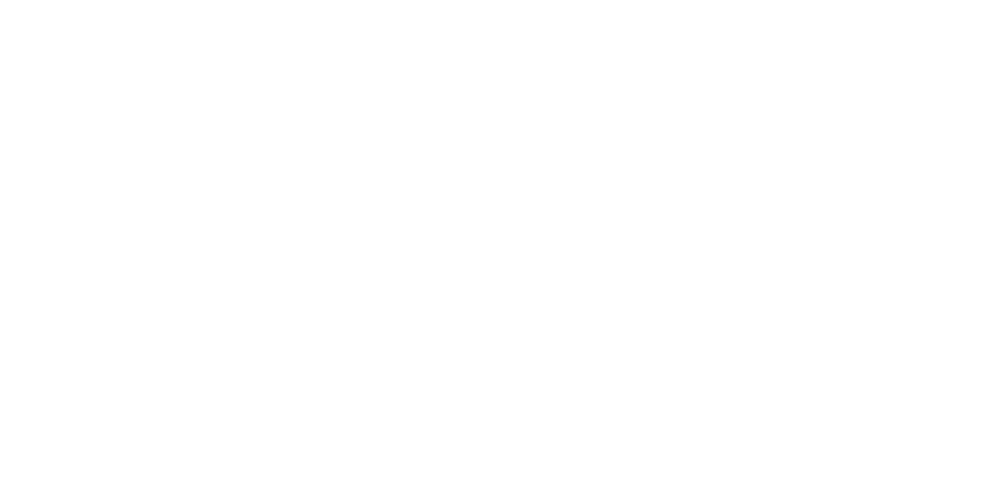

<IPython.core.display.Javascript object>


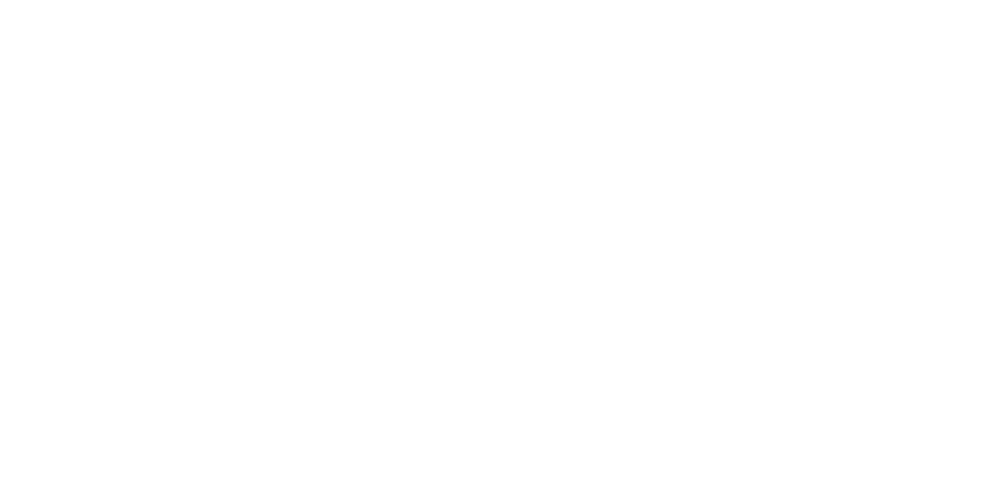

<IPython.core.display.Javascript object>


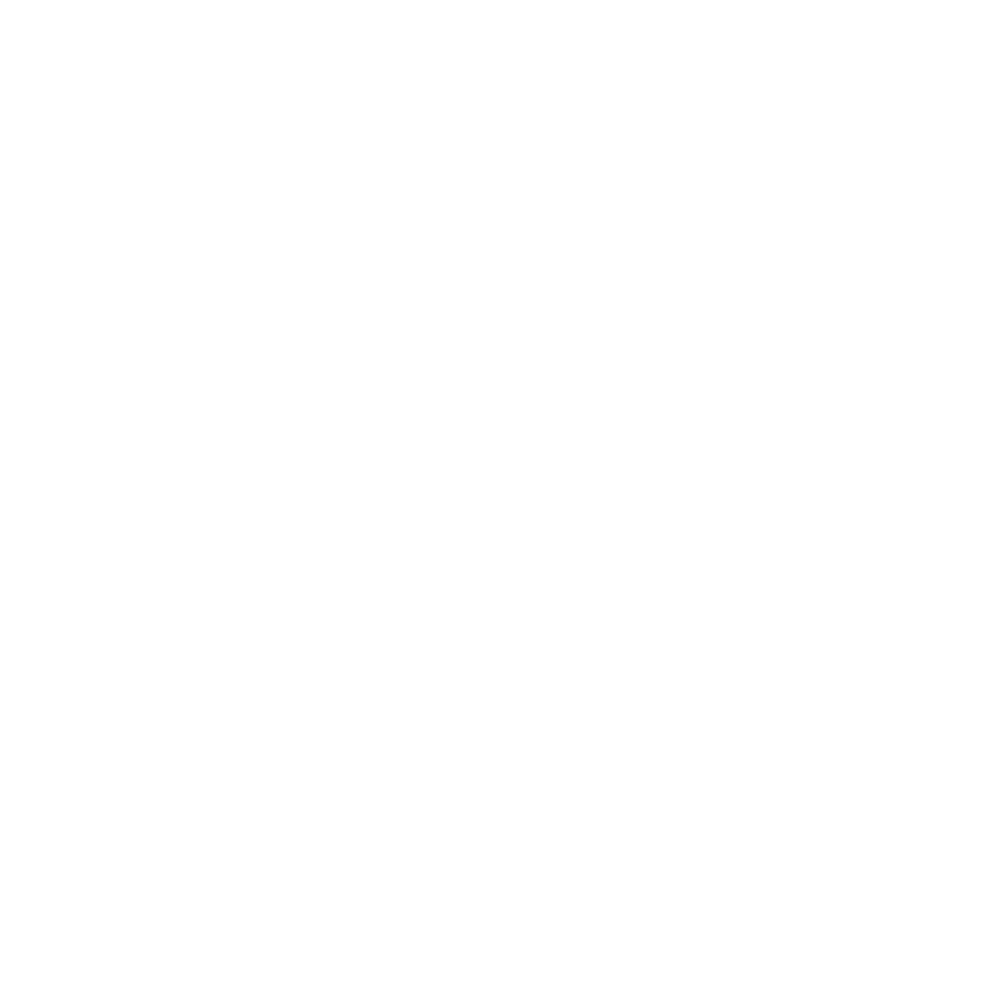

The posterior mean and uncertainty for the log-amplitude is $\log(A) = $ -0.404 (+0.074/-0.076)
The posterior mean and uncertainty for the period is $P = $ 0.169 (+0.001/-0.001)
The posterior mean and uncertainty for the mean magnitude is $\lambda =$ 22.943 (+0.031/-0.032)


<IPython.core.display.Javascript object>


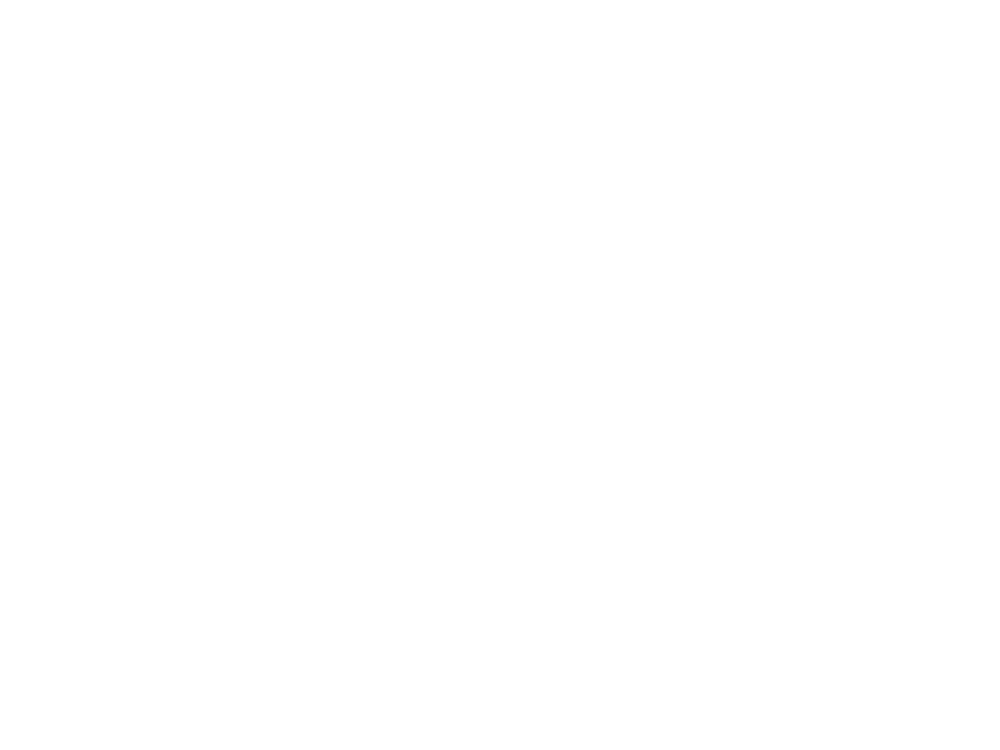

In [209]:
lpost, res, sampler = model_sine_curve(data, start_pars, nwalkers=200, niter=5000, nsim=500, 
                                       namestr="test", fitmethod="powell")

In [ ]:
sns.color_palette()

Okay, so that's my inference for the sinusoidal model. It's not clear that a sinusoidal model is a good idea, because the model could be double-peaked or have other deformations.

### Gaussian Process Model

We should fit a Gaussian Process model instead, so let's try doing that.

In particular, the sine-squared exponential is probably the right model, because it defines a periodic but non-sinusoidal model.

In [ ]:
plt.figure(figsize=(6,4))
plt.scatter(time, mag, color="black")
plt.scatter(time, fake_mag, color="purple")

Let's first test this on the simulated data!

In [ ]:
kernel = 10 * kernels.ExpSine2Kernel(gamma=1, log_period=np.log(8/24.0),)

In [ ]:
gp = george.GP(kernel, mean=np.mean(fake_mag), fit_mean=True,
               white_noise=np.mean(np.log(mag_err)), fit_white_noise=False)
gp.compute(time)

x = np.linspace(np.min(time), np.max(time), 5000)
mu, var = gp.predict(fake_mag, x, return_var=True)
std = np.sqrt(var)

plt.figure(figsize=(8,4))
plt.errorbar(time, fake_mag, yerr=mag_err,
             color="black", fmt="o", markersize=4)
plt.fill_between(x, mu+std, mu-std, color="g", alpha=0.5)

#plt.xlim(58054, np.max(time)+0.3)
plt.xlabel("Time [MJD]")
plt.ylabel("Magnitude");

In [ ]:
# Define the objective function (negative log-likelihood in this case).
def nll(p):
    gp.set_parameter_vector(p)
    ll = gp.log_likelihood(fake_mag, quiet=True)
    return -ll if np.isfinite(ll) else 1e25

# And the gradient of the objective function.
def grad_nll(p):
    gp.set_parameter_vector(p)
    return -gp.grad_log_likelihood(fake_mag, quiet=True)

# You need to compute the GP once before starting the optimization.
gp.compute(time)

# Print the initial ln-likelihood.
print(gp.log_likelihood(fake_mag))

# Run the optimization routine.
p0 = gp.get_parameter_vector()
results = op.minimize(nll, p0, jac=grad_nll, method="L-BFGS-B")

# Update the kernel and print the final log-likelihood.
gp.set_parameter_vector(results.x)
print(results.x)
print(gp.log_likelihood(fake_mag))

x = np.linspace(np.min(time), np.max(time), 5000)
mu, var = gp.predict(fake_mag, x, return_var=True)
std = np.sqrt(var)

plt.figure(figsize=(8,4))
plt.errorbar(time, fake_mag, yerr=data["mag_err"],
             color="black", fmt="o", markersize=4)
plt.fill_between(x, mu+std, mu-std, color="g", alpha=0.5)

plt.xlabel("Time [MJD]")
plt.ylabel("Magnitude");

In [ ]:
def lnprob(p): 
    mean = p[0]
    logamplitude = p[1]
    loggamma = p[2]
    logperiod = p[3]
    
    if mean < -100 or mean > 100:
    #    print("boo! 0")
        return -np.inf
    
    # prior on log-amplitude: flat and uninformative
    if logamplitude < -100 or logamplitude > 100:
        #print("boo! 1")
        return -np.inf
    
    # prior on log-gamma of the periodic signal: constant and uninformative
    elif loggamma < -20 or loggamma > 20:
        #print("boo! 2")
        return -np.inf
        
    # prior on the period: somewhere between 30 minutes and 2 days
    elif logperiod < np.log(1/24) or logperiod > np.log(23/24.0):
        #print("boo! 4")
        return -np.inf
    
    else:
        pnew = np.array([mean, logamplitude, np.exp(loggamma), logperiod])
        #print("yay!")
        # Update the kernel and compute the lnlikelihood.
        gp.set_parameter_vector(pnew)
        return gp.lnlikelihood(fake_mag, quiet=True)


In [ ]:
gp.compute(time)

# Set up the sampler.
nwalkers, ndim = 100, len(results.x)
sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, threads=4)

# Initialize the walkers.

p0 = results.x + 0.01 * np.random.randn(nwalkers, ndim)

for p in p0:
    print(lnprob(p))

In [ ]:
print("Running burn-in")
p0, _, _ = sampler.run_mcmc(p0, 10000)

In [ ]:
sampler.acceptance_fraction

In [ ]:
for i in range(ndim):
    fig, ax = plt.subplots(1, 1, figsize=(6,3))
    ax.plot(sampler.chain[:,:,i].T, color=sns.color_palette()[0], alpha=0.3)

In [ ]:
flatchain = np.concatenate(sampler.chain[:,-1000:,:], axis=0)

In [ ]:
labels = ["log(Amplitude)", r"$\Gamma$", "log(Period)"]
corner.corner(flatchain[:,1:], labels=labels);

In [ ]:
plt.figure(figsize=(6,4))
plt.hist(flatchain[:,-1], bins=200);

Now we can repeat the procedure on real data:

In [ ]:
kernel = 10 * kernels.ExpSine2Kernel(gamma=10, log_period=np.log(8/24.0),)

In [ ]:
gp = george.GP(kernel, mean=np.mean(mag), fit_mean=True,
               white_noise=np.mean(np.log(mag_err)), fit_white_noise=False)
gp.compute(time)

x = np.linspace(np.min(time), np.max(time), 5000)
mu, var = gp.predict(mag, x, return_var=True)
std = np.sqrt(var)

plt.figure(figsize=(8,4))
plt.errorbar(time, mag, yerr=mag_err,
             color="black", fmt="o", markersize=4)
plt.fill_between(x, mu+std, mu-std, color="g", alpha=0.5)

#plt.xlim(58054, np.max(time)+0.3)
plt.xlabel("Time [MJD]")
plt.ylabel("Magnitude");

In [ ]:
# Define the objective function (negative log-likelihood in this case).
def nll(p):
    gp.set_parameter_vector(p)
    ll = gp.log_likelihood(mag, quiet=True)
    return -ll if np.isfinite(ll) else 1e25

# And the gradient of the objective function.
def grad_nll(p):
    gp.set_parameter_vector(p)
    return -gp.grad_log_likelihood(mag, quiet=True)

# You need to compute the GP once before starting the optimization.
gp.compute(time)

# Print the initial ln-likelihood.
print(gp.log_likelihood(mag))

# Run the optimization routine.
p0 = gp.get_parameter_vector()
results = op.minimize(nll, p0, jac=grad_nll, method="L-BFGS-B")

# Update the kernel and print the final log-likelihood.
gp.set_parameter_vector(results.x)
print(results.x)
print(gp.log_likelihood(mag))

x = np.linspace(np.min(time), np.max(time), 5000)
mu, var = gp.predict(mag, x, return_var=True)
std = np.sqrt(var)

plt.figure(figsize=(8,4))
plt.errorbar(time, mag, yerr=data["mag_err"],
             color="black", fmt="o", markersize=4)
plt.fill_between(x, mu+std, mu-std, color="g", alpha=0.5)

plt.xlabel("Time [MJD]")
plt.ylabel("Magnitude");

In [ ]:
kernel = 10 * kernels.ExpSine2Kernel(gamma=10, log_period=np.log(8/24.0),)

gp = george.GP(kernel, mean=np.mean(mag), fit_mean=True,
               white_noise=np.mean(np.log(mag_err)), fit_white_noise=False)
gp.compute(time)

x = np.linspace(np.min(time), np.max(time), 5000)
mu, var = gp.predict(mag, x, return_var=True)
std = np.sqrt(var)

plt.figure(figsize=(8,4))
plt.errorbar(time, mag, yerr=mag_err,
             color="black", fmt="o", markersize=4)
plt.fill_between(x, mu+std, mu-std, color="g", alpha=0.5)

#plt.xlim(58054, np.max(time)+0.3)
plt.xlabel("Time [MJD]")
plt.ylabel("Magnitude");




# Define the objective function (negative log-likelihood in this case).
def nll(p):
    gp.set_parameter_vector(p)
    ll = gp.log_likelihood(mag, quiet=True)

def lnprob(p):
    
    mean = p[0]
    logamplitude = p[1]
    loggamma = p[2]
    logperiod = p[3]
    
    if mean < -100 or mean > 100:
        #print("boo! 0")
        return -np.inf
    
    # prior on log-amplitude: flat and uninformative
    elif logamplitude < -100 or logamplitude > 100:
        #print("boo! 1")
        return -np.inf
    
    # prior on log-gamma of the periodic signal: constant and uninformative
    elif loggamma < -20 or loggamma > 20:
        #print("boo! 2")
        return -np.inf
        
    # prior on the period: somewhere between 30 minutes and 2 days
    elif logperiod < np.log(1/24) or logperiod > np.log(23/24.0):
        #print("boo! 4")
        return -np.inf
    
    else:
        pnew = np.array([mean, logamplitude, np.exp(loggamma), logperiod])
        #print("yay!")
        # Update the kernel and compute the lnlikelihood.
        gp.set_parameter_vector(pnew)
        return gp.lnlikelihood(mag, quiet=True)


In [ ]:
pnew = np.zeros(4)
pnew[0] = 23
pnew[1] = 2
pnew[2] = np.log(10)
pnew[3] = np.log(4/24)

lnprob(pnew)

In [ ]:
gp.compute(time)

# Set up the sampler.
nwalkers, ndim = 100, len(gp)
sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, threads=4)

# Initialize the walkers.
p0 = pnew + 0.01 * np.random.randn(nwalkers, ndim)

for p in p0:
    print(lnprob(p))

In [ ]:
print("Running burn-in")
p0, _, _ = sampler.run_mcmc(p0, 5000)

In [ ]:
gp.parameter_names

In [ ]:
for i in range(ndim):
    fig, ax = plt.subplots(1, 1, figsize=(6,3))
    ax.plot(sampler.chain[:,:,i].T, color=sns.color_palette()[0], alpha=0.3)

In [ ]:
flatchain = np.concatenate(sampler.chain[:,-500:,:], axis=0)

In [ ]:
corner.corner(flatchain, labels=["mean magnitude", "log(amplitude)", "log(gamma)", "Sinusoid Period"], bins=100);

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(6,4))
ax.hist(f, bins=200, histtype="stepfilled");

In [ ]:
f = flatchain[:,-1]

In [ ]:
f = flatchain[:,-1]

w = np.where(sampler.lnprobability == np.max(sampler.lnprobability))

In [ ]:
f = flatchain[:,-1]

w = np.where(sampler.lnprobability == np.max(sampler.lnprobability))

max_ind = [w[0][0], w[1][0]]

In [ ]:
f = flatchain[:,-1]

w = np.where(sampler.lnprobability == np.max(sampler.lnprobability))

max_ind = [w[0][0], w[1][0]]

max_pars = sampler.chain[max_ind[0], max_ind[1], :]
# Update the kernel and print the final log-likelihood.
max_pars = [max_pars[0], max_pars[1], np.exp(max_pars[2]), max_pars[3]]

gp.set_parameter_vector(max_pars)
print(gp.log_likelihood(mag))

x = np.linspace(np.min(time), np.max(time), 5000)
mu, var = gp.predict(mag, x, return_var=True)
std = np.sqrt(var)

plt.figure(figsize=(8,4))
plt.errorbar(time, mag, yerr=data["mag_err"],
             color="black", fmt="o", markersize=4)
plt.fill_between(x, mu+2*std, mu-2*std, color="g", alpha=0.5)

plt.xlabel("Time [MJD]")
plt.ylabel("Magnitude");

What is the prediction if the period is twice as long?

In [ ]:
new_period = np.exp(max_pars[-1])*2

In [ ]:
new_pars = [max_pars[0], max_pars[1], np.exp(max_pars[2]), np.log(new_period)]

In [ ]:
flatchain[:,-1] = np.exp(flatchain[:, -1])

In [ ]:
flatchain[:,-1] = flatchain[:,-1]*24.0

In [ ]:
fig = corner.corner(flatchain[:,1:], labels=["$\log(C)$", r"$\log(1/d^2)$", "$P$ [hours]"], bins=60, smooth=1);
axes = fig.get_axes()
plt.savefig("comet_gp_corner.eps", format="eps", frameon=True)

In [ ]:
np.mean(f)

In [ ]:
np.percentile(f, [50-68.27/2.0, 50, 50+68.27/2.], axis=0)

In [ ]:
4.048004667630849 - 4.00921917

In [ ]:
4.08785865 - 4.048004667630849

In [ ]:
mind = time.searchsorted(58055.5)

In [ ]:
gp.set_parameter_vector(new_pars)
print(gp.log_likelihood(mag))

x = np.linspace(np.min(time), np.max(time), 5000)
mu, var = gp.predict(mag, x, return_var=True)
std = np.sqrt(var)

fig, ax = plt.subplots(1, 1, figsize=(8,4))
ax.errorbar(time[:mind], mag[:mind], yerr=mag_err[:mind],lw=1,
             color="orange", fmt="o", markersize=4, label="APO data")

ax.errorbar(time[mind:], mag[mind:], yerr=mag_err[mind:],lw=1, label="DCT data",
             color=sns.color_palette()[0], fmt="o", markersize=4)


ax.fill_between(x, mu+std, mu-std, color="grey", alpha=0.5, label="posterior credible intervals")

leg = ax.legend(frameon=True)
leg.get_frame().set_edgecolor('grey')

ax.set_xlabel("Time [MJD]")
ax.set_ylabel("Magnitude");
ax.set_ylim(ax.get_ylim()[::-1])

plt.tight_layout()
plt.savefig("comet_gp_2periods.pdf", format="pdf")

### Convenience Function:

I also have a convenience function for this part of the analysis:

In [237]:
from period_search import model_gp

In [238]:
pnew

array([ 23.        ,   2.        ,   2.30258509,  -1.79175947])

/opt/local/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


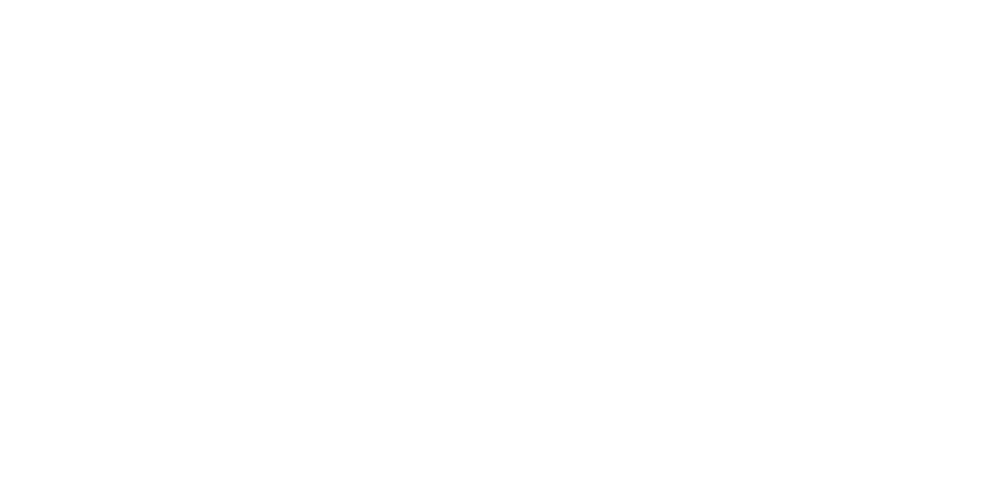

-34.0433126662
[ 23.11408039  -1.18772722  14.32010061  -0.65765585]
-19.5621455561


<IPython.core.display.Javascript object>


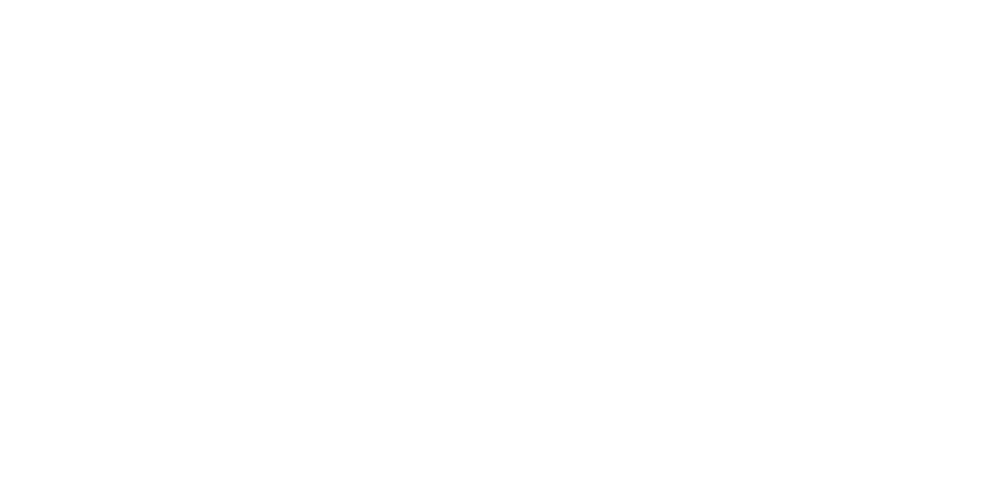

Running burn-in


<IPython.core.display.Javascript object>


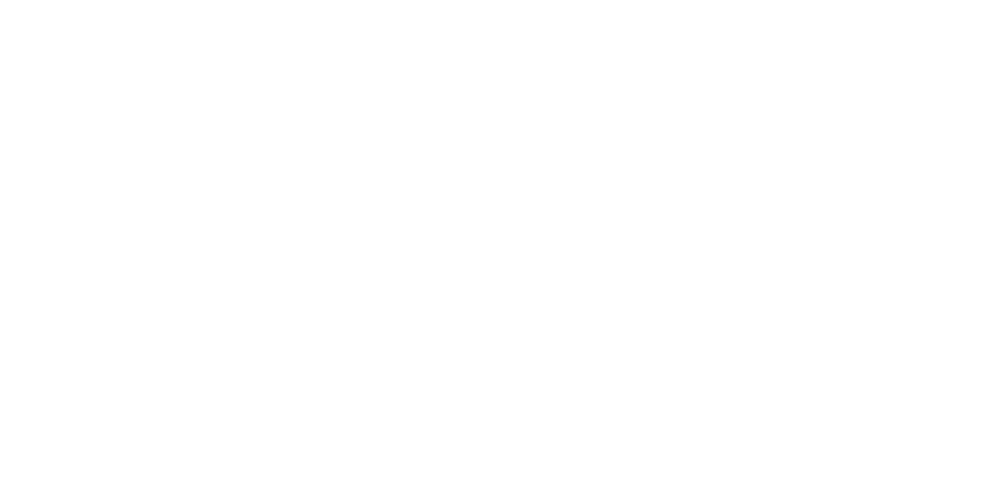

<IPython.core.display.Javascript object>


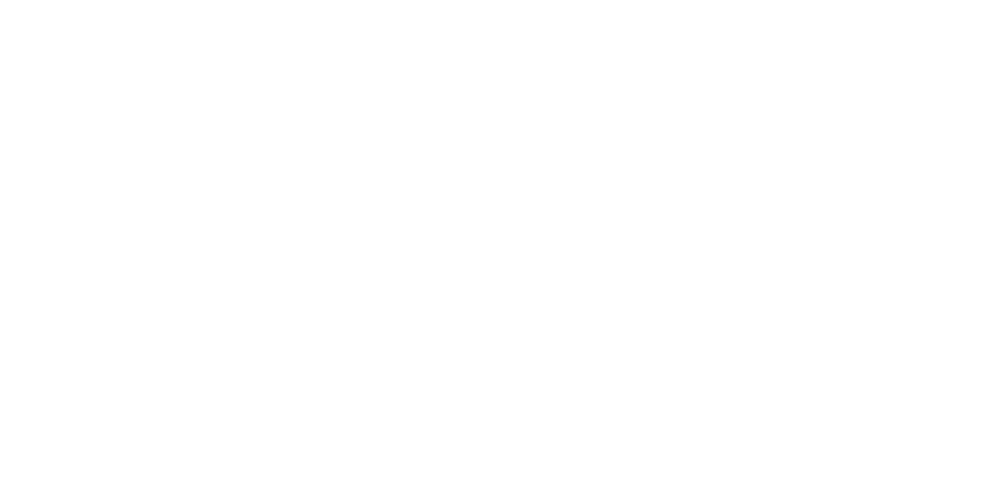

<IPython.core.display.Javascript object>


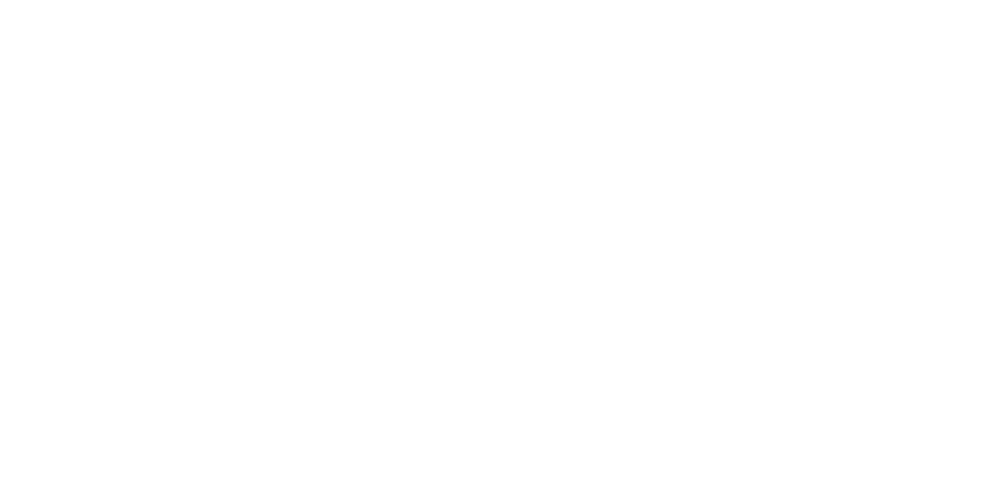

<IPython.core.display.Javascript object>


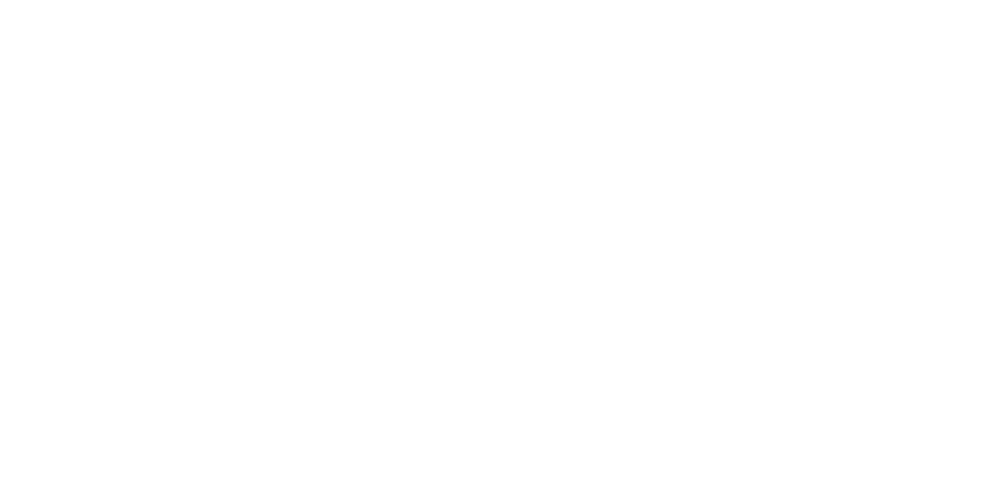

<IPython.core.display.Javascript object>


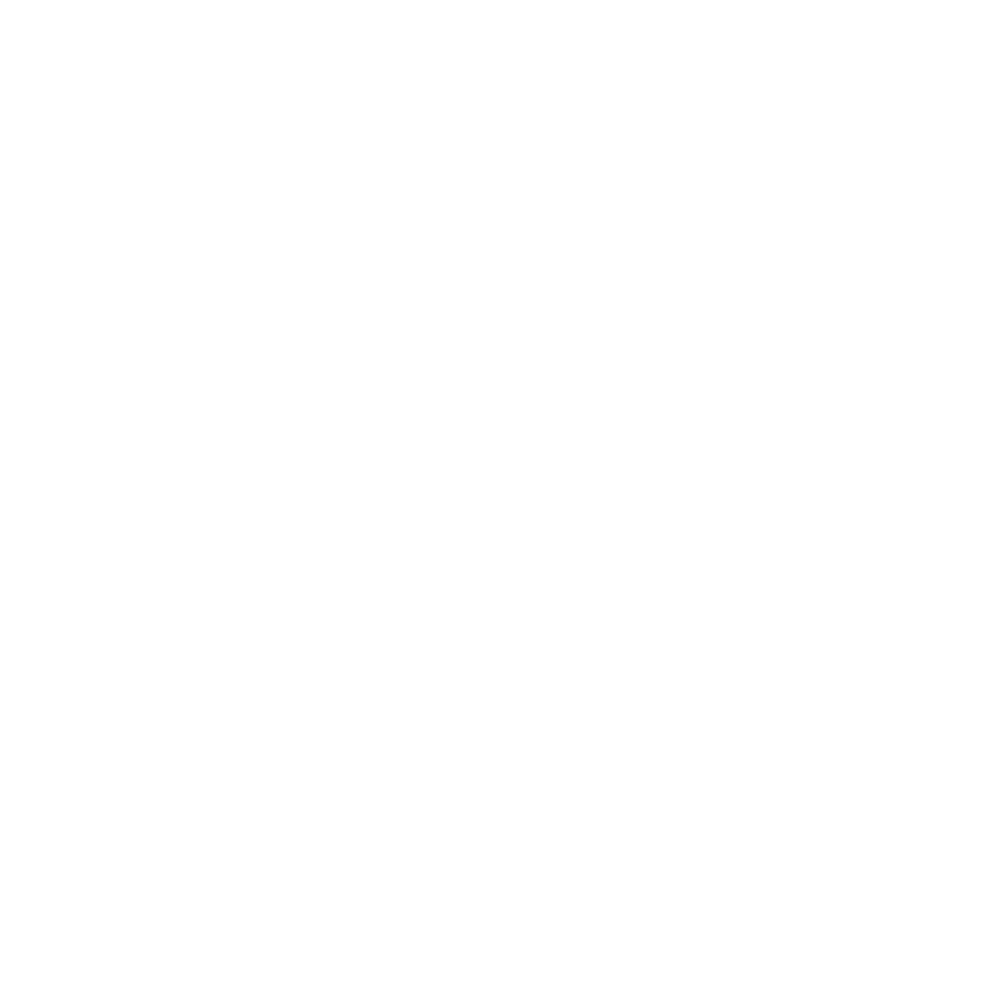

-18.7325367207


<IPython.core.display.Javascript object>


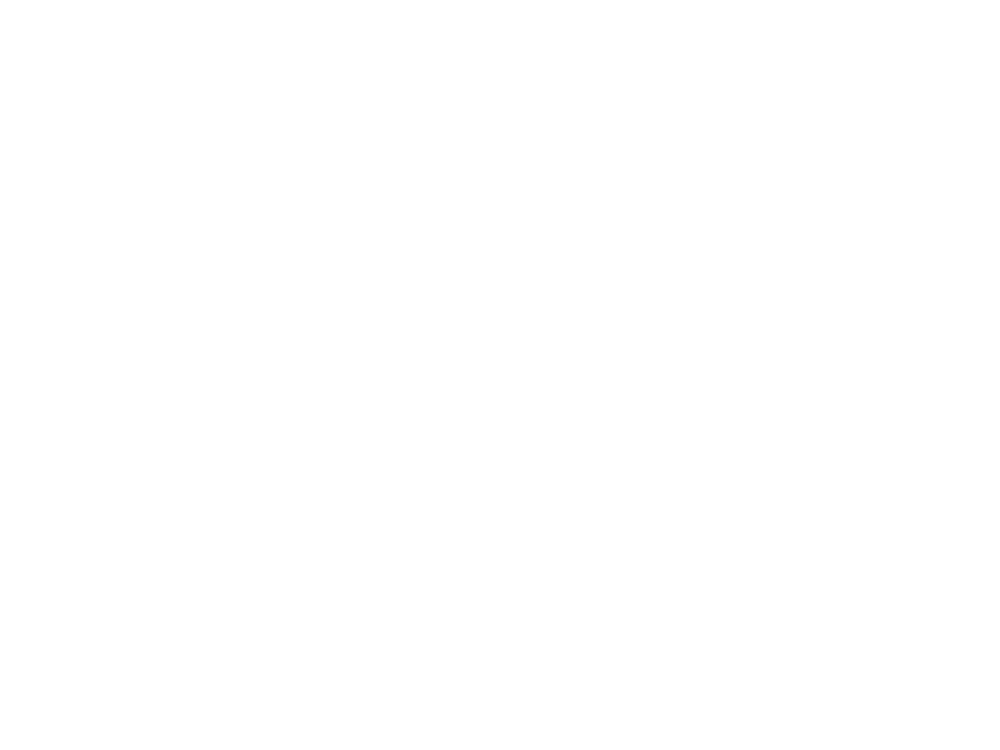

In [239]:
data, kernel, gp, res, sampler = model_gp(data, pnew, 
                                          nwalkers=200, niter=5000, nsim=500, 
                                          namestr="test", fitmethod="powell")

### Additional Data

In the meantime, we've had additional data sources become available. Let's look at those:

In [245]:
add_data = pd.read_csv("HST_APO_DCT_WHT_GEMN_NOT_WIYN_VLT_GEMS_KECK_CFHT_A2017U1_2017_10_30_date_mjd_mag_r_mag_unc_obs_code_V3.txt", sep="\t", 
                  names=["time", "mag", "mag_err", "ObsID"], skiprows=1)

In [246]:
add_data.head()

,time,mag,mag_err,ObsID
0,58051.044939,22.119892,0.053350,309
1,58051.045839,22.204845,0.082046,309
2,58051.047048,22.272917,0.088175,309
3,58051.048145,22.069767,0.094305,309
4,58051.049799,22.222690,0.072461,309


/opt/local/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


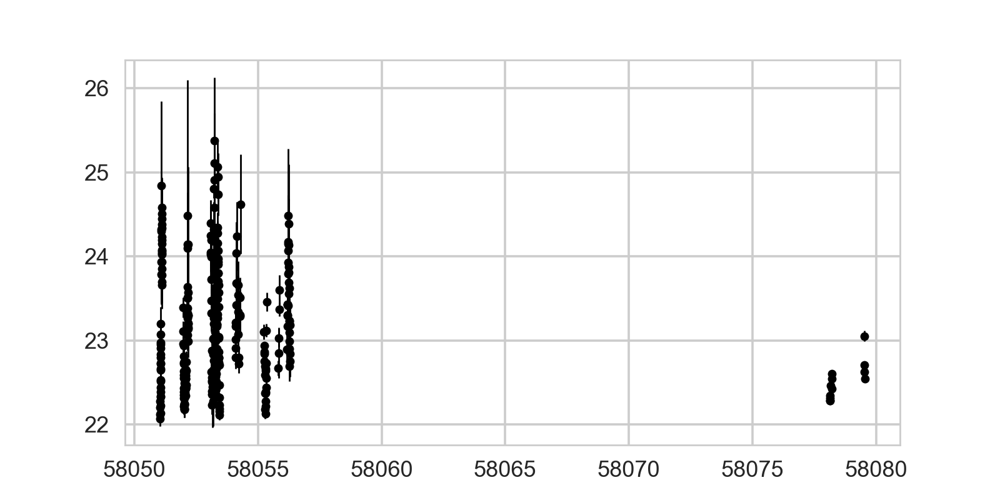

<Container object of 3 artists>

In [254]:
fig, ax = plt.subplots(1, 1, figsize=(8,4))
ax.errorbar(add_data.time, add_data.mag, yerr=add_data.mag_err, 
            fmt="o", markersize=5, lw=1, color="black")

Let's look at the periodic model:

/opt/local/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/scipy/optimize/optimize.py:1927: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)
/opt/local/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


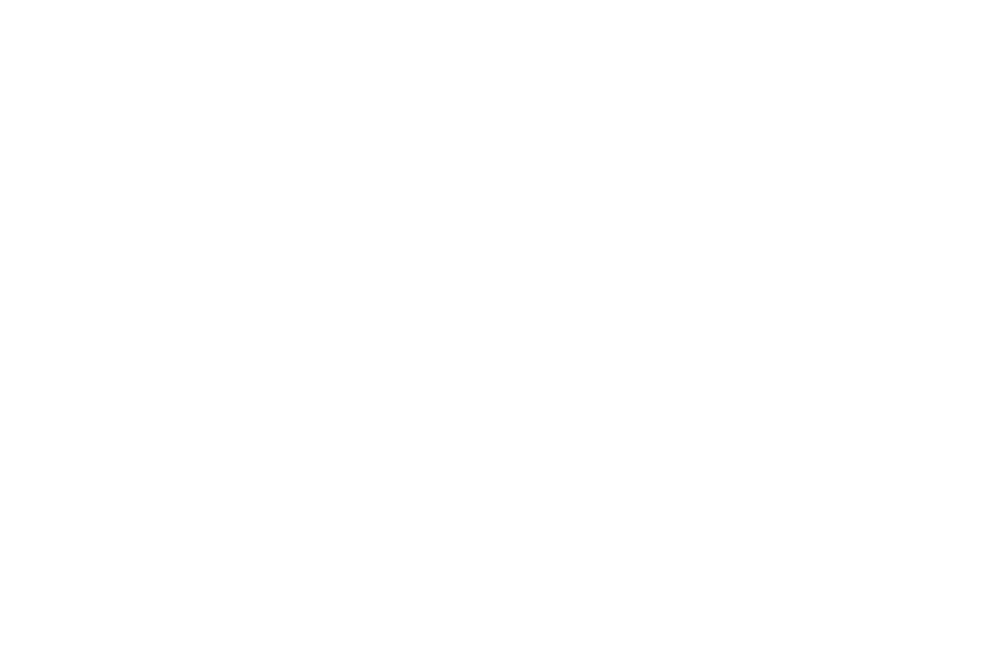

Running burn-in


<IPython.core.display.Javascript object>


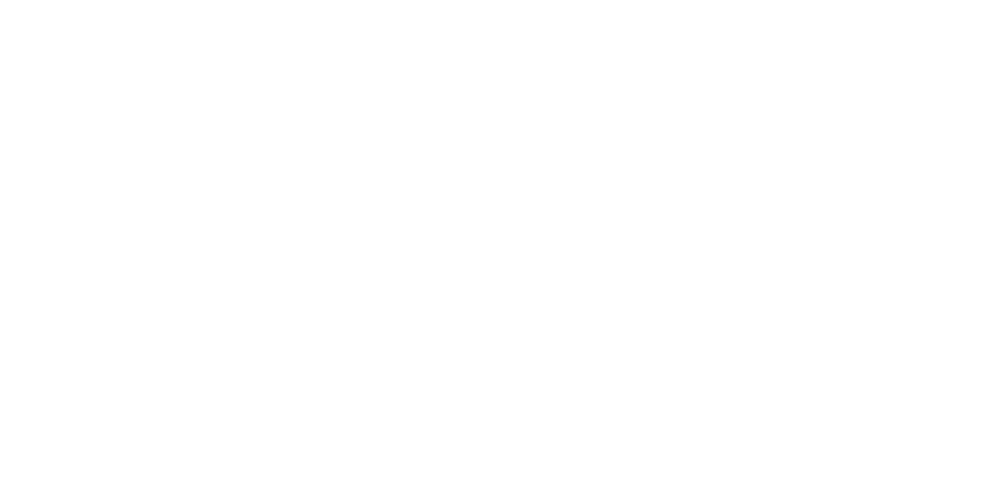

<IPython.core.display.Javascript object>


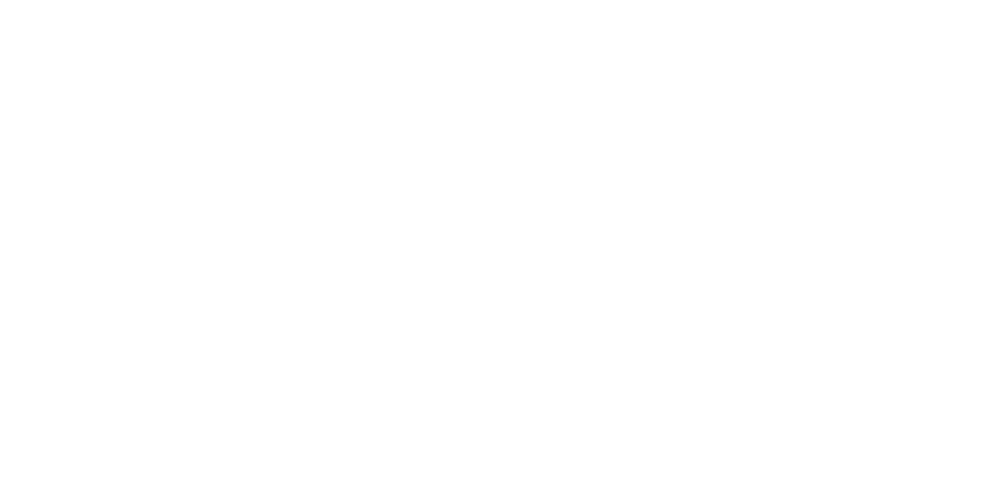

<IPython.core.display.Javascript object>


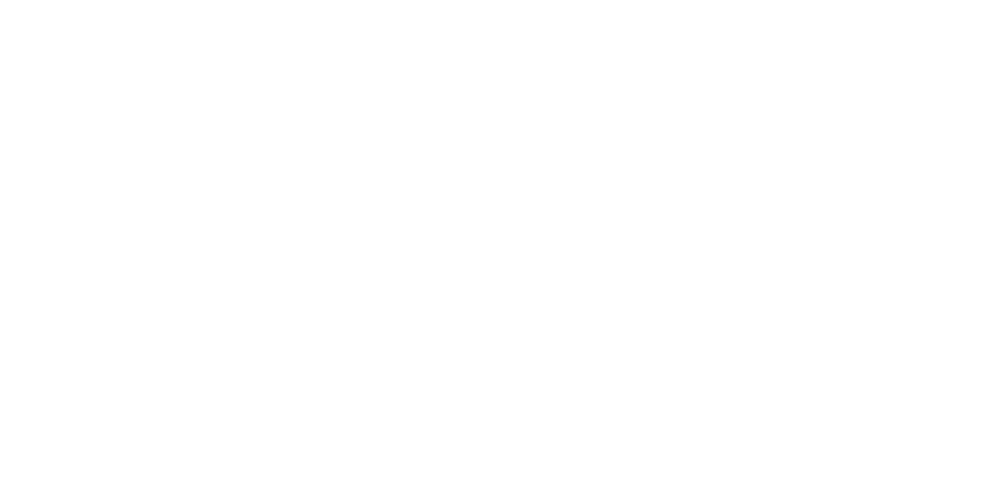

<IPython.core.display.Javascript object>


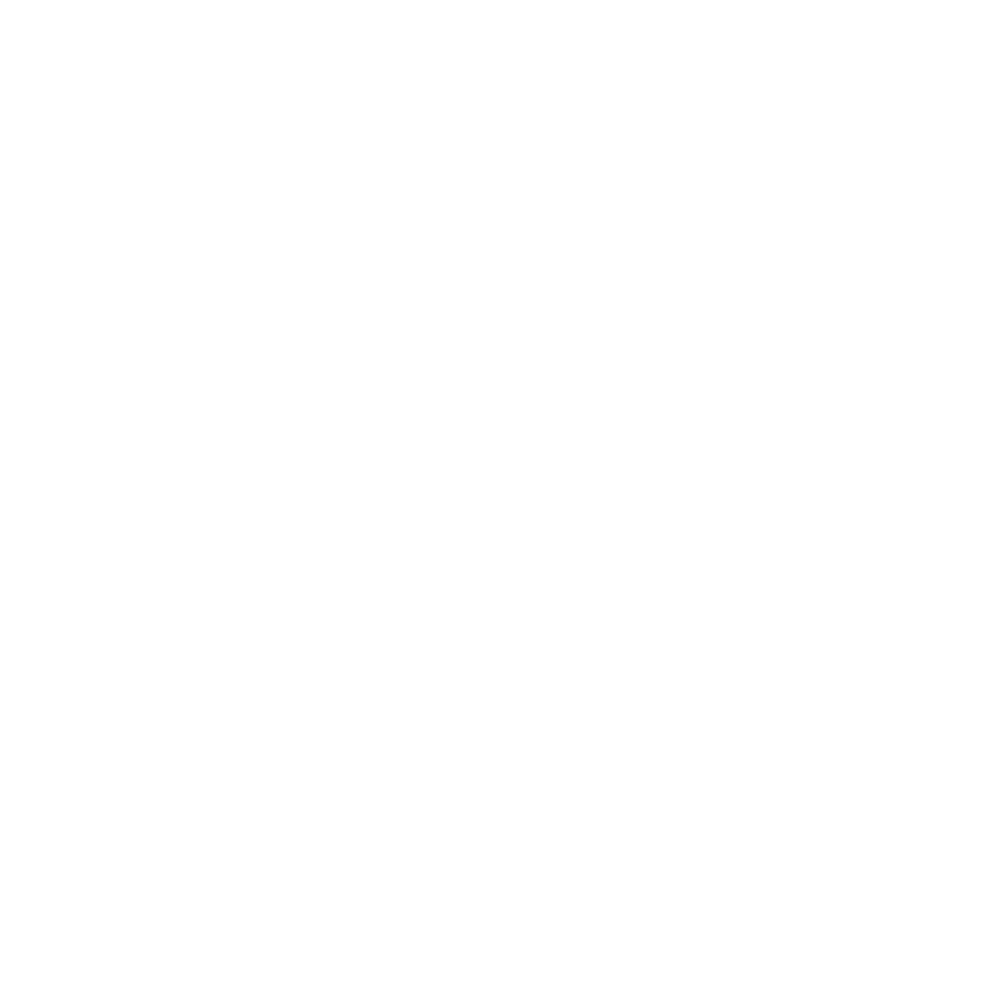

The posterior mean and uncertainty for the log-amplitude is $\log(A) = $ -0.720 (+0.059/-0.112)
The posterior mean and uncertainty for the period is $P = $ 0.157 (+0.047/-0.015)
The posterior mean and uncertainty for the mean magnitude is $\lambda =$ 22.815 (+0.010/-0.012)


<IPython.core.display.Javascript object>


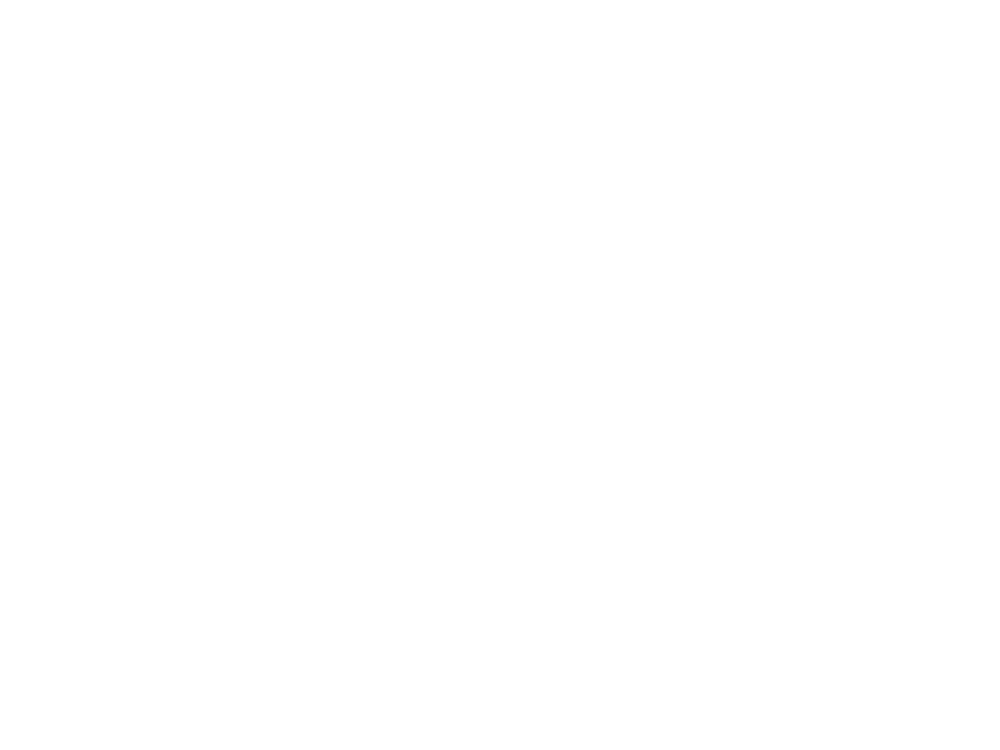

<IPython.core.display.Javascript object>


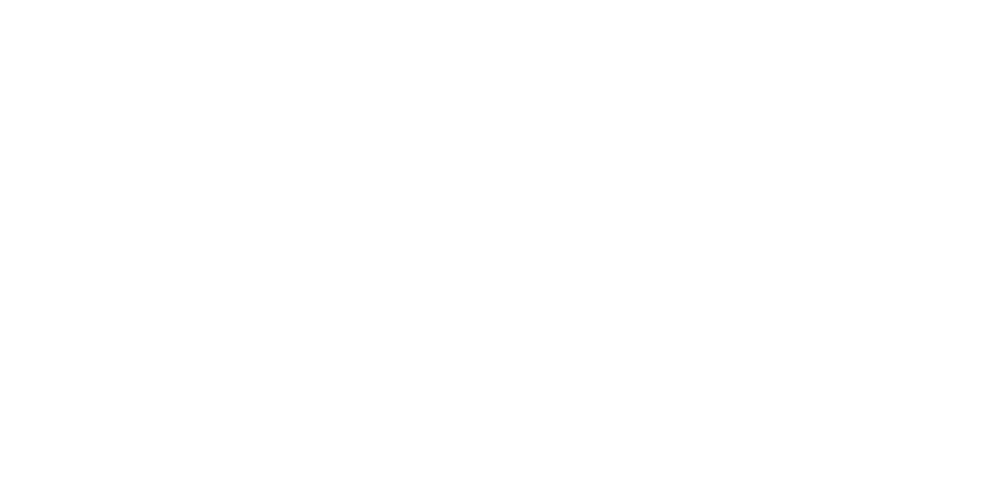

<IPython.core.display.Javascript object>


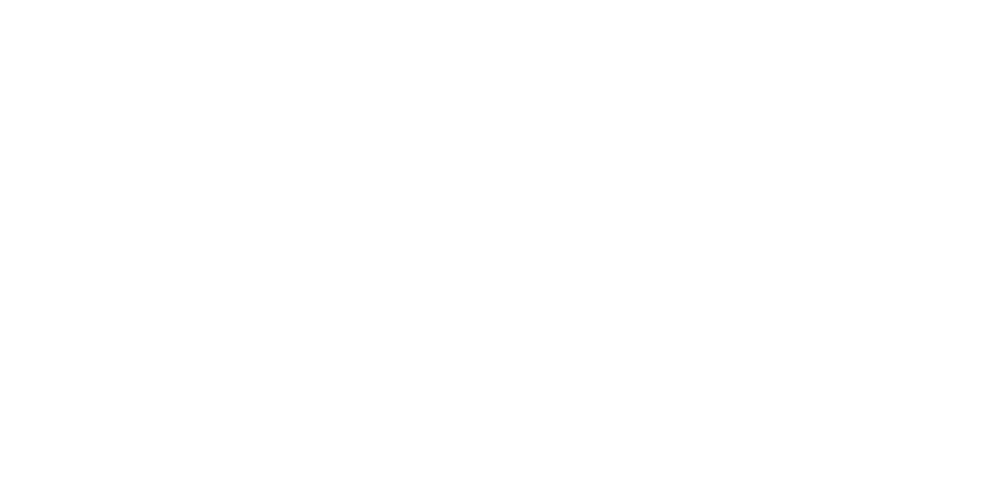

<IPython.core.display.Javascript object>


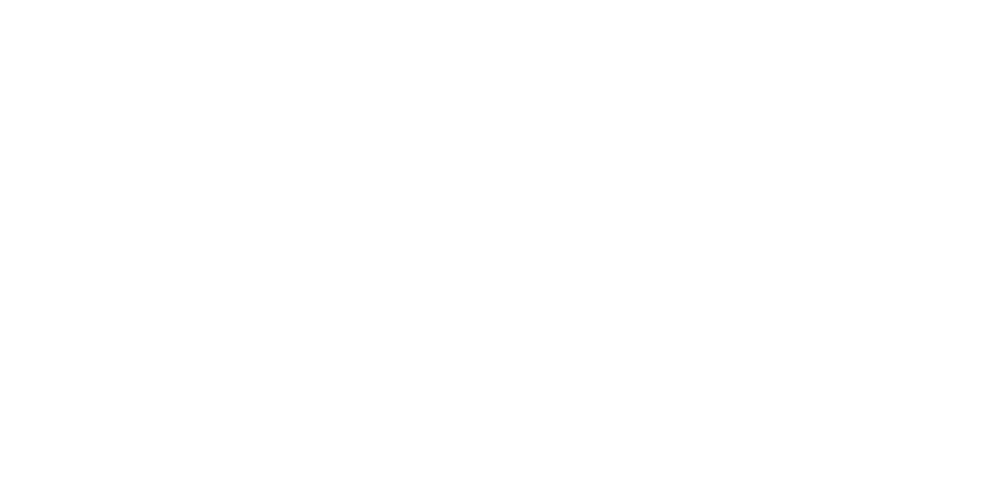

<IPython.core.display.Javascript object>


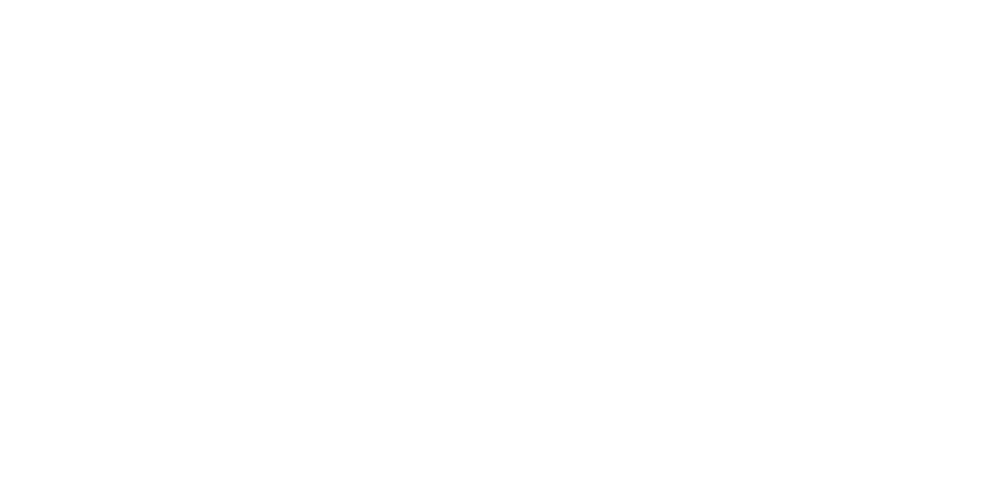

<IPython.core.display.Javascript object>


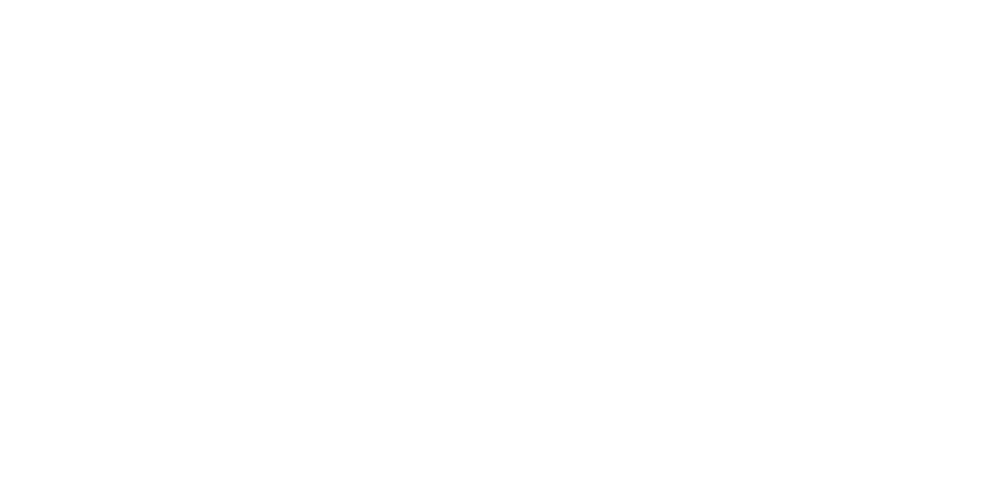

<IPython.core.display.Javascript object>


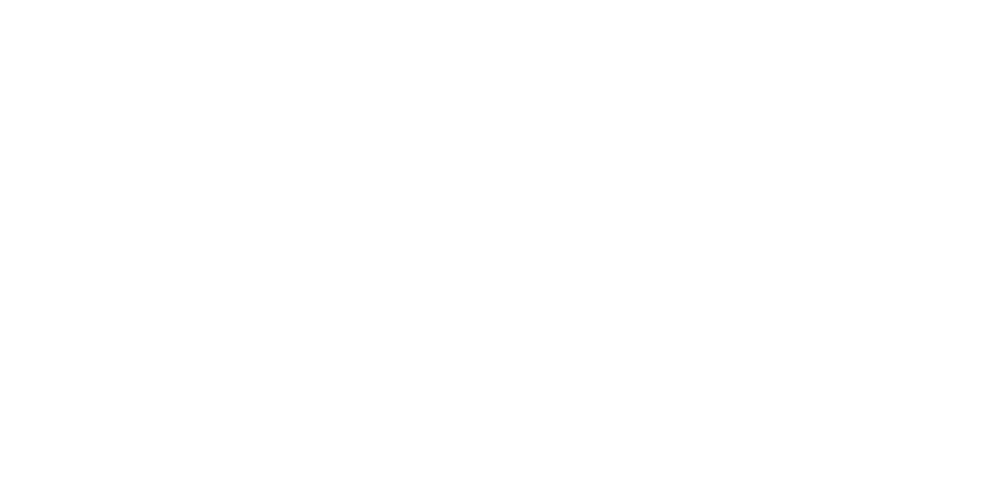

<IPython.core.display.Javascript object>


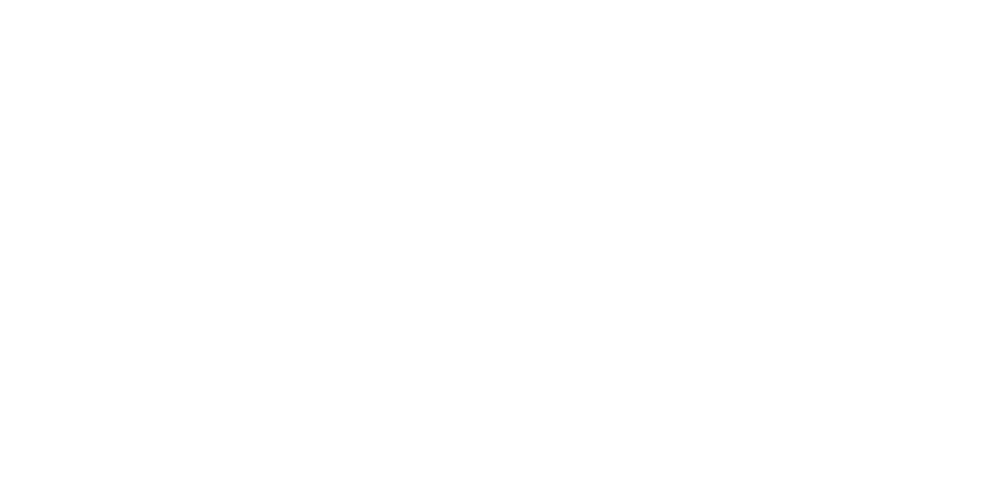

<IPython.core.display.Javascript object>


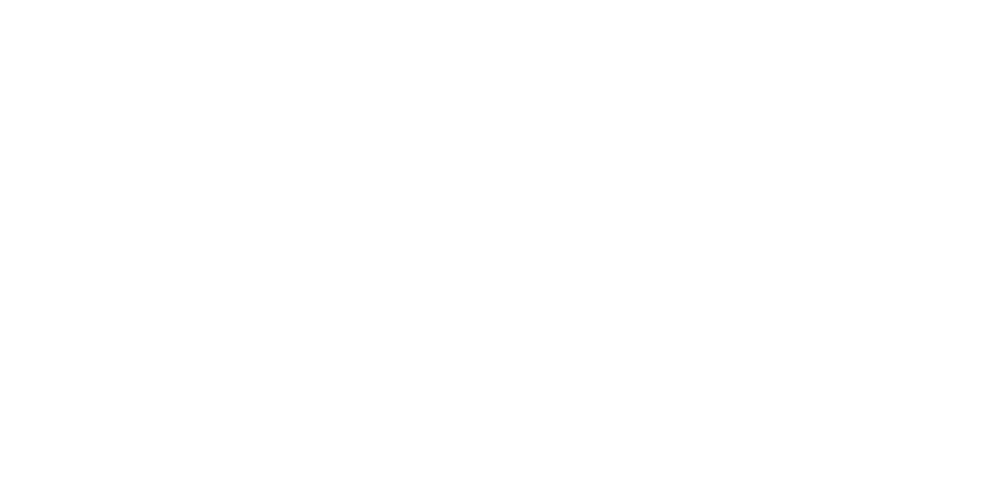

In [260]:
sine_lpost, sine_res, sine_sampler = model_sine_curve(add_data, start_pars, nwalkers=400, niter=50000, nsim=100, 
                                       namestr="all_data_with_hst", fitmethod="powell")

/opt/local/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


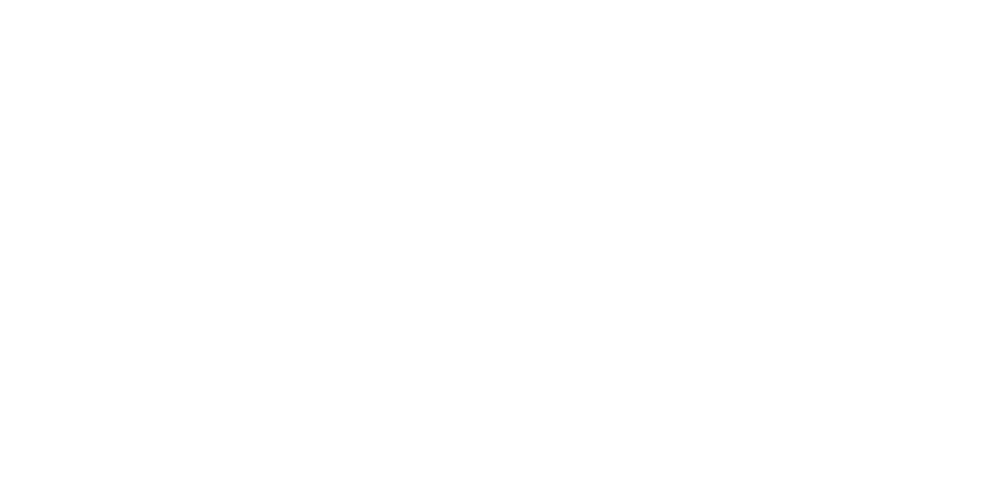

-480.674195419
[  2.32984136e+01  -6.93348814e-01   3.16292720e+03   2.21365938e+00]
-110.303268349


<IPython.core.display.Javascript object>


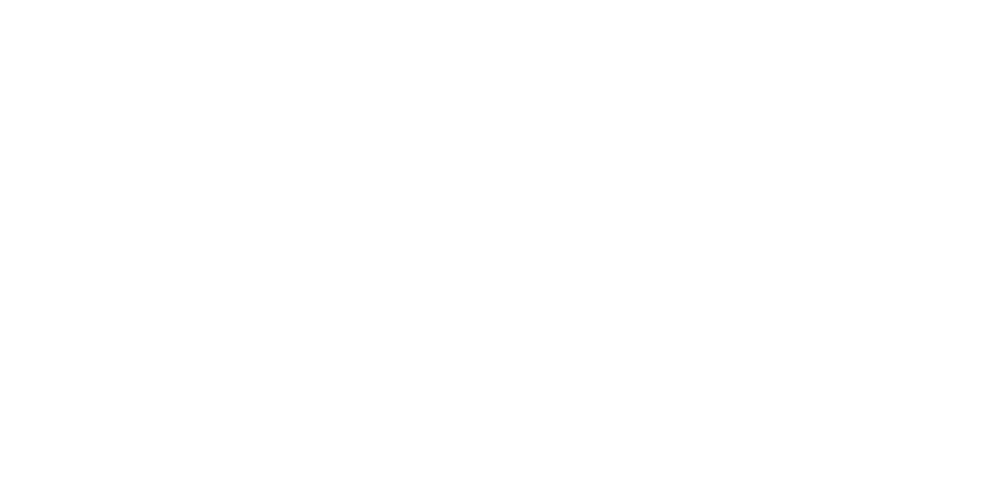

Running burn-in


<IPython.core.display.Javascript object>


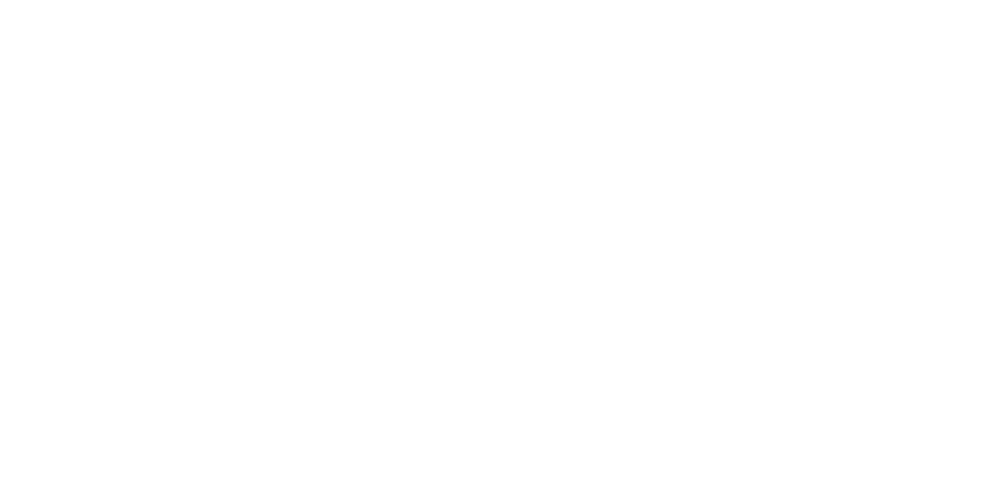

<IPython.core.display.Javascript object>


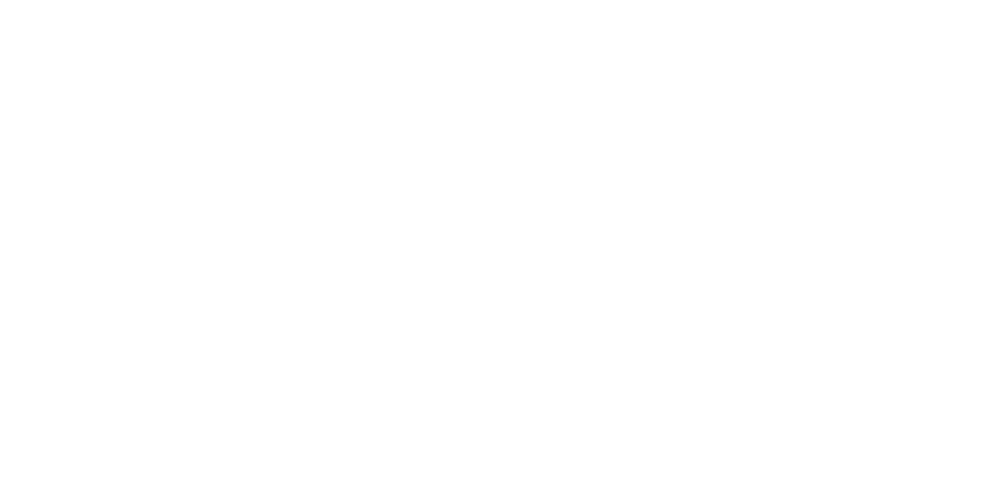

<IPython.core.display.Javascript object>


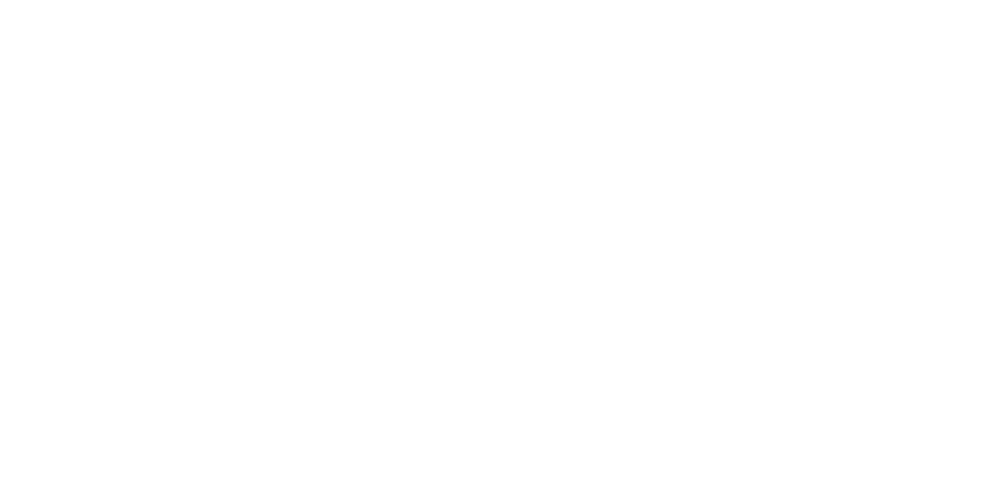

<IPython.core.display.Javascript object>


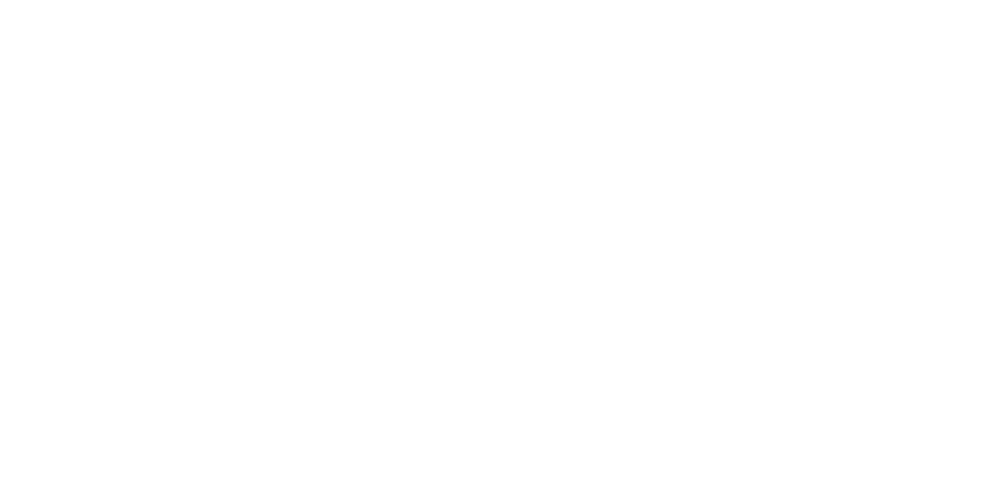

<IPython.core.display.Javascript object>


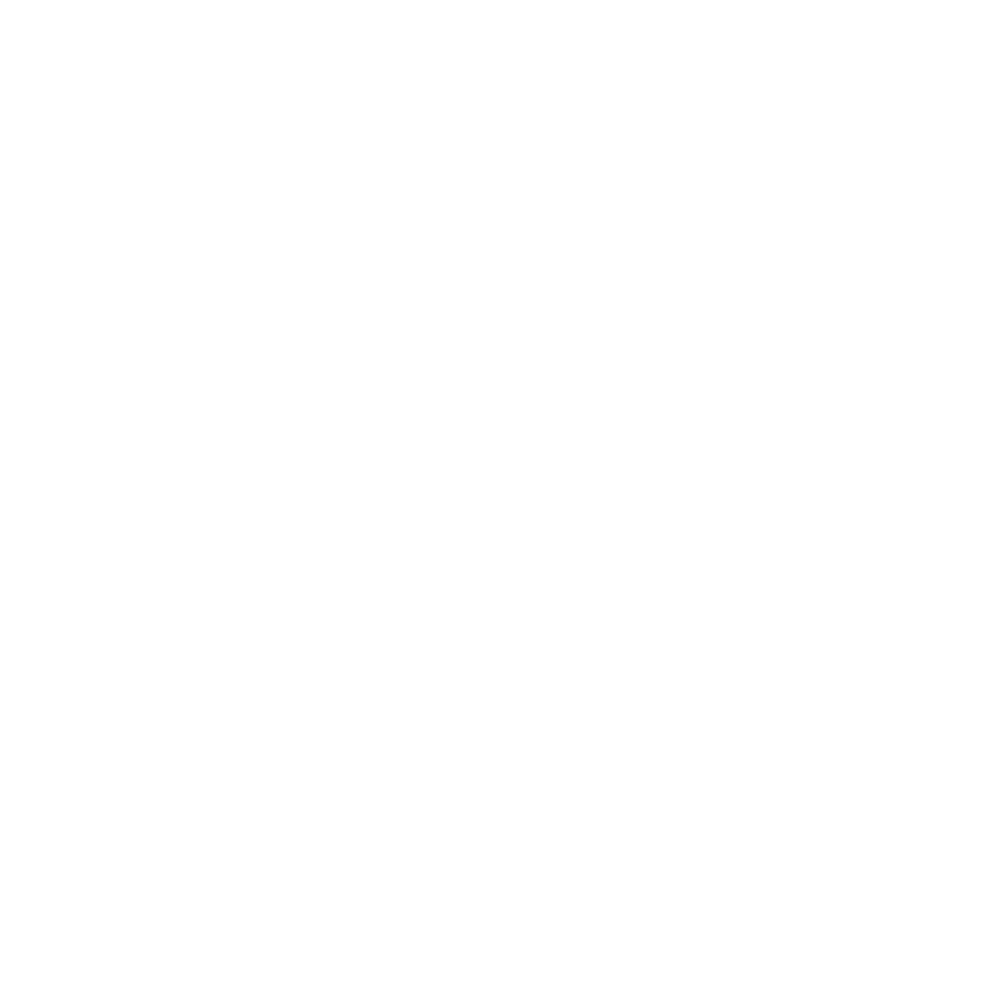

-143.526073202


<IPython.core.display.Javascript object>


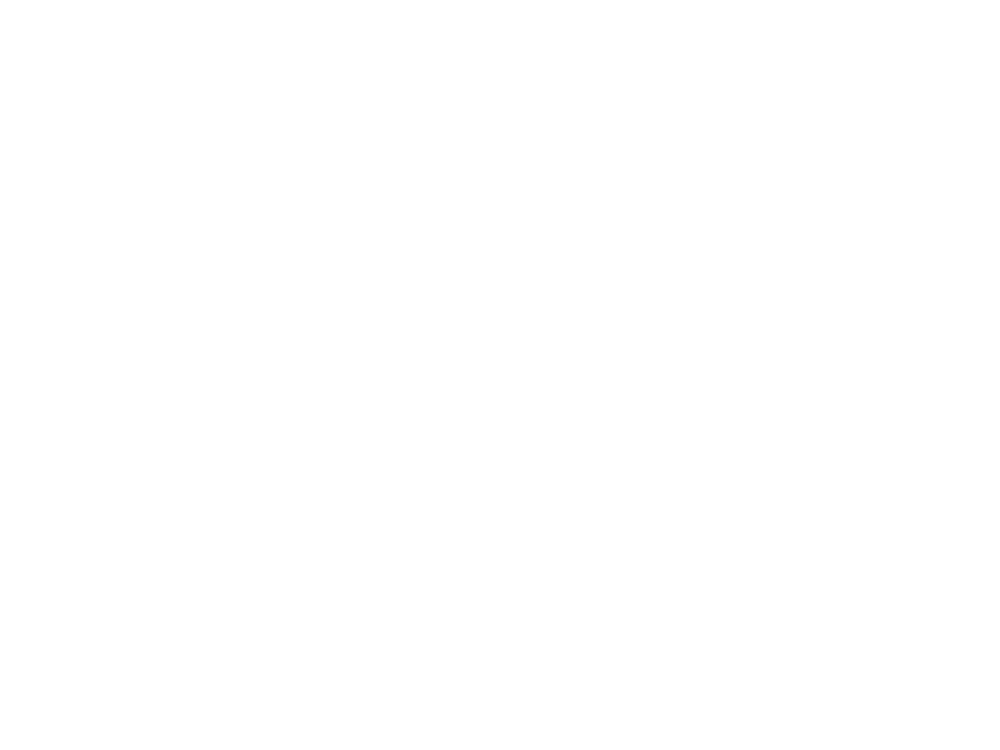

<IPython.core.display.Javascript object>


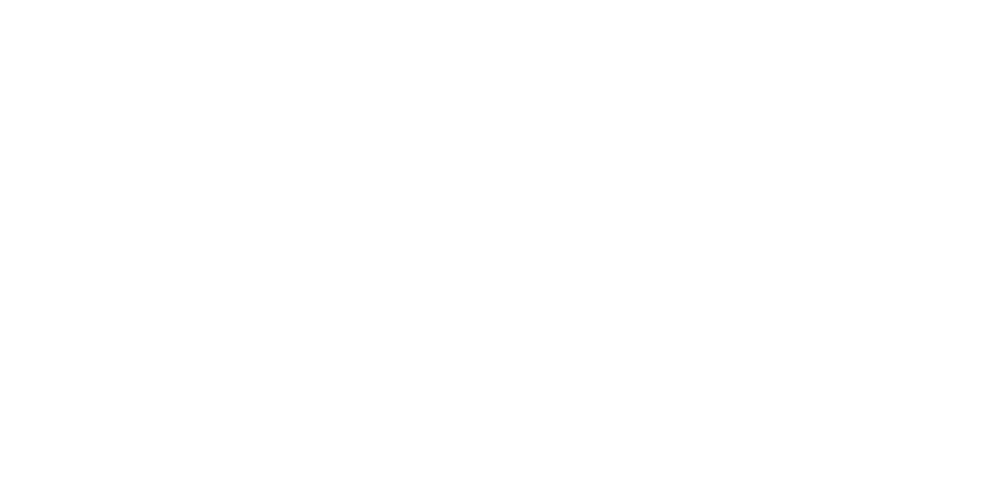

<IPython.core.display.Javascript object>


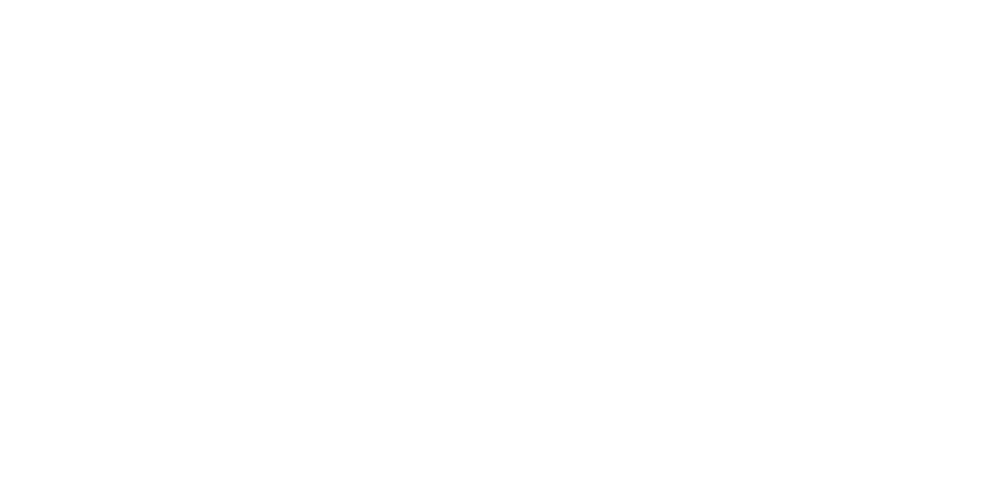

<IPython.core.display.Javascript object>


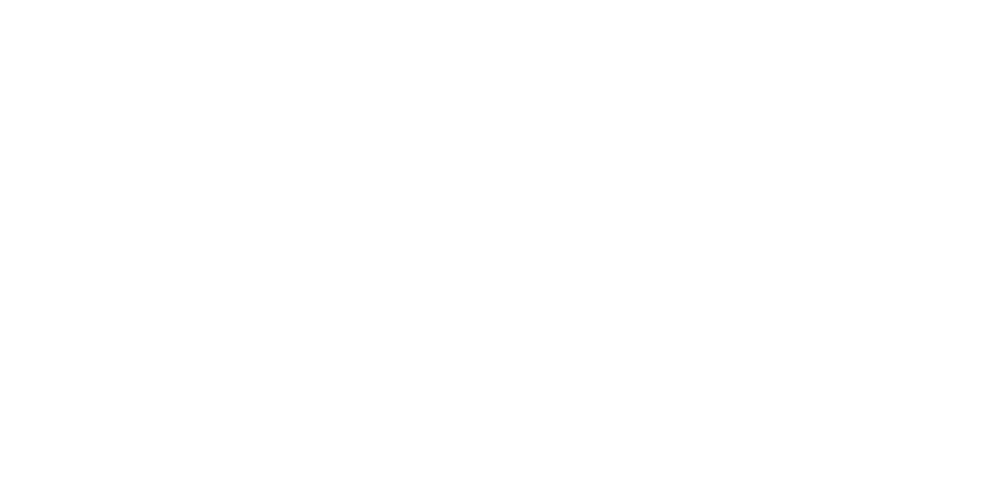

<IPython.core.display.Javascript object>


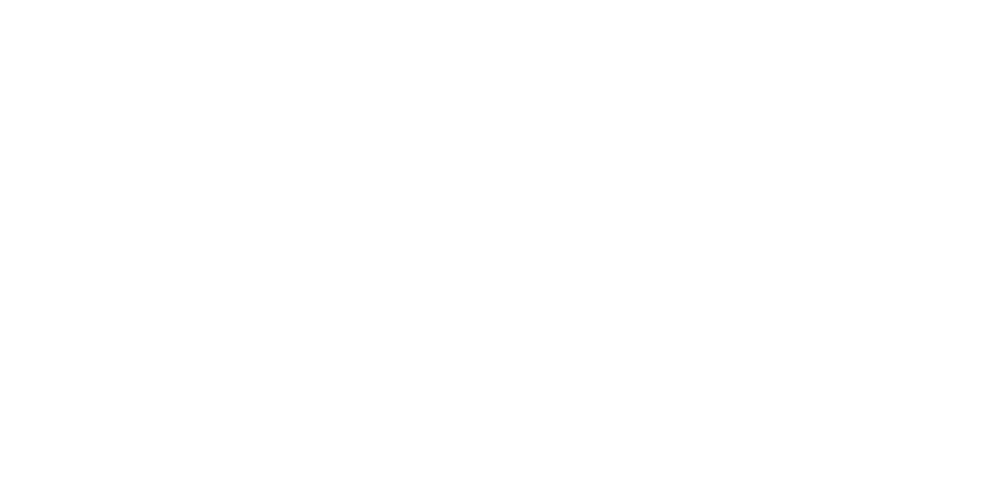

<IPython.core.display.Javascript object>


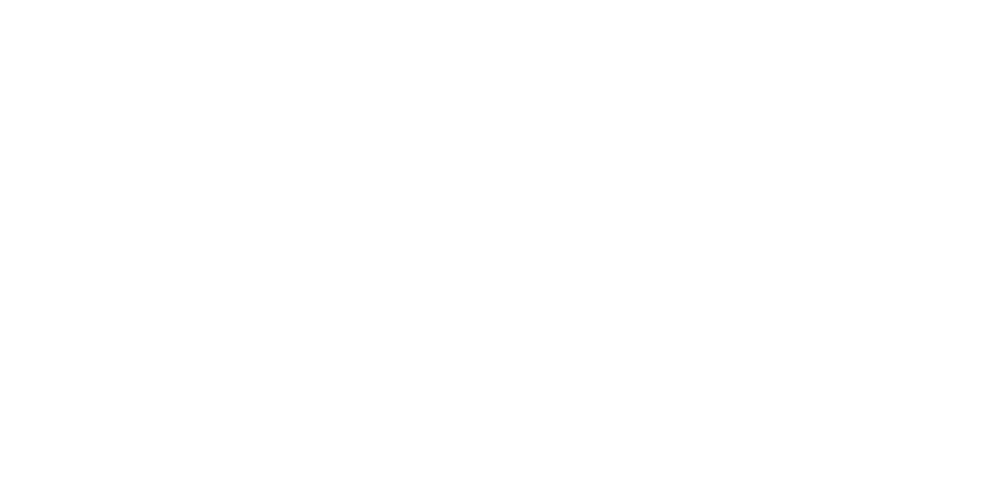

<IPython.core.display.Javascript object>


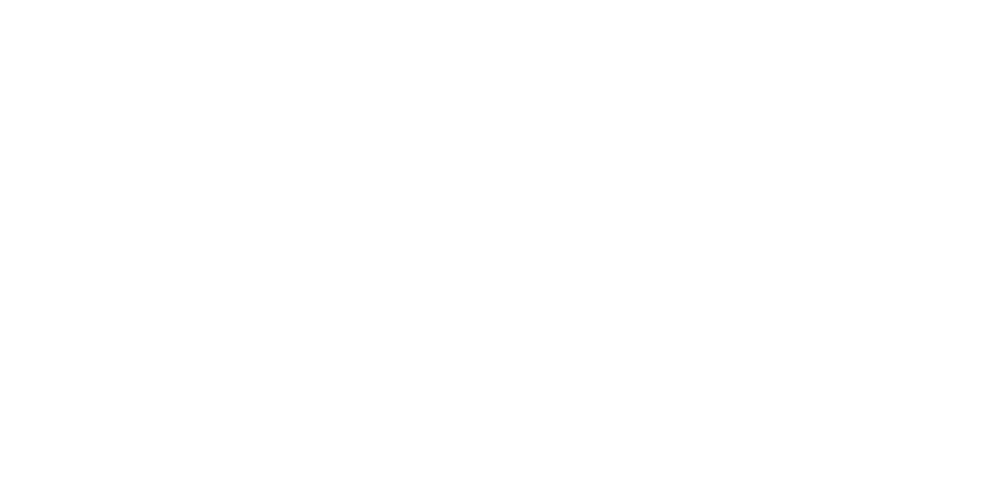

<IPython.core.display.Javascript object>


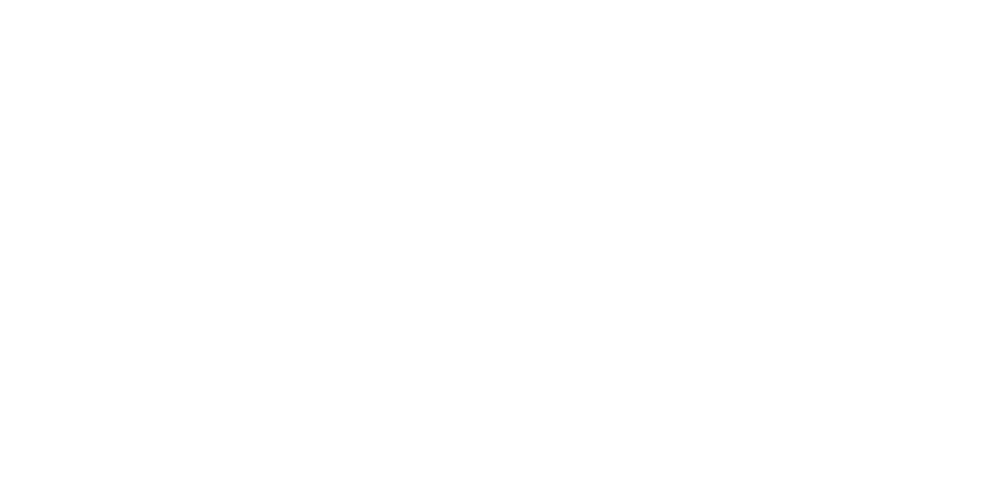

<IPython.core.display.Javascript object>


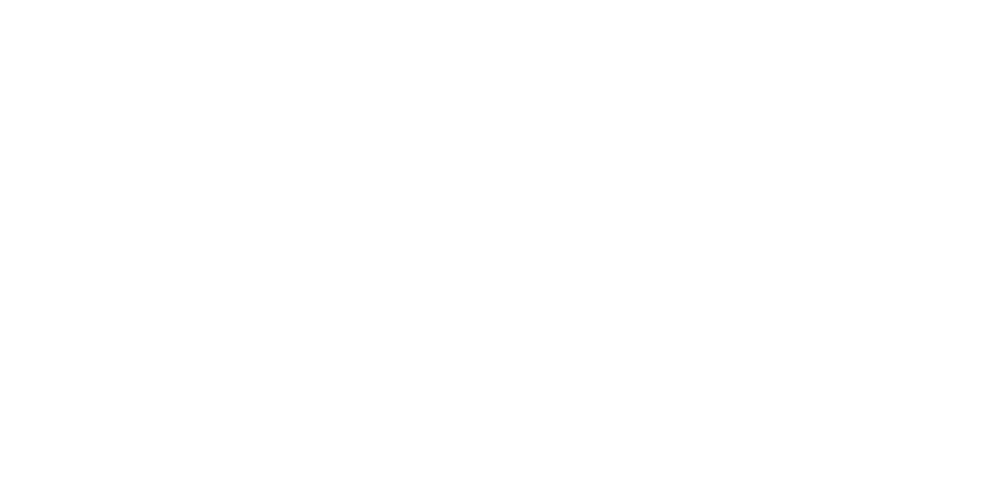

In [269]:
gp_data, gp_kernel, gp, gp_res, gp_sampler = model_gp(add_data, pnew, 
                                          nwalkers=250, niter=10000, nsim=200, 
                                          namestr="all_data_with_hst", fitmethod="powell")

### Run 1: APO, DCT, HST (I think)

Bryce had some suggestions for smaller runs, which I'm going to do to see whether the HST data is useful:

In [270]:
obs = ["705", "G37", "250"]

In [273]:
run1_data = add_data[(add_data.ObsID == obs[0]) |
         (add_data.ObsID == obs[1]) |
         (add_data.ObsID == obs[2])]

/opt/local/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/scipy/optimize/optimize.py:1927: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)
/opt/local/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


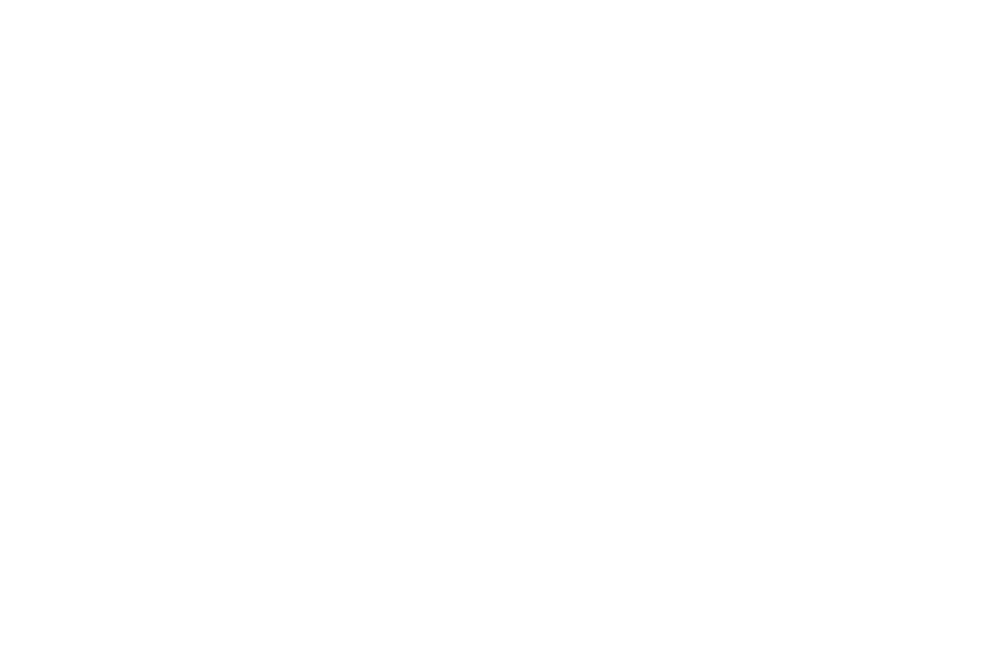

Running burn-in


<IPython.core.display.Javascript object>


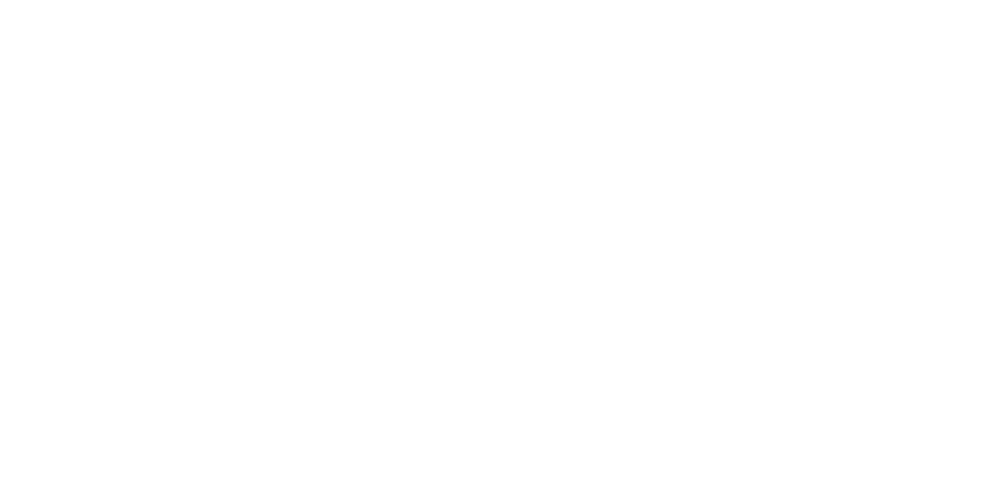

<IPython.core.display.Javascript object>


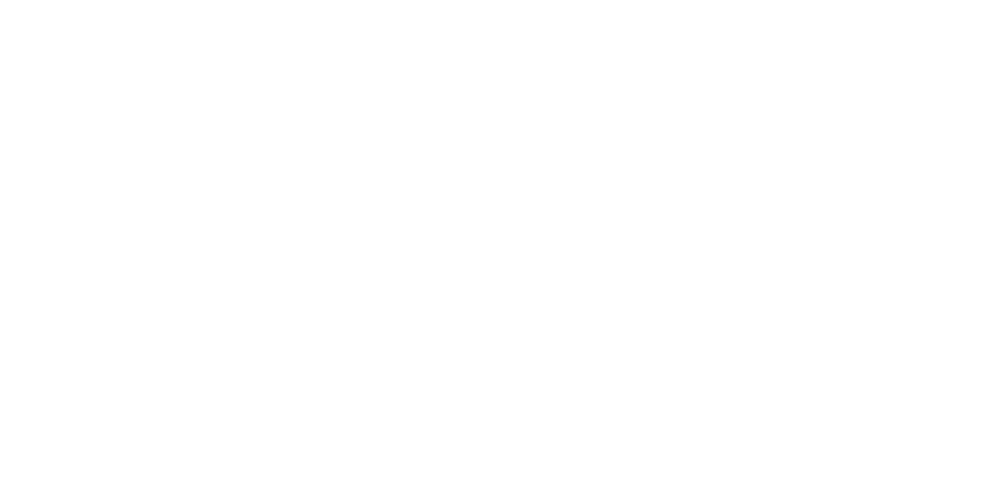

<IPython.core.display.Javascript object>


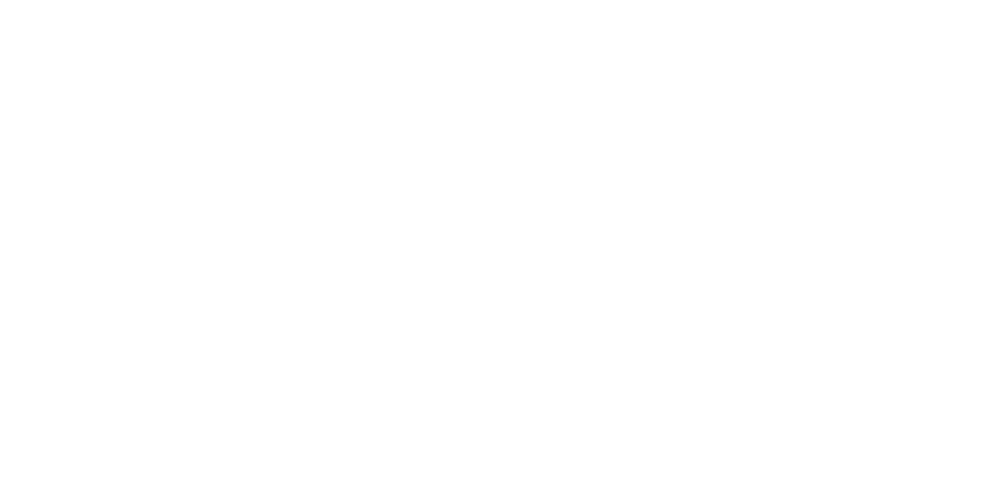

<IPython.core.display.Javascript object>


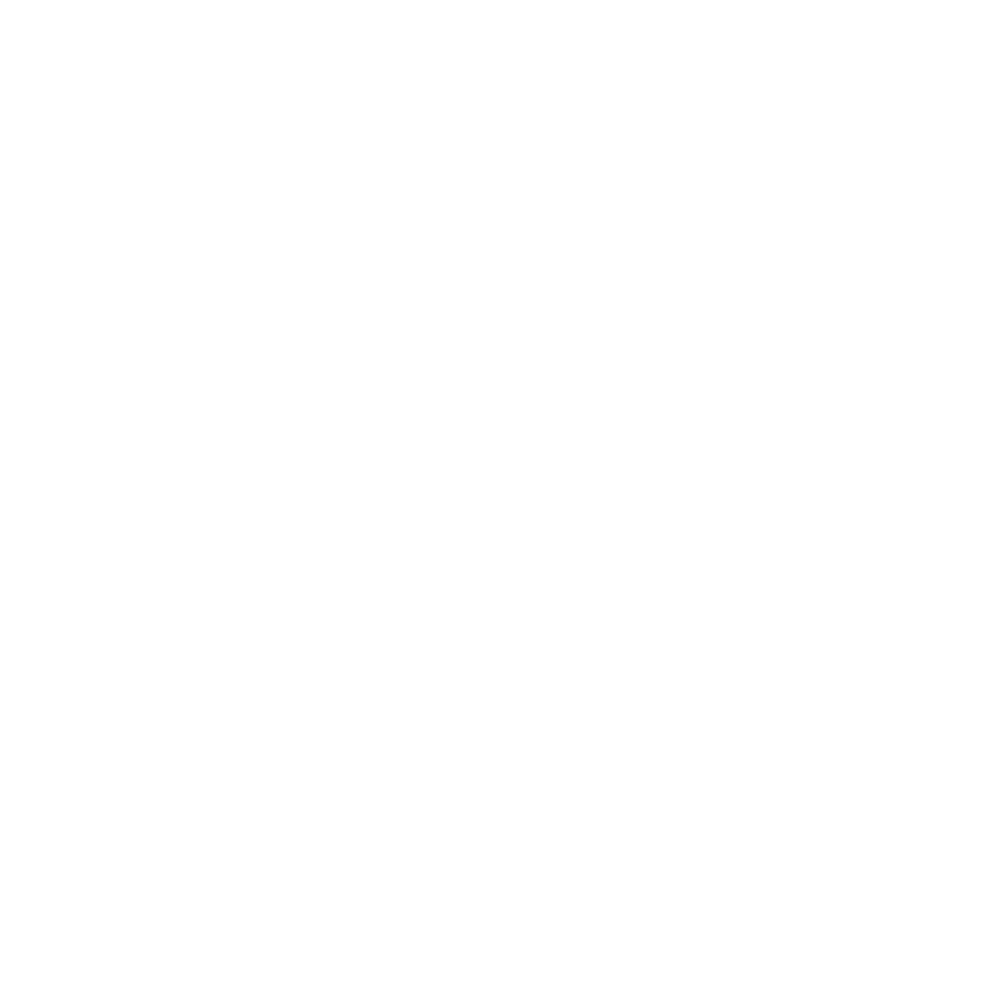

The posterior mean and uncertainty for the log-amplitude is $\log(A) = $ -0.726 (+0.135/-0.173)
The posterior mean and uncertainty for the period is $P = $ 0.623 (+0.168/-0.248)
The posterior mean and uncertainty for the mean magnitude is $\lambda =$ 22.818 (+0.064/-0.100)


/Users/danielahuppenkothen/work/repositories/CometPeriodSearch/period_search.py:371: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  data["phase"] = phase


<IPython.core.display.Javascript object>


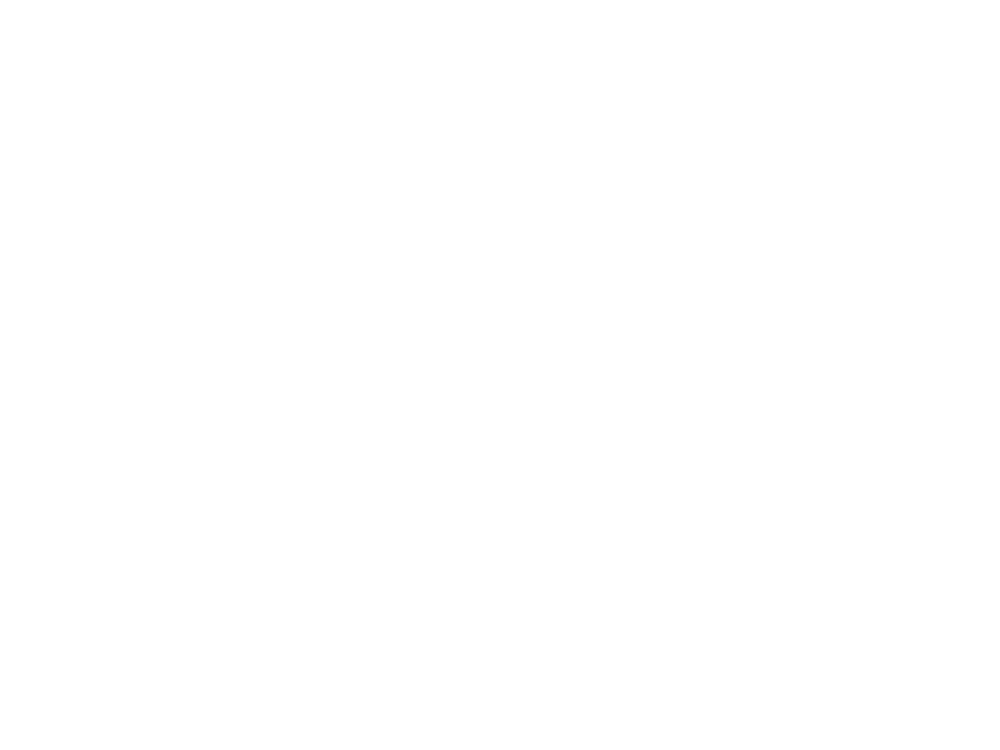

<IPython.core.display.Javascript object>


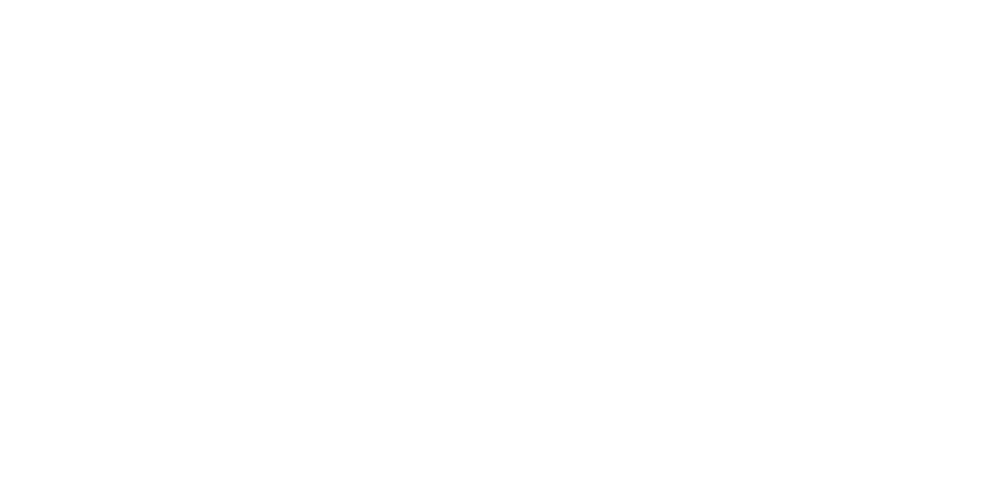

<IPython.core.display.Javascript object>


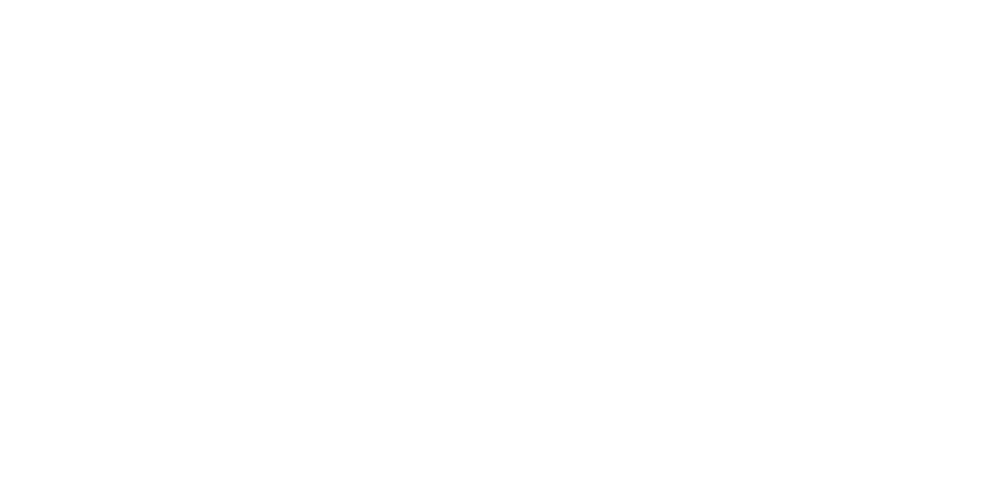

<IPython.core.display.Javascript object>


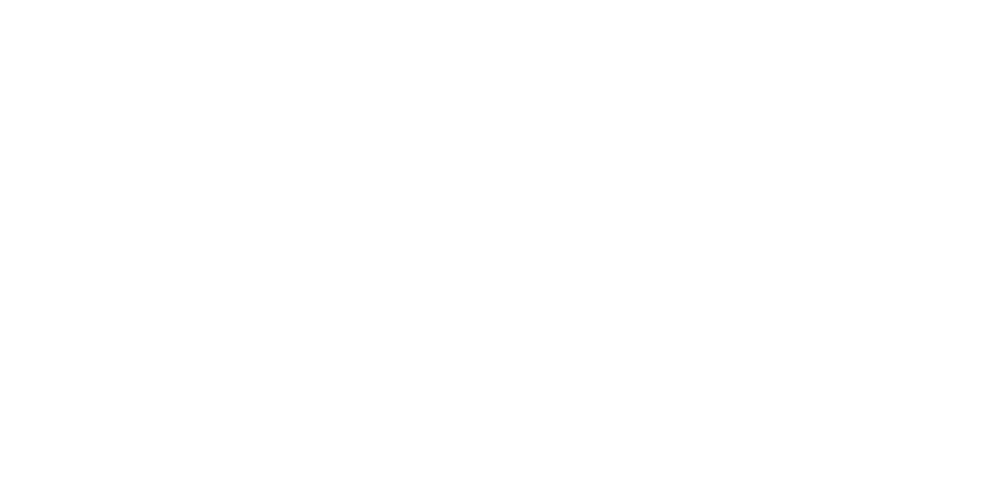

In [275]:
sine_run1_lpost, sine_run1_res, sine_run1_sampler = model_sine_curve(run1_data, start_pars, nwalkers=400, niter=50000, nsim=100, 
                                       namestr="run1", fitmethod="powell")

/opt/local/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


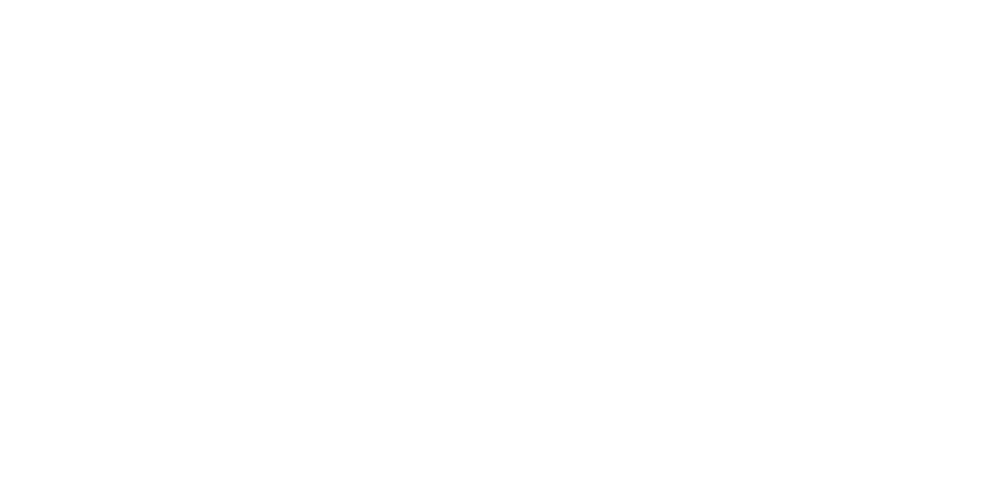

-42.6449450654
[  22.86993307   -1.44356311  327.78056877    0.90543643]
-19.4986382822


<IPython.core.display.Javascript object>


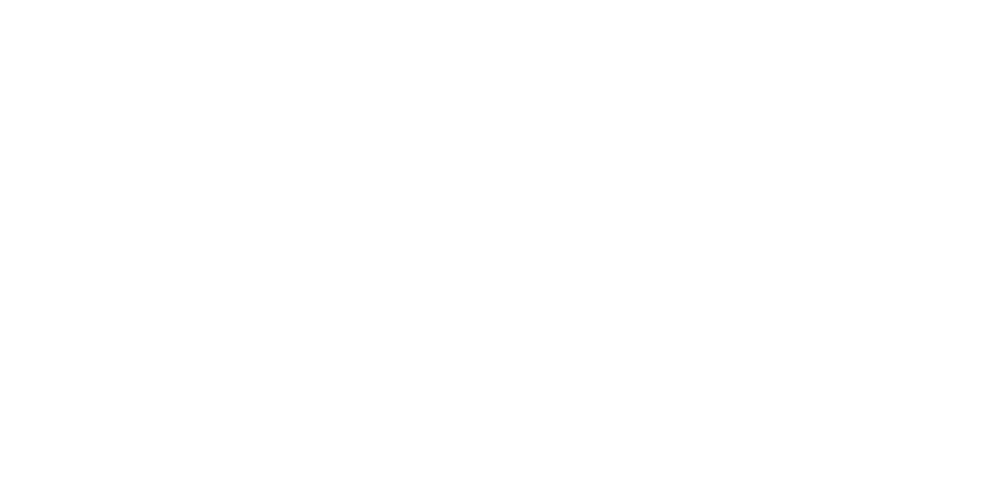

Running burn-in


<IPython.core.display.Javascript object>


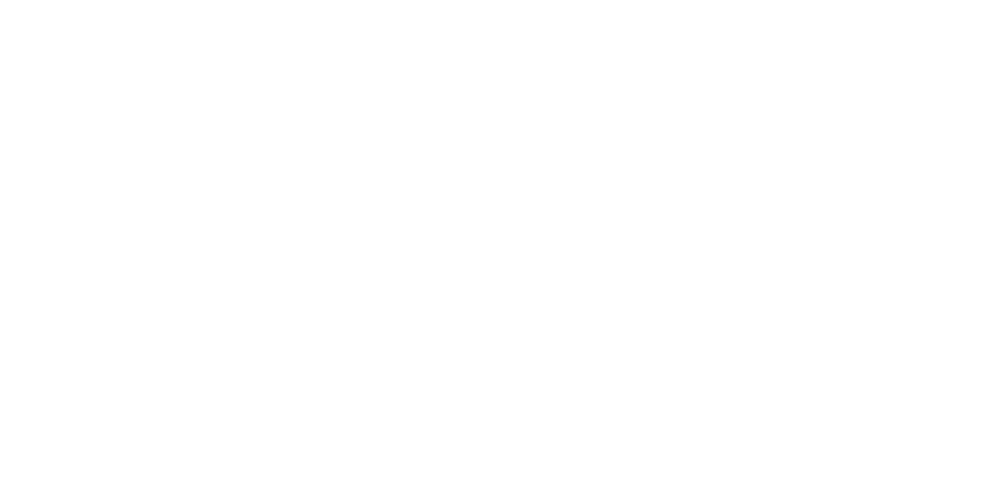

<IPython.core.display.Javascript object>


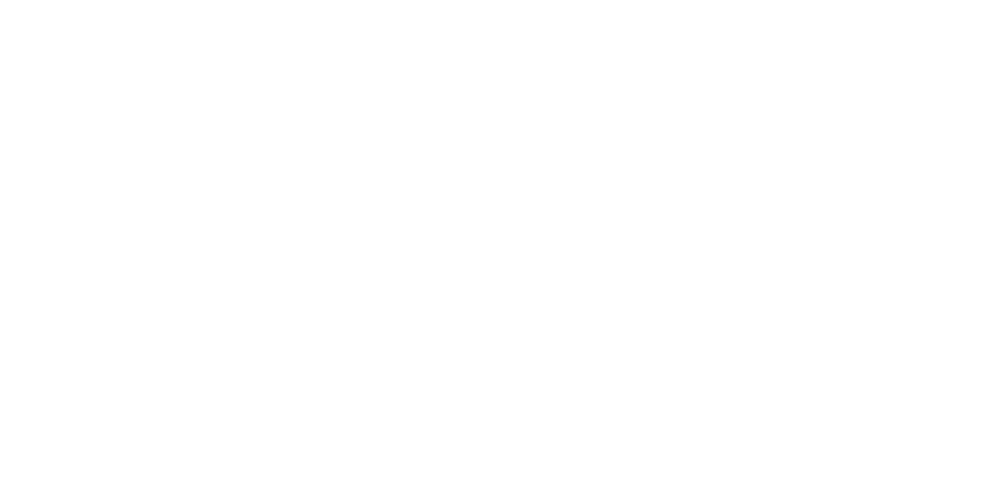

<IPython.core.display.Javascript object>


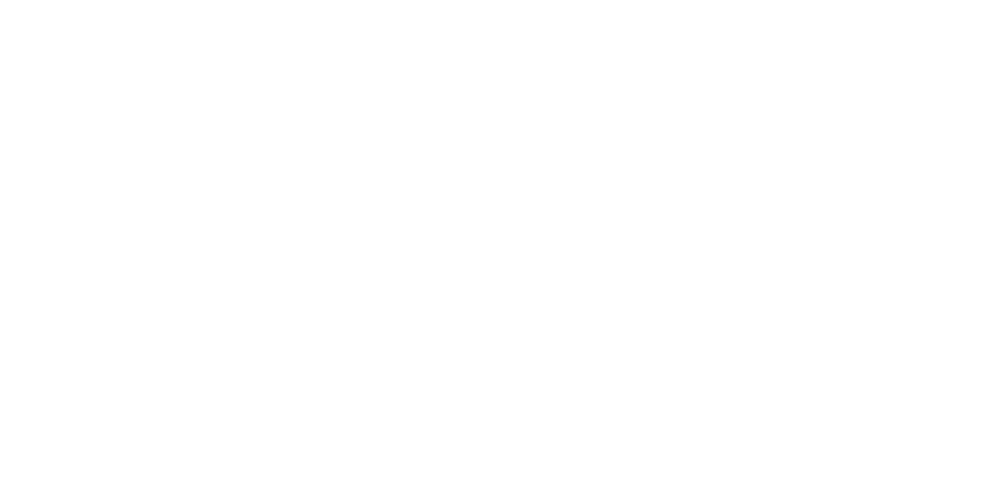

<IPython.core.display.Javascript object>


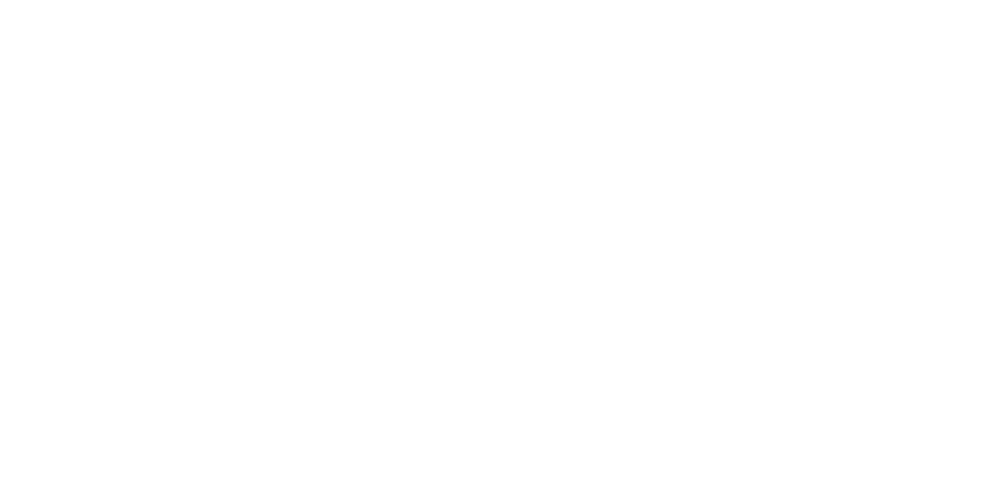

<IPython.core.display.Javascript object>


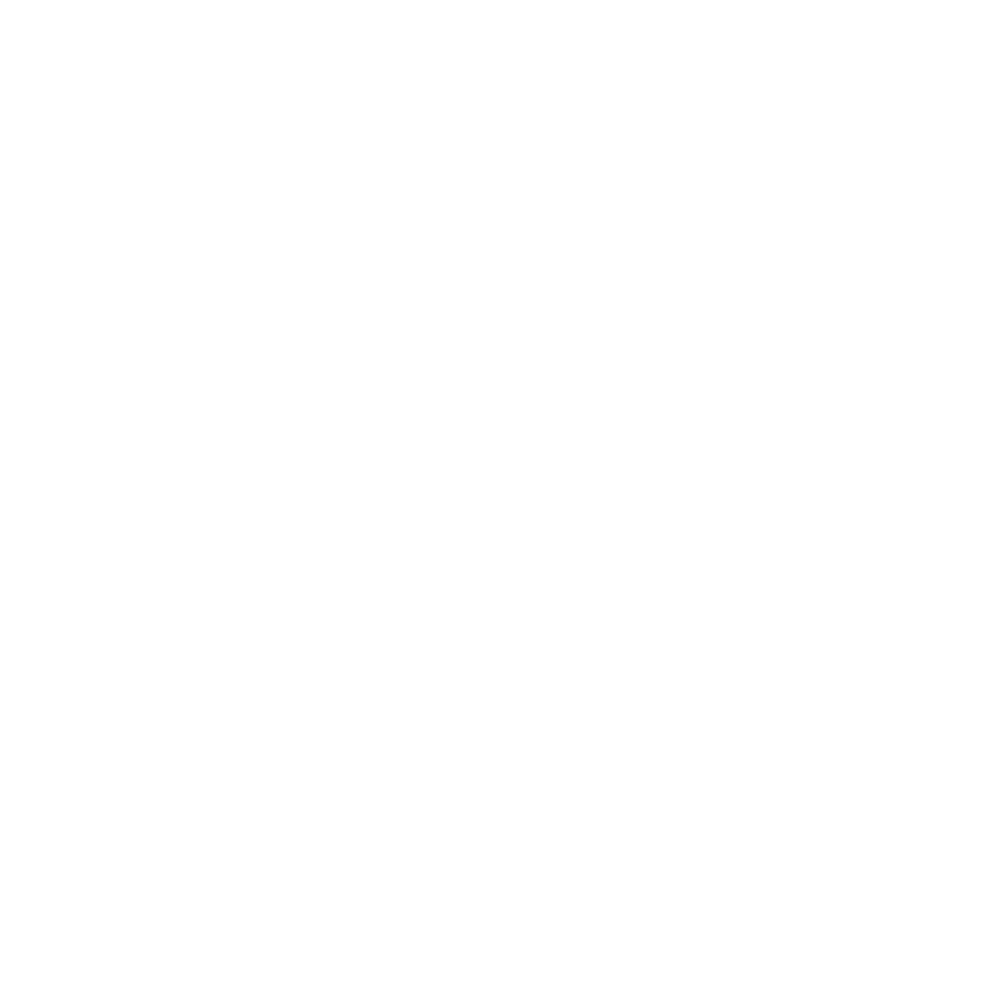

-21.4699492021


/Users/danielahuppenkothen/work/repositories/CometPeriodSearch/period_search.py:717: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  data["phase"] = phase


<IPython.core.display.Javascript object>


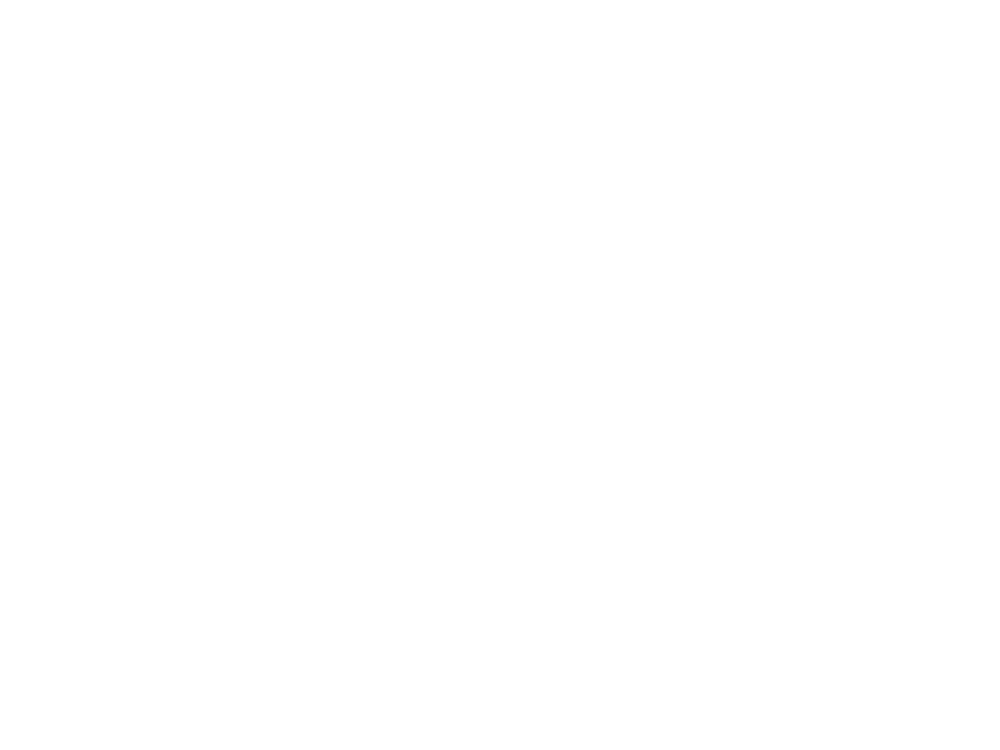

<IPython.core.display.Javascript object>


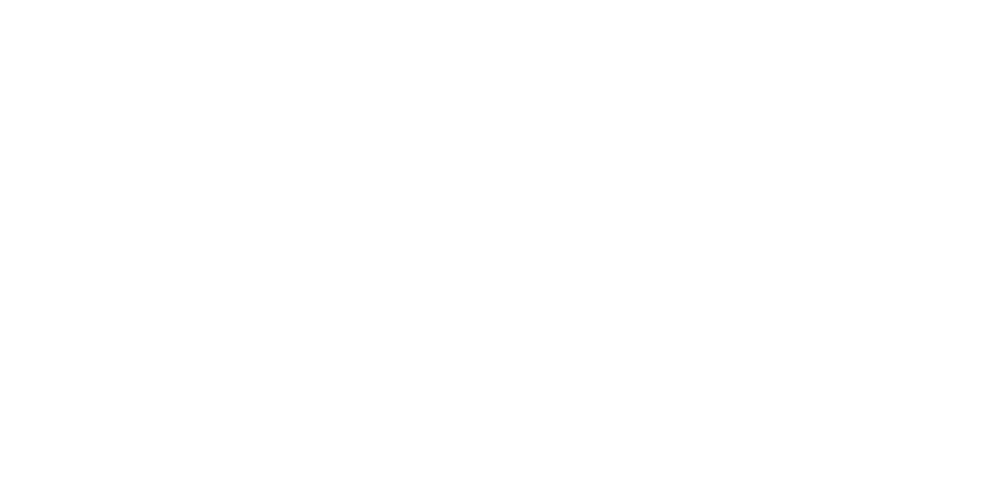

<IPython.core.display.Javascript object>


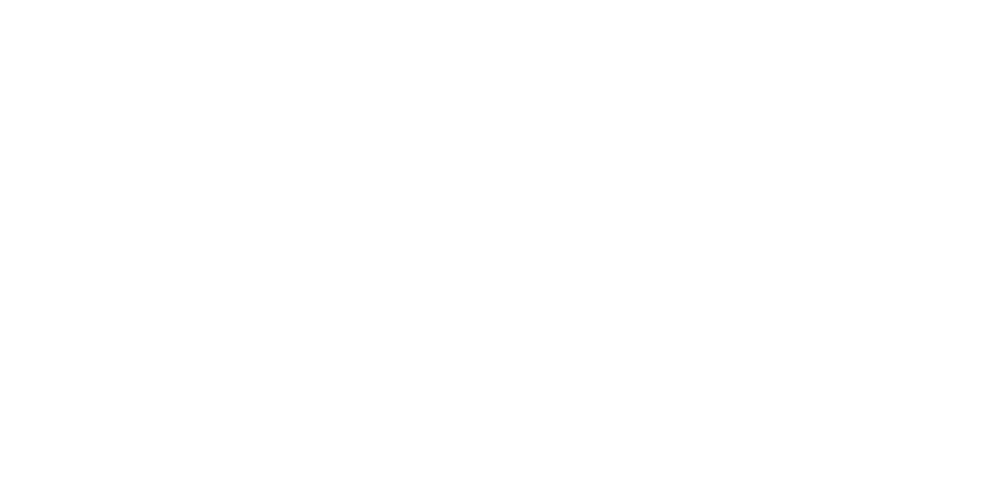

<IPython.core.display.Javascript object>


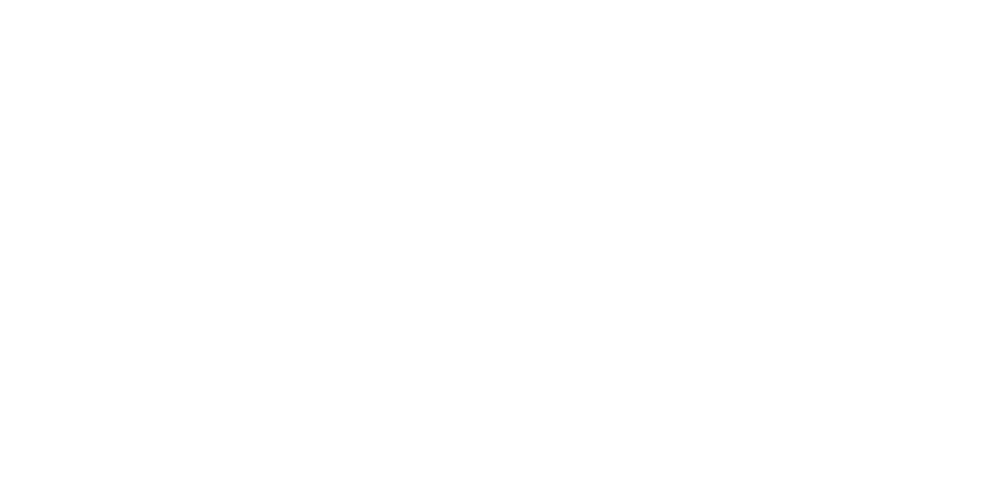

In [276]:
gp_run1_data, gp_run1_kernel, gp_run1, gp_run1_res, gp_run1_sampler = model_gp(run1_data, pnew, 
                                          nwalkers=250, niter=10000, nsim=200, 
                                          namestr="run1", fitmethod="powell")

I'm going to remove the DCT data, since it seems to maybe be off by one hour?

In [136]:
add_data_nodct = add_data#.loc[add_data.ObsID != "G37"]

Okay, let's fit a periodic light curve:

In [137]:
time = np.array(add_data_nodct.time)
mag = np.array(add_data_nodct.mag)
mag_err = np.array(add_data_nodct.mag_err)

In [138]:
lpost = GaussPosterior(time, mag, mag_err, sinusoid)

In [139]:
start_pars = [0.0, 4/24., 23.3]

res = op.minimize(lpost, start_pars, args=(True), method="powell")

/opt/local/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/scipy/optimize/optimize.py:1927: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


<IPython.core.display.Javascript object>


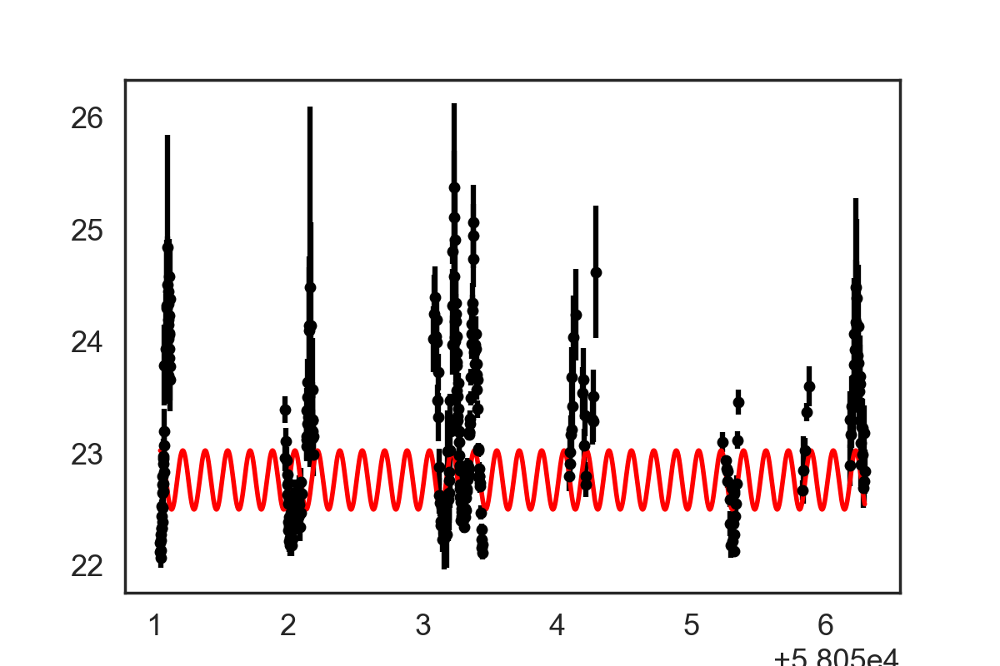

In [140]:
model_time = np.linspace(time[0], time[-1], 2000)

m = sinusoid(model_time, *res.x)

fig, ax = plt.subplots(1, 1, figsize=(6,4))
ax.errorbar(time, mag, yerr=mag_err, fmt="o", markersize=5, color="black", label="data")
ax.plot(model_time, m, color="red", lw=2, label="best-fit model")

In [141]:
# Set up the sampler.
nwalkers, ndim = 200, 3
sampler = emcee.EnsembleSampler(nwalkers, ndim, lpost, threads=4)

# Initialize the walkers.
p0 = res.x + 0.001 * np.random.randn(nwalkers, ndim)

for p in p0:
    print(lpost(p))


-5466.1687792
-6080.86249547
-3954.74496421
-3774.35106886
-6144.72412372
-3604.74044627
-5190.3415977
-6022.09512793
-5857.73563543
-5443.48398655
-3792.80941242
-3322.59876468
-6085.60462694
-5681.01371332
-5636.98911538
-6046.18072611
-3188.39166415
-3539.84727641
-6153.26421235
-4053.56305045
-4180.83931986
-3999.69417368
-6171.70635177
-5731.04364407
-3573.53960027
-3290.39503493
-5348.13375951
-5700.59298792
-5839.17620714
-6116.21780768
-6101.61746799
-5319.96491246
-3421.20826626
-4100.97165014
-4821.90080909
-5411.85229945
-5329.00760718
-4841.89845798
-4909.12615471
-4021.15919594
-3376.02321749
-3355.41207909
-3602.54603929
-5406.14312426
-5210.98635232
-4448.15625801
-4920.96307769
-4081.80480156
-5772.20646446
-3442.28146647
-4176.92157085
-3332.1770955
-5794.1313361
-3954.71937521
-3508.02589809
-4260.79663952
-6194.8831612
-4442.54681495
-4363.05993582
-6076.23450022
-6163.01428542
-5045.65513731
-3888.04515485
-3963.52841343
-4999.07124056
-4999.4633599
-5845.03100394
-

In [142]:
print("Running burn-in")
p0, _, _ = sampler.run_mcmc(p0, 10000)

Running burn-in


<IPython.core.display.Javascript object>


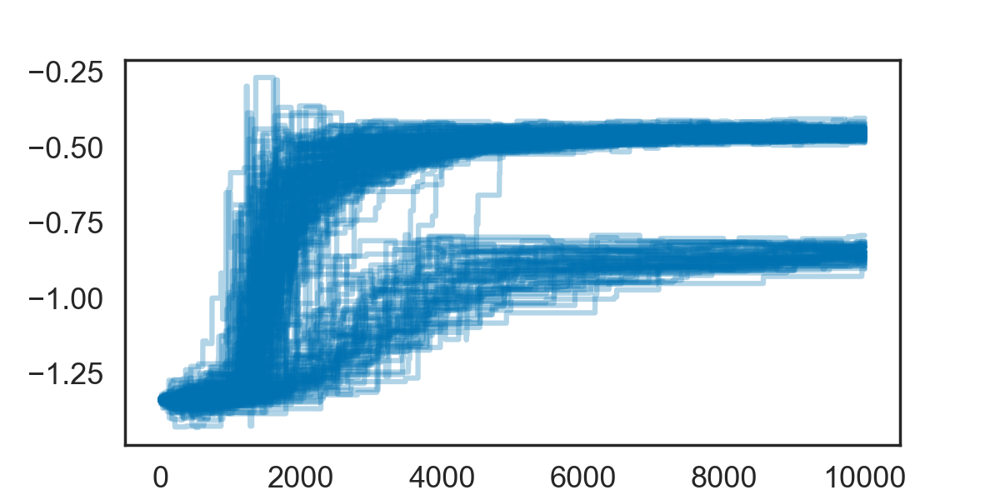

<IPython.core.display.Javascript object>


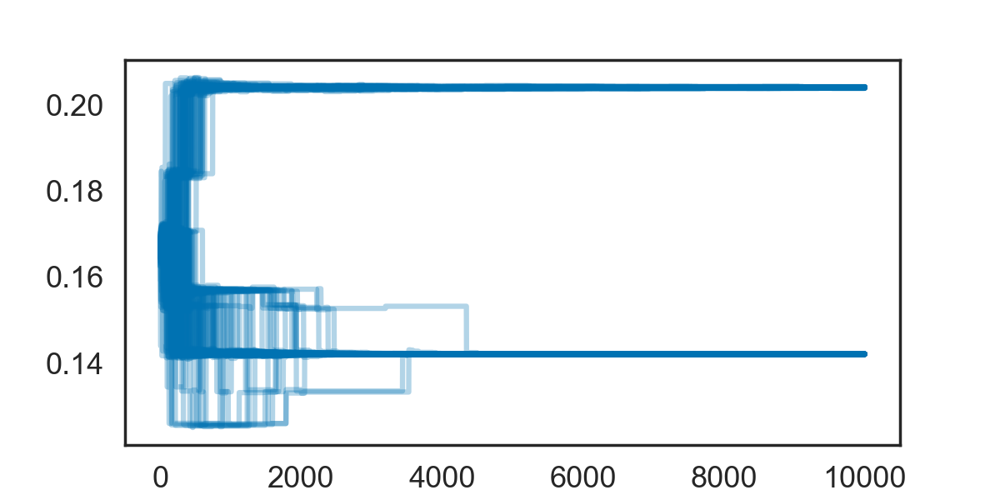

<IPython.core.display.Javascript object>


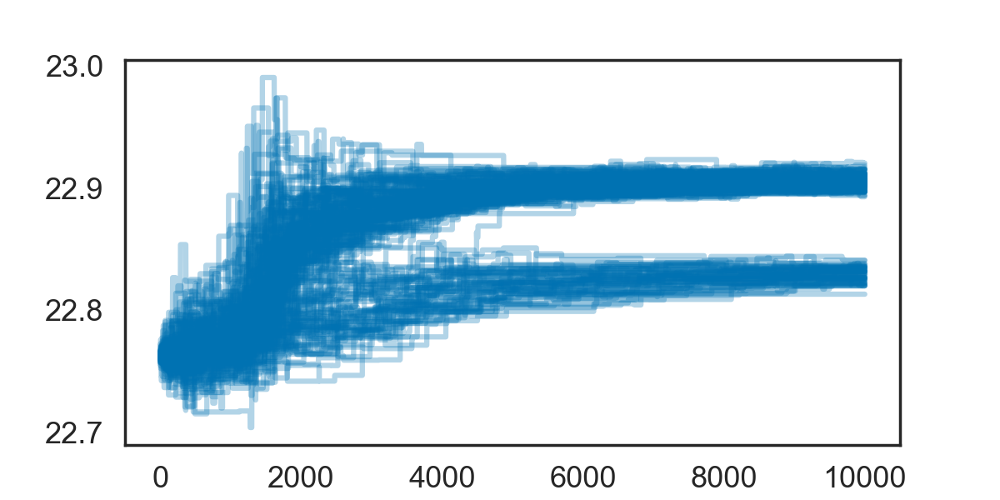

In [143]:
for i in range(ndim):
    fig, ax = plt.subplots(1, 1, figsize=(6,3))
    ax.plot(sampler.chain[:,:,i].T, color=sns.color_palette()[0], alpha=0.3)


In [144]:
flatchain = np.concatenate(sampler.chain[:,-1000:, :], axis=0)
names = ["amplitude", "period in days", "bkg"]
flatchain[:,0] = np.exp(flatchain[:,0])

/opt/local/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


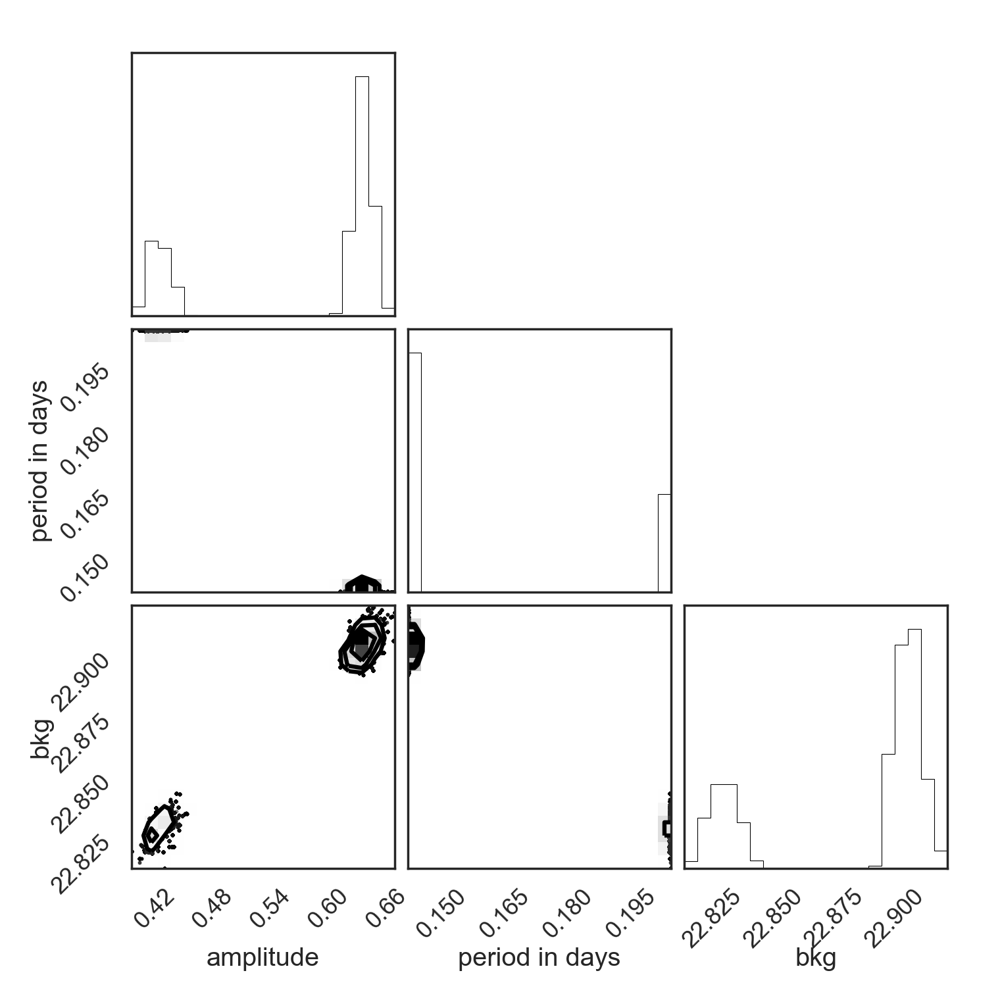

In [145]:
corner.corner(flatchain, labels=names);

In [146]:
np.mean(flatchain[:,1])*24.0

3.8409895007107488

In [147]:
phase = time/0.16374010583452112 % 1
phase *= (2.*np.pi)

max_ind = time.searchsorted(58055.5)

labels = ["0", r"$\frac{1}{2}\pi$", r"$\pi$", r"$\frac{3}{2}\pi$", r"$2\pi$"]
ticks = [0, 0.5*np.pi, np.pi, 1.5*np.pi, 2*np.pi]


In [148]:
unique_obs = add_data.ObsID.unique()

In [149]:
unique_obs

array(['309', '950', 'I11', '568', '695', '705', 'G37'], dtype=object)

/opt/local/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


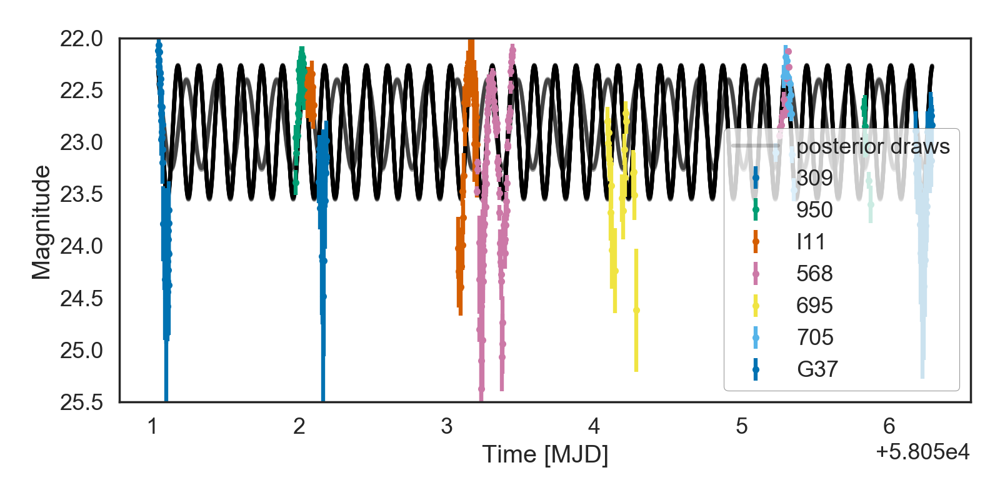

In [151]:
fig, (ax1) = plt.subplots(1, 1, figsize=(8,4))


for i, obs in enumerate(np.array(unique_obs)):
    d = add_data.loc[add_data["ObsID"] == obs]
    t = d.time
    m = d.mag
    me = d.mag_err
    
    ax1.errorbar(t,m, yerr=me,
                 color=sns.color_palette("colorblind", n_colors=len(unique_obs))[i], fmt="o", markersize=4, label=obs)

flatchain = np.concatenate(sampler.chain[:,-1000:, :], axis=0)
for i in range(30):
    # Choose a random walker and step.
    w = np.random.randint(flatchain.shape[0])
    p = flatchain[w]
    m = sinusoid(model_time, p[0], p[1], p[2])
#    # Plot a single sample.
    if i == 0:
        ax1.plot(model_time, m, alpha=0.2, color="black", 
                 label="posterior draws", zorder=0)
        ax2.plot(model_time, m, alpha=0.2, color="black", 
                 label="posterior draws", zorder=0)
    else:
        ax1.plot(model_time, m, alpha=0.2, color="black", zorder=0)
        ax2.plot(model_time, m, alpha=0.2, color="black", zorder=0)


#ax1.set_xlim(58055.2, 58056.32)
ax1.set_xlabel("Time [MJD]")
ax1.set_ylabel("Magnitude");
leg = ax1.legend(frameon=True)
leg.get_frame().set_edgecolor('grey')

ax1.set_ylim(22, 25.5)
ax1.set_ylim(ax1.get_ylim()[::-1])

#ax2.set_xlim(58056.17, max(time)+0.01)
#ax2.set_xlabel("Time [MJD]")
#ax2.set_yticklabels([])
#ax2.set_ylim(22, 25.5)
#ax2.set_ylim(ax2.get_ylim()[::-1])

#ax3.errorbar(phase[:max_ind], mag[:max_ind], yerr=mag_err[:max_ind],
#             color="orange", fmt="o", markersize=4, label="APO data")

#ax3.errorbar(phase[max_ind:], mag[max_ind:], yerr=mag_err[max_ind:],
#             color=sns.color_palette("colorblind")[0], fmt="o", markersize=4, 
#             lw=1, label="DCT data")


#ax3.set_xticks(ticks)
#ax3.set_xticklabels(labels)
#ax3.set_title(r"Folded light curve, $P = 4.07$ hours")
#ax3.set_ylim(ax3.get_ylim()[::-1])
plt.tight_layout()


Let's plot each light curve with posterior draws individually:

/opt/local/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


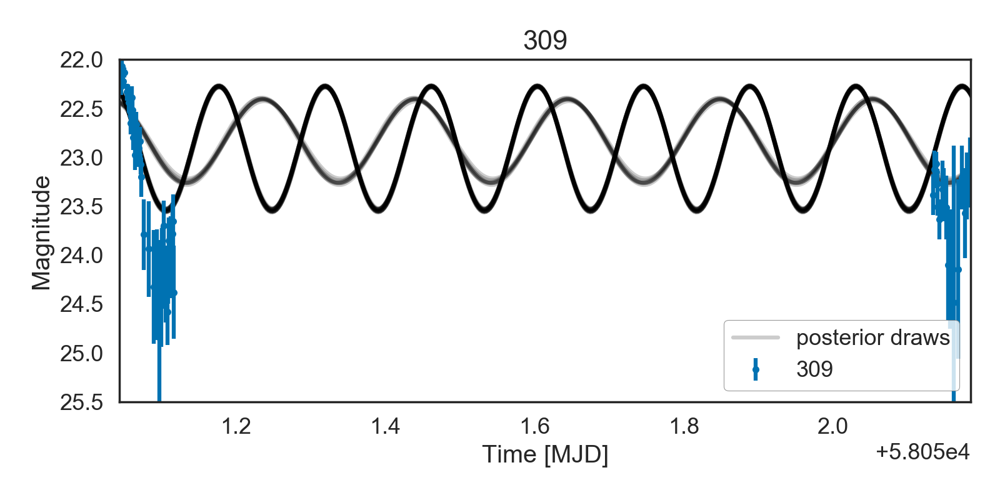

<IPython.core.display.Javascript object>


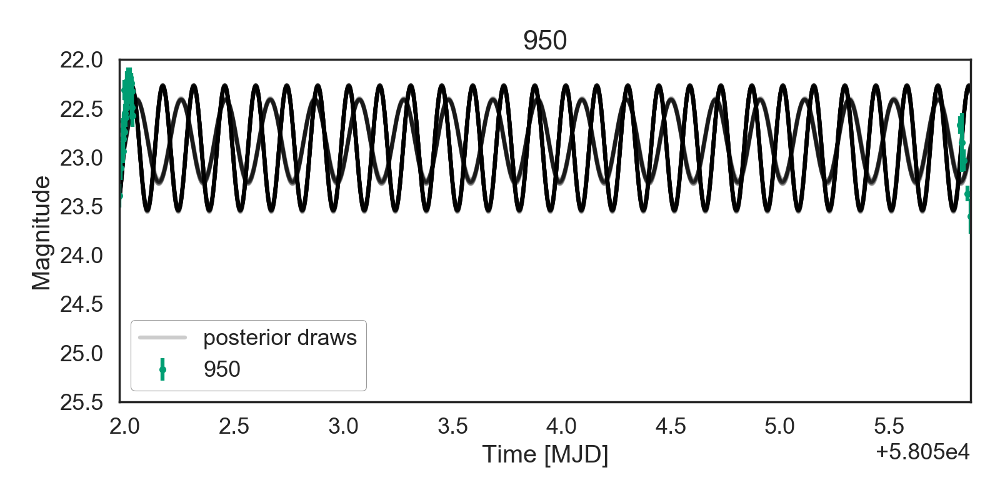

<IPython.core.display.Javascript object>


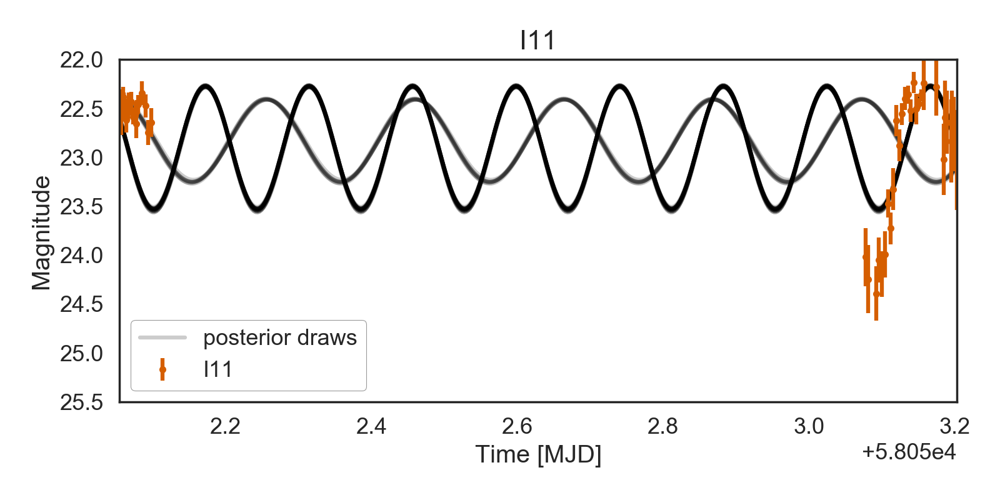

<IPython.core.display.Javascript object>


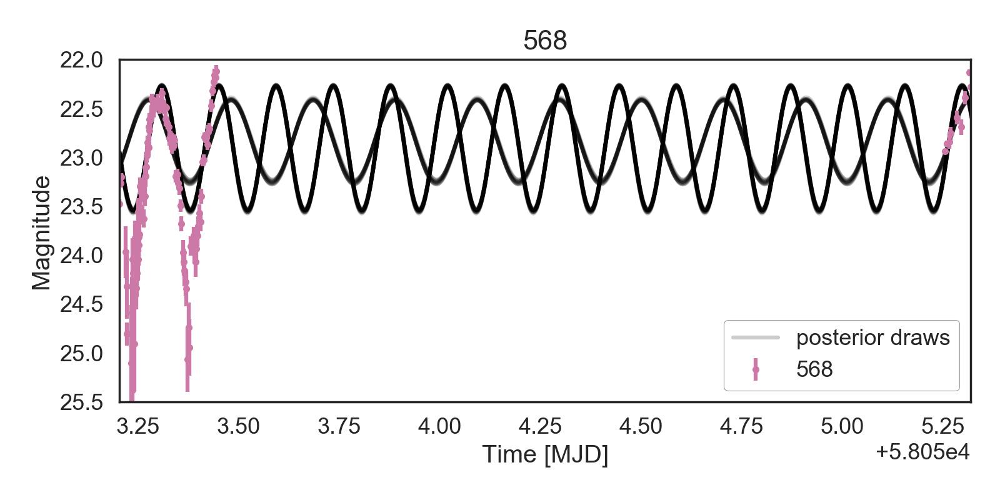

<IPython.core.display.Javascript object>


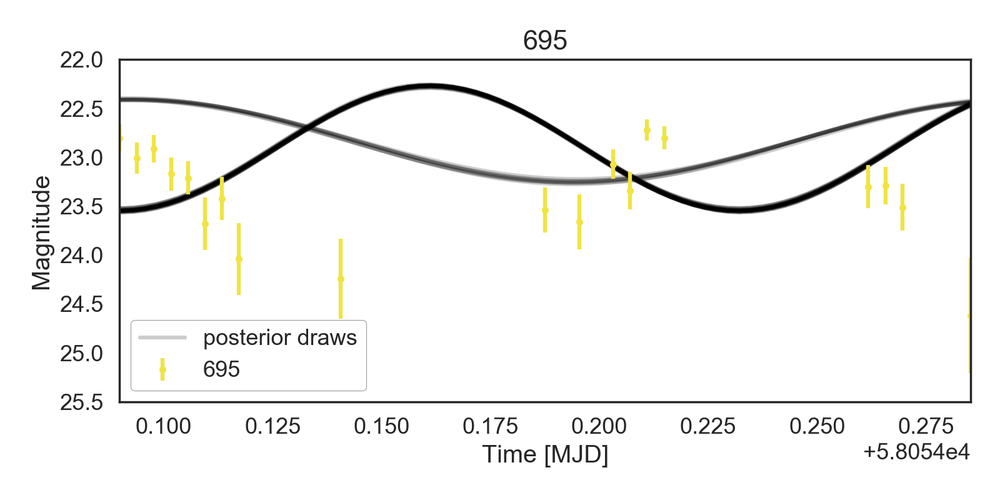

<IPython.core.display.Javascript object>


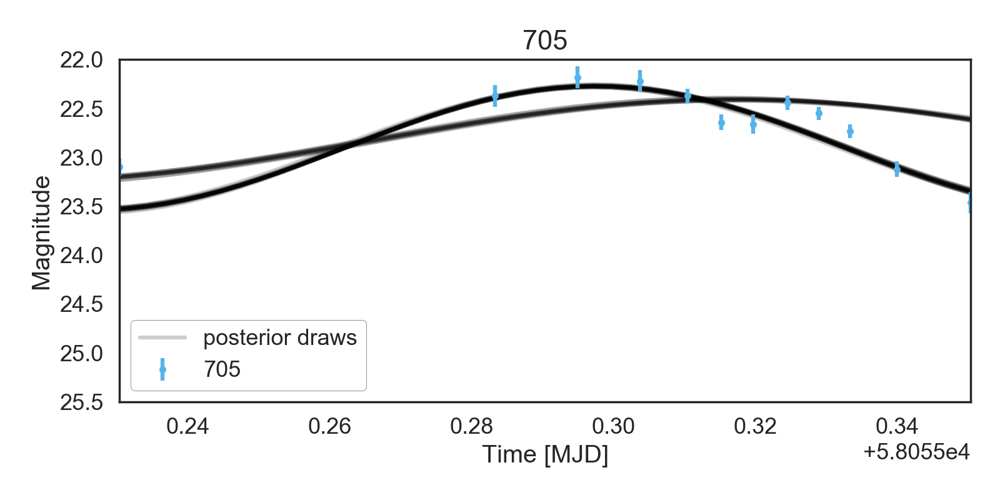

<IPython.core.display.Javascript object>


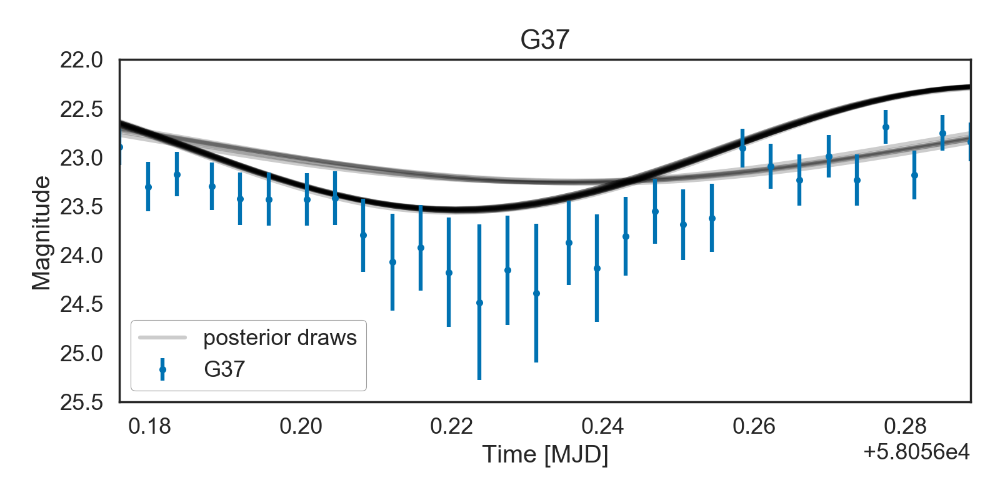

In [154]:


for i, obs in enumerate(np.array(unique_obs)):
    fig, (ax1) = plt.subplots(1, 1, figsize=(8,4))


    d = add_data.loc[add_data["ObsID"] == obs]
    t = np.array(d.time)
    m = np.array(d.mag)
    me = np.array(d.mag_err)
    
    ax1.errorbar(t,m, yerr=me,
                 color=sns.color_palette("colorblind", n_colors=len(unique_obs))[i], fmt="o", markersize=4, label=obs)

    flatchain = np.concatenate(sampler.chain[:,-1000:, :], axis=0)
    for i in range(30):
        # Choose a random walker and step.
        w = np.random.randint(flatchain.shape[0])
        p = flatchain[w]
        m = sinusoid(model_time, p[0], p[1], p[2])
    #    # Plot a single sample.
        if i == 0:
            ax1.plot(model_time, m, alpha=0.2, color="black", 
                     label="posterior draws", zorder=0)
            ax2.plot(model_time, m, alpha=0.2, color="black", 
                     label="posterior draws", zorder=0)
        else:
            ax1.plot(model_time, m, alpha=0.2, color="black", zorder=0)
            ax2.plot(model_time, m, alpha=0.2, color="black", zorder=0)


    #ax1.set_xlim(58055.2, 58056.32)
    ax1.set_xlabel("Time [MJD]")
    ax1.set_ylabel("Magnitude");
    leg = ax1.legend(frameon=True)
    leg.get_frame().set_edgecolor('grey')

    ax1.set_ylim(22, 25.5)
    ax1.set_ylim(ax1.get_ylim()[::-1])

    ax1.set_xlim(t[0], t[-1])
    ax1.set_title(obs)
    plt.tight_layout()



Okay, so I don't think this is working very well.

Let's look at the GP model again:

/opt/local/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


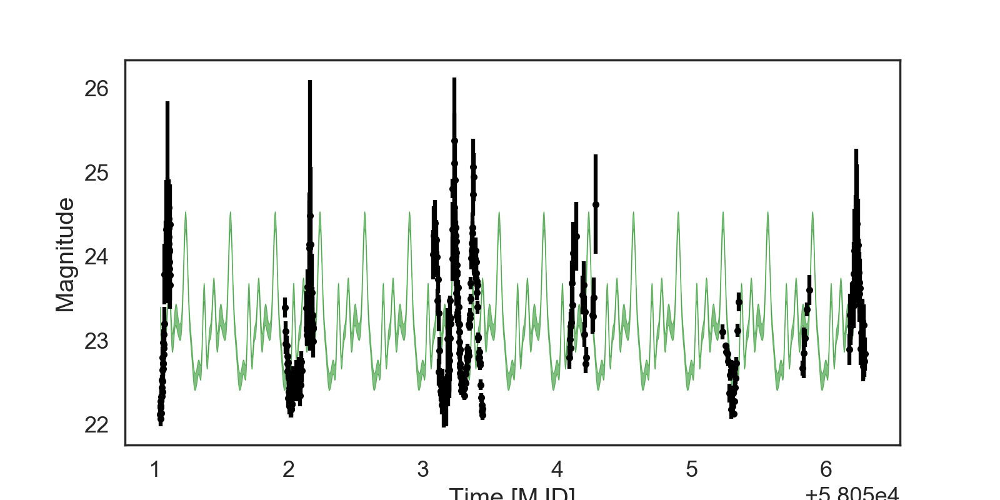

In [155]:
kernel = 10 * kernels.ExpSine2Kernel(gamma=10, log_period=np.log(8/24.0),)

gp = george.GP(kernel, mean=np.mean(mag), fit_mean=True,
               white_noise=np.mean(np.log(mag_err)), fit_white_noise=False)
gp.compute(time)

x = np.linspace(np.min(time), np.max(time), 5000)
mu, var = gp.predict(mag, x, return_var=True)
std = np.sqrt(var)

plt.figure(figsize=(8,4))
plt.errorbar(time, mag, yerr=mag_err,
             color="black", fmt="o", markersize=4)
plt.fill_between(x, mu+std, mu-std, color="g", alpha=0.5)

#plt.xlim(58054, np.max(time)+0.3)
plt.xlabel("Time [MJD]")
plt.ylabel("Magnitude");


In [156]:
# Define the objective function (negative log-likelihood in this case).
def nll(p):
    gp.set_parameter_vector(p)
    ll = gp.log_likelihood(mag, quiet=True)
    return -ll if np.isfinite(ll) else 1e25

# And the gradient of the objective function.
def grad_nll(p):
    gp.set_parameter_vector(p)
    return -gp.grad_log_likelihood(mag, quiet=True)

# You need to compute the GP once before starting the optimization.
gp.compute(time)

# Print the initial ln-likelihood.
print(gp.log_likelihood(mag))


-395.334306638


[ 23.06610006  -0.8367651   61.92586825  -0.15793067]
-162.396739836


/opt/local/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


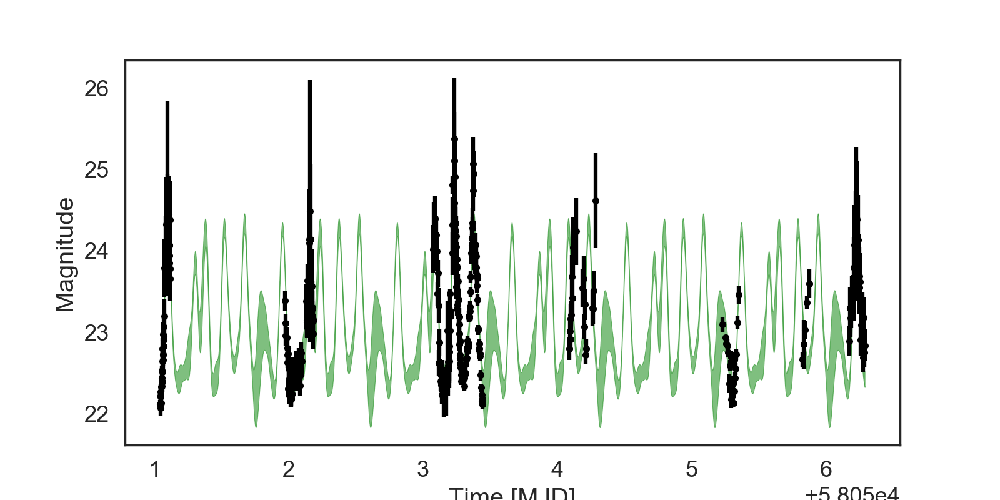

In [157]:

# Run the optimization routine.
p0 = gp.get_parameter_vector()
results = op.minimize(nll, p0, jac=grad_nll, method="L-BFGS-B")

# Update the kernel and print the final log-likelihood.
gp.set_parameter_vector(results.x)
print(results.x)
print(gp.log_likelihood(mag))

x = np.linspace(np.min(time), np.max(time), 5000)
mu, var = gp.predict(mag, x, return_var=True)
std = np.sqrt(var)

plt.figure(figsize=(8,4))
plt.errorbar(time, mag, yerr=mag_err,
             color="black", fmt="o", markersize=4)
plt.fill_between(x, mu+std, mu-std, color="g", alpha=0.5)

plt.xlabel("Time [MJD]")
plt.ylabel("Magnitude");



In [159]:
def lnprob(p):
    
    mean = p[0]
    logamplitude = p[1]
    loggamma = p[2]
    logperiod = p[3]
    
    if mean < -100 or mean > 100:
        #print("boo! 0")
        return -np.inf
    
    # prior on log-amplitude: flat and uninformative
    elif logamplitude < -100 or logamplitude > 100:
        #print("boo! 1")
        return -np.inf
    
    # prior on log-gamma of the periodic signal: constant and uninformative
    elif loggamma < -20 or loggamma > 20:
        #print("boo! 2")
        return -np.inf
        
    # prior on the period: somewhere between 30 minutes and 2 days
    elif logperiod < np.log(1/24) or logperiod > np.log(23/24.0):
        #print("boo! 4")
        return -np.inf
    
    else:
        pnew = np.array([mean, logamplitude, np.exp(loggamma), logperiod])
        #print("yay!")
        # Update the kernel and compute the lnlikelihood.
        gp.set_parameter_vector(pnew)
        return gp.lnlikelihood(mag, quiet=True)


In [160]:
pnew = np.zeros(4)
pnew[0] = 23
pnew[1] = 2
pnew[2] = np.log(10)
pnew[3] = np.log(4/24)

lnprob(pnew)

-539.63700683088393

In [161]:
gp.compute(time)

# Set up the sampler.
nwalkers, ndim = 100, len(gp)
sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, threads=1)

# Initialize the walkers.
p0 = pnew + 0.01 * np.random.randn(nwalkers, ndim)

for p in p0:
    print(lnprob(p))


-548.33723769
-540.573926551
-567.942087699
-441.154214889
-571.636734035
-546.859163338
-432.793219136
-489.580268065
-515.970615933
-475.169706923
-563.386743119
-542.519906785
-538.726691107
-528.704695662
-442.543560165
-566.093508479
-562.280534099
-539.360477694
-535.975514534
-546.11745448
-499.85130336
-547.302945246
-509.657873679
-540.473100136
-433.92062637
-568.040314999
-571.075889643
-546.97179828
-573.164941024
-446.535144219
-537.928039141
-470.790555126
-494.051709753
-542.008013058
-548.511884945
-471.343246577
-570.562093887
-518.322063471
-451.199650072
-444.300971448
-571.113180013
-551.487730661
-565.895207063
-458.845096164
-438.092548961
-526.204820463
-546.806695983
-536.700129425
-443.323037824
-547.374058506
-573.4841489
-463.535491636
-573.331087581
-463.513476883
-451.445150269
-437.404181018
-556.611400321
-540.928680767
-553.923959229
-541.284518154
-543.571309735
-548.236306864
-574.739910409
-452.086992196
-531.610079585
-553.084421013
-561.663331377
-5

In [165]:
print("Running burn-in")
p0, _, _ = sampler.run_mcmc(p0, 2000)

Running burn-in


/opt/local/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


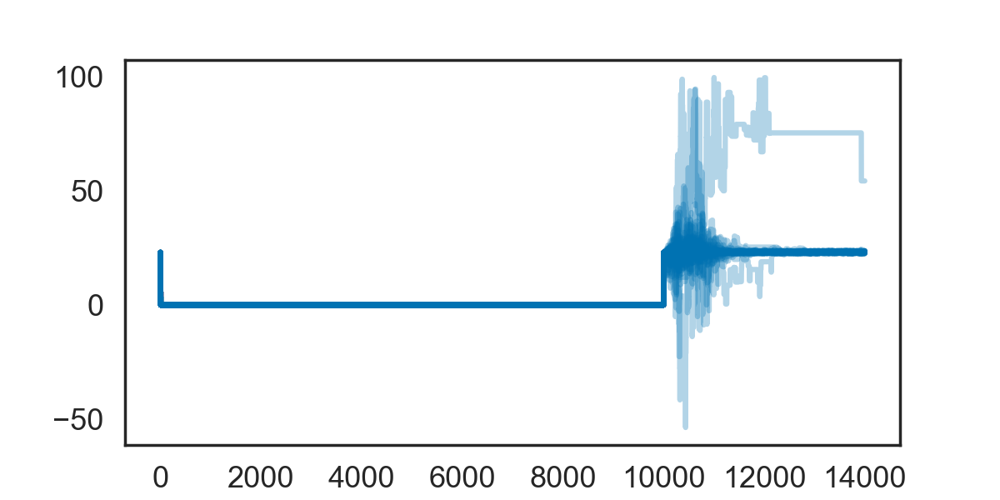

<IPython.core.display.Javascript object>


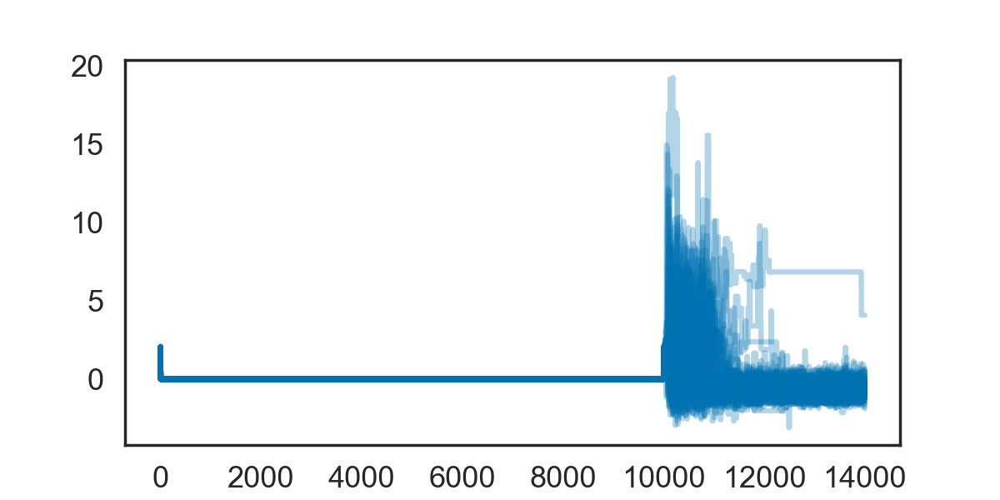

<IPython.core.display.Javascript object>


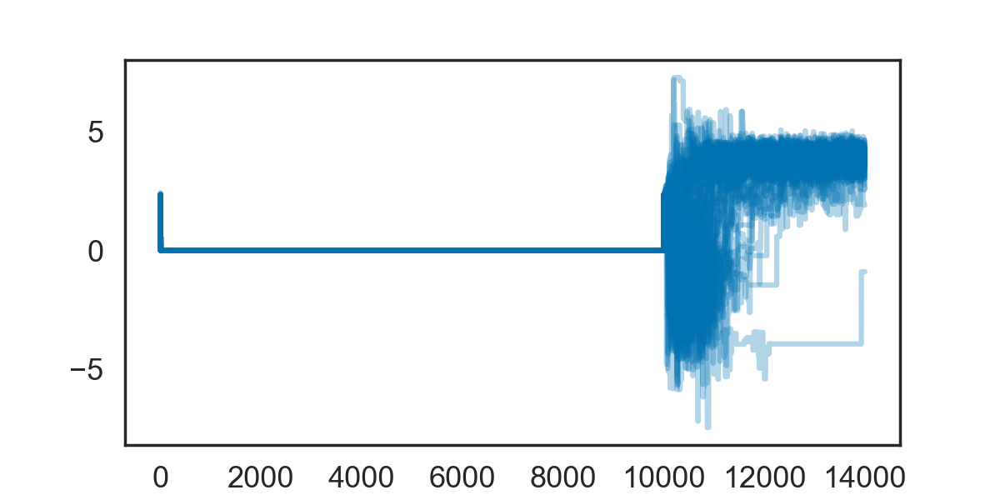

<IPython.core.display.Javascript object>


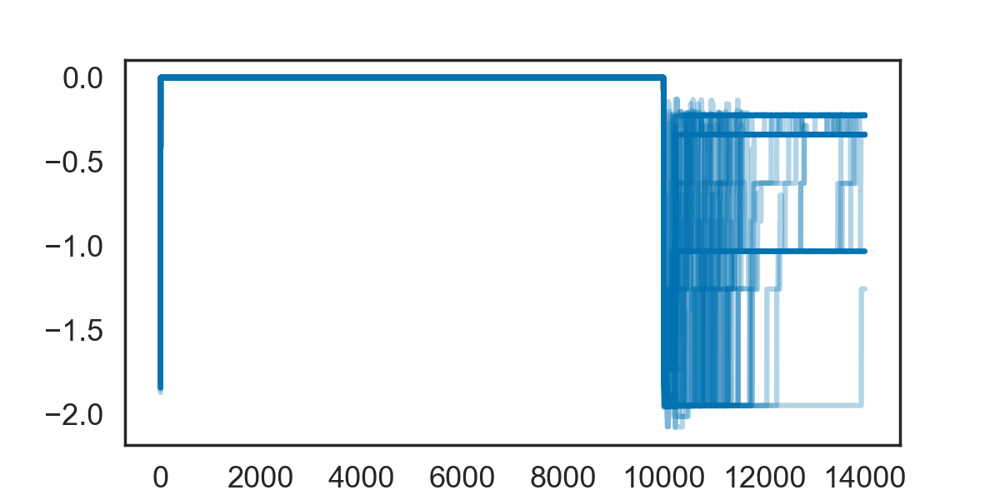

In [166]:
for i in range(ndim):
    fig, ax = plt.subplots(1, 1, figsize=(6,3))
    ax.plot(sampler.chain[:,:,i].T, color=sns.color_palette()[0], alpha=0.3)


In [167]:
flatchain = np.concatenate(sampler.chain[:,-500:,:], axis=0)

In [185]:
flatchain[:,-1] = np.exp(flatchain[:,-1])

In [189]:
flatchain[:,-1] *= 24

/opt/local/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


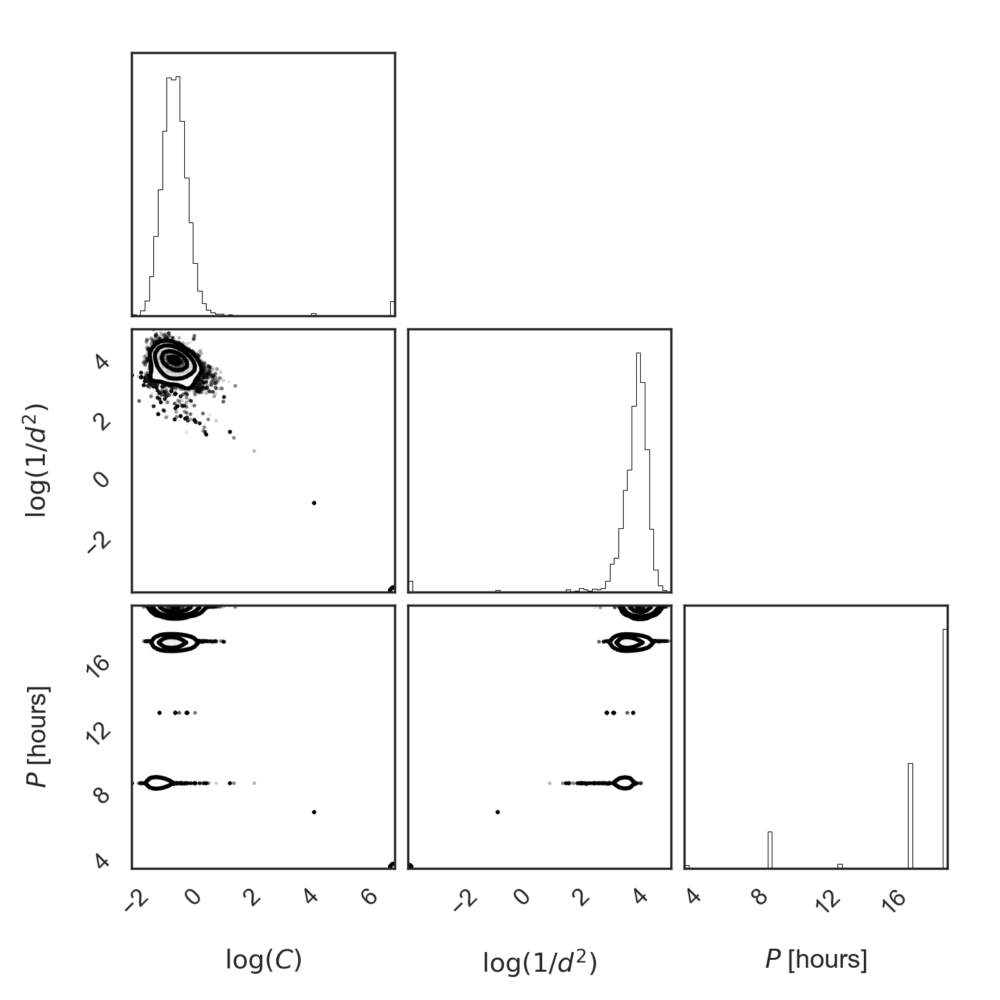

In [190]:
fig = corner.corner(flatchain[:,1:], labels=["$\log(C)$", r"$\log(1/d^2)$", "$P$ [hours]"], bins=60, smooth=1);
axes = fig.get_axes()
#plt.savefig("comet_gp_corner.eps", format="eps", frameon=True)

In [175]:
lnprob = np.concatenate(sampler.lnprobability[:,-500:], axis=0)

In [176]:
lnprob.shape

(50000,)

In [178]:
w

(array([8128]),)

In [182]:
max_pars

array([[ 23.17072966,  -0.73470618,   4.00100925,  -0.22456059]])

-129.615386784


/opt/local/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


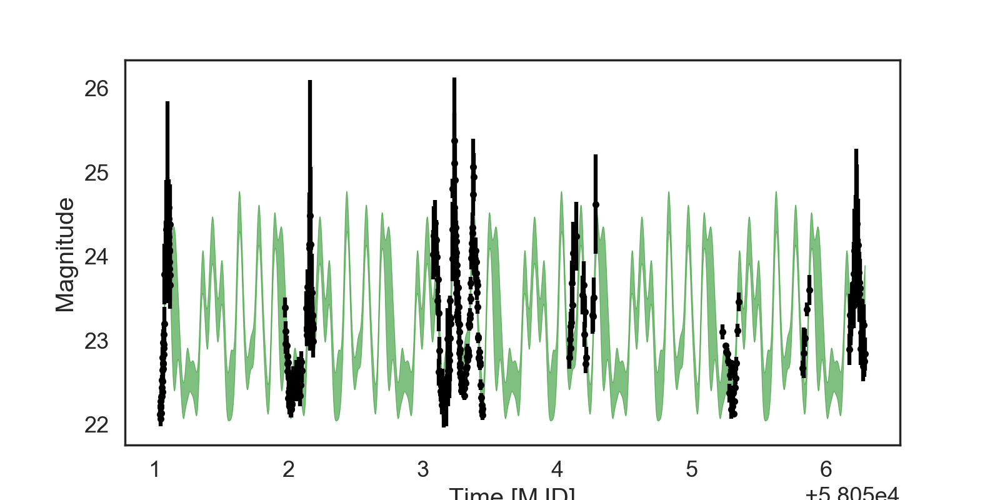

In [183]:
f = flatchain[:,-1]

w = np.where(lnprob == np.max(lnprob))


max_ind = w[0][0]

max_pars = np.hstack(flatchain[w])
# Update the kernel and print the final log-likelihood.
max_pars = [max_pars[0], max_pars[1], np.exp(max_pars[2]), max_pars[3]]

gp.set_parameter_vector(max_pars)
print(gp.log_likelihood(mag))

x = np.linspace(np.min(time), np.max(time), 5000)
mu, var = gp.predict(mag, x, return_var=True)
std = np.sqrt(var)

plt.figure(figsize=(8,4))
plt.errorbar(time, mag, yerr=mag_err,
             color="black", fmt="o", markersize=4)
plt.fill_between(x, mu+2*std, mu-2*std, color="g", alpha=0.5)

plt.xlabel("Time [MJD]")
plt.ylabel("Magnitude");

That looks ... confusing. 

Let's do the runs that Bryce suggested I do. I think the first one is everything, so that should be above.

### 